In [11]:
# !pip install pandas
import pandas as pd
# df= pd.read_csv('/Users/isabellelorge/Desktop/DEBAGREEMENT_data/labeled_data.csv')
pkl_df= pd.read_pickle('/Users/isabellelorge/Desktop/DEBAGREEMENT_data/labeled_data.pkl')

In [19]:
d = {}
for s in df['common']:
    for e in s:
        if e in d:
            d[e] +=1
        else:
            d[e]=1

In [16]:
#need to resolve coreferences 
d = {}
for s in df['parent_ents']:
    for e in s:
        if e in d:
            d[e] +=1
        else:
            d[e]=1

In [19]:
#need to resolve coreferences 
d = {}
for s in df['child_ents']:
    for e in s:
        if e in d:
            d[e] +=1
        else:
            d[e]=1

In [20]:
print(sorted({(k, v) for k, v in d.items()}, key =lambda x: x[1], reverse=True))

[('EU', 3869), ('UK', 3575), ('Trump', 1487), ('Brexit', 1398), ('Biden', 1024), ('US', 748), ('British', 665), ('Republicans', 576), ('Democrats', 541), ('Republican', 400), ('American', 375), ('America', 370), ('China', 321), ('Bernie', 305), ('Europe', 295), ('GOP', 287), ('Ireland', 284), ('Americans', 272), ('Boris', 271), ('Britain', 248), ('republicans', 246), ('democrats', 242), ('Democrat', 241), ('Johnson', 211), ('BLM', 210), ('republican', 206), ('NI', 203), ('Scotland', 202), ('Dems', 201), ('English', 191), ('USA', 190), ('Senate', 178), ('Tories', 174), ('U.K.', 172), ('Irish', 171), ('France', 165), ('Germany', 163), ('European', 162), ('Russia', 151), ('Canada', 149), ('WTO', 145), ('England', 144), ('senate', 138), ('Congress', 137), ('London', 134), ('Texas', 133), ('Hillary', 133), ('Joe', 129), ('democrat', 129), ('California', 128), ('Brexiteers', 119), ('Brits', 118), ('Russian', 114), ('Democratic', 112), ('Australia', 112), ('Florida', 108), ('Spain', 106), ('G

In [20]:
print(sorted({(k, v) for k, v in d.items()}, key =lambda x: x[1], reverse=True))

[('people', 1563), ('trump', 890), ('deal', 842), ('vote', 701), ('year', 531), ('government', 463), ('country', 458), ('climate', 445), ('voter', 407), ('change', 366), ('time', 364), ('state', 356), ('election', 348), ('brexit', 347), ('party', 308), ('thing', 302), ('trade', 262), ('right', 246), ('money', 241), ('way', 231), ('voting', 226), ('border', 200), ('problem', 188), ('%', 183), ('president', 176), ('world', 176), ('police', 168), ('job', 162), ('politic', 161), ('news', 159), ('life', 151), ('law', 150), ('politician', 149), ('company', 149), ('point', 142), ('economy', 142), ('tax', 140), ('referendum', 140), ('racism', 139), ('extension', 138), ('brexiteer', 137), ('medium', 132), ('democrat', 131), ('republican', 129), ('carbon', 122), ('power', 122), ('gun', 118), ('shit', 117), ('article', 116), ('democracy', 115), ('post', 113), ('war', 112), ('action', 110), ('agreement', 109), ('market', 106), ('side', 106), ('racist', 104), ('rule', 104), ('eu', 102), ('supporter

In [67]:
# stance_test = pd.read_csv('/Users/isabellelorge/Desktop/test_stance.csv')

In [3]:
stance_df = pd.read_csv('/Users/isabellelorge/Desktop/debagreement_data/training_stance.csv')

In [56]:
# stance_df['sentences'] = stance_df['Tweet'] + ' [SEP] ' + stance_df['Target'] + ' [SEP] '
# stance_test['sentences'] = stance_test['Tweet'] + ' [SEP] ' + stance_test['Target'] + ' [SEP] '
# l = ['AGAINST', 'NONE', 'FAVOR']
# stance_df['label'] = stance_df['Stance'].apply(lambda x: l.index(x))
# stance_test['label'] = stance_test['Stance'].apply(lambda x: l.index(x))
# stance_test['labels'] = stance_test['label']
# stance_df['labels'] = stance_df['label']

In [4]:
# stance_df = stance_df.drop('label', axis = 1)
stance_df_sub = stance_df[stance_df['labels'] != 1]
stance_df_sub

,Unnamed: 0.1,Unnamed: 0,ID,Target,Tweet,Stance,Opinion towards,Sentiment,sentences,labels
0,0,0,101,Atheism,dear lord thank u for all of ur blessings forg...,AGAINST,OTHER,POSITIVE,dear lord thank u for all of ur blessings forg...,0
1,1,1,102,Atheism,"Blessed are the peacemakers, for they shall be...",AGAINST,OTHER,POSITIVE,"Blessed are the peacemakers, for they shall be...",0
2,2,2,103,Atheism,I am not conformed to this world. I am transfo...,AGAINST,OTHER,POSITIVE,I am not conformed to this world. I am transfo...,0
3,3,3,104,Atheism,Salah should be prayed with #focus and #unders...,AGAINST,OTHER,POSITIVE,Salah should be prayed with #focus and #unders...,0
4,4,4,105,Atheism,And stay in your houses and do not display you...,AGAINST,OTHER,NEGATIVE,And stay in your houses and do not display you...,0
...,...,...,...,...,...,...,...,...,...,...
2809,2809,2809,2910,Legalization of Abortion,"There's a law protecting unborn eagles, but no...",AGAINST,TARGET,NEGATIVE,"There's a law protecting unborn eagles, but no...",0
2810,2810,2810,2911,Legalization of Abortion,I am 1 in 3... I have had an abortion #Abortio...,AGAINST,OTHER,NEITHER,I am 1 in 3... I have had an abortion #Abortio...,0
2811,2811,2811,2912,Legalization of Abortion,How dare you say my sexual preference is a cho...,AGAINST,OTHER,NEGATIVE,How dare you say my sexual preference is a cho...,0
2812,2812,2812,2913,Legalization of Abortion,"Equal rights for those 'born that way', no rig...",AGAINST,OTHER,NEGATIVE,"Equal rights for those 'born that way', no rig...",0


In [5]:
# !pip3 install sentence_transformers
from sentence_transformers import SentenceTransformer
from scipy import spatial
model = SentenceTransformer('all-mpnet-base-v2')

cos_labels = []

#Our sentences we like to encode
for i, tweet in stance_df_sub['Tweet'].iteritems():
    print(i)
    e = stance_df_sub['Target'].loc[i]
    s = 'I am for ' + e + '.'
    s2 = 'I am against ' + e + '.'
    print(s, s2)
    print(tweet)
#         e = model.encode(sent)
    e = model.encode(tweet)
    e_for = model.encode(s)
    e_against = model.encode(s2)
    cos_for = 1- spatial.distance.cosine(e, e_for)
    cos_against = 1 - spatial.distance.cosine(e, e_against)
#     print(cos_for, cos_against)
    if cos_for > cos_against:
        cos_labels.append(2)
    else:
        cos_labels.append(0)

/usr/local/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


0
I am for Atheism. I am against Atheism.
dear lord thank u for all of ur blessings forgive my sins lord give me strength and energy for this busy day ahead #blessed #hope #SemST
1
I am for Atheism. I am against Atheism.
Blessed are the peacemakers, for they shall be called children of God. Matthew 5:9 #scripture #peace #SemST
2
I am for Atheism. I am against Atheism.
I am not conformed to this world. I am transformed by the renewing of my mind. #ISpeakLife #God #2014 #SemST
3
I am for Atheism. I am against Atheism.
Salah should be prayed with #focus and #understanding. #Allah warns against #lazy prayers done just for #show Surah Al-Maoon 107:4-6 #SemST
4
I am for Atheism. I am against Atheism.
And stay in your houses and do not display yourselves like that of the times of ignorance." [Quran 33:33].#islam #SemST
5
I am for Atheism. I am against Atheism.
If we are unsure whether something is halal or haram, we should leave it - this will #safeguard our #deen #rule #SemST
6
I am for Athe

67
I am for Atheism. I am against Atheism.
God never gives us anything we can't handle - it's either a victory or a lesson ....have an amazing day!! #inspiration #believe #SemST
68
I am for Atheism. I am against Atheism.
You don't run a thing till you run it to the King. #SemST
69
I am for Atheism. I am against Atheism.
God wouldn't invest His anointing in your life if he wasn't going to bless you. #GOTFAITH #SAYYES #SemST
70
I am for Atheism. I am against Atheism.
@latikia @seangillies Yeah, right? Lol wink wink nudge nudge. The greatest part is how "God's" playing along! #religiondoesharm #SemST
71
I am for Atheism. I am against Atheism.
God has not given us a spirit of fear and timidity,but of power, love,and self-discipline. 2 Timothy 1:7 #fearless #Conqueror #God #SemST
72
I am for Atheism. I am against Atheism.
The sexiest thing you can carry right now is a BIBLE  #accessory #Christian #SemST
73
I am for Atheism. I am against Atheism.
#Scientists say that #iron is not from #earth

131
I am for Atheism. I am against Atheism.
Let my heart find strength in Your presence #SemST
132
I am for Atheism. I am against Atheism.
When you've done everything you can do, that's when God will step in, and do what you cannot do #islam #SemST
133
I am for Atheism. I am against Atheism.
No matter how things look, know that #God is still in control. Stay in peace, knowing that He will always be with you. #SemST
134
I am for Atheism. I am against Atheism.
Whoever is not kind to the younger ones, or does not respect the elders is not from my nation" -Prophet Muhammad (PBUH #islam #SemST
135
I am for Atheism. I am against Atheism.
People may leave you but #God will never do #islam #SemST
137
I am for Atheism. I am against Atheism.
I am not a fool who dies in want of wisdom, but the words from my mouth feed many -Prov. 10:21 #SemST
138
I am for Atheism. I am against Atheism.
In #Christ we are righteous, and in practice, we are being conformed to His image.~ Chip Ingram #Quote #FB #Team

201
I am for Atheism. I am against Atheism.
For no one can lay any foundation other than the one that has been laid, that foundation is #Christ. #SemST
205
I am for Atheism. I am against Atheism.
I will dwell in a peaceful habitation, in secure dwellings, and in quiet resting places -Isa. 32:18 #SemST
207
I am for Atheism. I am against Atheism.
@wordsporns @TheComedyHumor. I'd rather go to hell then worship some Image created by whites... #SemST
208
I am for Atheism. I am against Atheism.
I bought the world and sold my heart, You traded heaven to have me again. #SemST
210
I am for Atheism. I am against Atheism.
Therefore Iwilllook unto theLord; Iwill wait for the God of my salvation: my Godwillhear me. Micah 7:7 #tcot #pjnet #ccot #SemST
211
I am for Atheism. I am against Atheism.
RT @NikeAdeyemi: Faithfulness actually means 'full of faith'. Beyond service and commitment, your heart shld be full of faith. #RWAtl #SemST
212
I am for Atheism. I am against Atheism.
I bind and cast out eve

302
I am for Atheism. I am against Atheism.
God didn't call us to change people, that's His job. He called us to share the gospel. #SemST
303
I am for Atheism. I am against Atheism.
God is faithful, his gospel is powerful, and the Spirit is transforming. #church #Sunday #SemST
304
I am for Atheism. I am against Atheism.
They were all filled with the Holy Spirit and began to speak in foreign tongues as the Holy Spirit prompted them to speak #SemST
305
I am for Atheism. I am against Atheism.
I'm not reading that mother fucking book because a human wrote it! #religiousfreedom #Humanslie #SemST
306
I am for Atheism. I am against Atheism.
@AmyMek The establishment clause sets our country apart and prevents the radical religious zealots from taking charge.  Respect it #SemST
307
I am for Atheism. I am against Atheism.
@moealqadi Why #buddhism works! We except ALL as they R. No judgement Mexican-American #socialjustice #worldpeace #happy #freedom #SemST
308
I am for Atheism. I am against Athe

369
I am for Atheism. I am against Atheism.
#WhatIKnowAboutIslam helped me 2 find The Truth in other religions #Christianity #Buddhism #Judaism & in #SemST
370
I am for Atheism. I am against Atheism.
@antgerrard86 it is. faith means believing in something without evidence and with that you can justify anything. #scary #SemST
371
I am for Atheism. I am against Atheism.
1 Cor 15:58 ...stand firm...Always give yourselves fully to the work of the #Lord...your labor in the Lord is not in vain > #God #SemST
372
I am for Atheism. I am against Atheism.
Happiness is the pursuit of life and liberty. #TheLUPOL #theism #futurism #SemST
374
I am for Atheism. I am against Atheism.
RT @prayerbullets: The man of God is humble in spirit; he retains honor -Prov. 29:23 #SemST
375
I am for Atheism. I am against Atheism.
Restore to me the joy of your salvation and grant me a willing spirit, to sustain me. (Psalm 51:12 NIV) #WordOfLife #SemST
376
I am for Atheism. I am against Atheism.
How did the crucifixi

431
I am for Atheism. I am against Atheism.
You have got to make up in your mind that you are going to trust God to guide you no matter what it looks like. He will do it! #SemST
432
I am for Atheism. I am against Atheism.
#ChristianPrivilege is knowing that only your prayer will be promoted in #abed public #schools like #taber #glendon #ftsask #SemST
433
I am for Atheism. I am against Atheism.
@bdutt @lalitkmodi @mohdasim1  ohh .so i think why r u seculr ... nice friend #SemST
434
I am for Atheism. I am against Atheism.
Instead of : "Let's have a quick word of prayer before we start." Try: "Let's be quick to pray before we start." #undefeated #fca #SemST
435
I am for Atheism. I am against Atheism.
I pray for a hedge of protection around my mind, body, finances, possessions, and family in the name of Jesus. #SemST
436
I am for Atheism. I am against Atheism.
When we spend time in God's presence, the burdens we carry are transferred from our shoulders to more capable ones--His. #SemST
437

485
I am for Atheism. I am against Atheism.
Be still. Be patient. Watch and let God work. #SemST
486
I am for Atheism. I am against Atheism.
Do you feel your ancient roots? Look around you. Everything is our brother and sister. #spirituality #SemST
487
I am for Atheism. I am against Atheism.
Serious question for my atheist libertarians: How can rights exist without God? #ChristianLibertarian #SemST
488
I am for Atheism. I am against Atheism.
Getting good at biting my tongue with my totally brainwashed 'Xtian family. It can be so tiring & very annoying at times. #SemST
489
I am for Atheism. I am against Atheism.
I bind and rebuke the angel of light in the name of Jesus -2 Cor. 11:14 #SemST
490
I am for Atheism. I am against Atheism.
Tomorrow is promised to no one, so cherish the people #God has placed in your life today! #SemST
491
I am for Atheism. I am against Atheism.
Give us this day our daily bread, and forgive us our sins as we forgive those who sin against us. #rosary #God #teamj

541
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
When debunking climate myths: fight sticky myths with stickier facts, mention the myth and explain the fallacy!  #SemST
544
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
@MarkRuffalo @flea333 @kellyslater unfortunate how USA refuses to take seriously damage we're responsible for #SaveTheEarth  #SemST
550
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Why all talks #Rainforests? 1/6 of the World Russia is not less important ! #DoctorCarbon Advocate #sustainability !   #SemST
551
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
A lot of damage is being done every day. But we are going to win this. #yrcannes #CannesLions #SemST
553
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
@worldfarmersorg congress. @BartoliniMatteo :Dutch 

632
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Did u know th #SCOTUS is 2 Decide If #Coal Plants Can Keep #Emitting Unlimited #Mercury 2 r atmosphere? #POTUS #Gop #Justices #SemST
634
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Is there a breeze i can catch Lakefront or will I die of a heat stroke there as well? #heatstroke #SemST
635
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Fossil fuel divestment won't necessarily stop climate change but it is a step in the right direction. #keepitintheground #SemST
639
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
loud ass thunder and three seconds of rain here #thanksobama #SemST
640
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
When your wearing sweaters in the summer #SemST
645
I am for Climate Change is a Real Concern. I

719
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Can we build #thorium #LFTR now. Before its 200 degrees during summer. #MyACSucks #SemST
720
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
what is at stake is the survival of our and next generation - Indigenous People Youth #UNGA #Action2015 #COP21 #SemST
721
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Stress on #water resources threatens lives and livelihoods #anthropoceneage #sustainability #SemST
724
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
. @JanezPotocnik22:The EU is spending the 300 billion collected through environmental tax on fossil fuel subsidies #Almedalen #SemST
726
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
#SCOTUS,  We need to force #power #plants To cut #emissions of #mercury and other #air poll

779
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Pupils in P5-7 from Lincluden Primary are participating in Carbon Busters Project 2015-2016! #LearningForSustainability #SemST
780
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Around 1500 new homes being built every year in England in areas at high risk of #floods, adding to risk from #UKClimate2015 #SemST
781
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Top-down approach is not only the solution , global governments must act together with global community against #SemST
784
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
How did the #GreatBarrierReef look to you compared to when you dived it 60 years ago? @POTUS #Attenborough @ForeignOfficial #SemST
787
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
#Mission:#Climate @ h

835
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Just read Scalia's idiotic opinion overturning the EPA's carbon emissions limits. Planning to spend day in a seething rage. #SemST
836
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Don't act as if we have another planet to live in #COP21 #SemST
838
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
(1/2) Poisoning of the #Biosphere cannot be dealt with by free market economics;  #TaxWallStreet #Environment #GMO #SemST
840
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Everyone is busy building their bank accounts but one day that paper won't help you during massive natural calamities. #SemST
843
I am for Climate Change is a Real Concern. I am against Climate Change is a Real Concern.
Second heatwave hits NA NW popping up everywhere, and floods too, record wildfires in c

908
I am for Feminist Movement. I am against Feminist Movement.
Always a delight to see chest-drumming alpha males hiss and scuttle backwards up the wall when a feminist enters the room. #manly #SemST
909
I am for Feminist Movement. I am against Feminist Movement.
Sometimes I overheat and want to take off my shirt but can't because of social expectations of people with breasts. ;n; #SemST
910
I am for Feminist Movement. I am against Feminist Movement.
If feminists spent 1/2 as much time reading papers as they do tumblr they would be real people, not ignorant sexist bigots. #SemST
911
I am for Feminist Movement. I am against Feminist Movement.
Stupid Feminists, the civilization you take for granted was built with the labour, blood sweat and tears of men. #SemST
912
I am for Feminist Movement. I am against Feminist Movement.
YOU'RE A GIRL AND HAVE A SEX DRIVE!? YOU MUST BE A SLUT! #feminist #SemST
913
I am for Feminist Movement. I am against Feminist Movement.
Suns out....  Dresses out..

966
I am for Feminist Movement. I am against Feminist Movement.
@BruiseAurora i'm advocating men to stop loving women. Just have sex with them . #everydaysexism #SemST
967
I am for Feminist Movement. I am against Feminist Movement.
I NEED FEMINISM BECAUSE- A man in a room full of women is ecstatic. A woman in a room full of men is terrified. #SemST
968
I am for Feminist Movement. I am against Feminist Movement.
Why is Paul Elam not one of the most hated men alive right now!? #feminist #SemST
969
I am for Feminist Movement. I am against Feminist Movement.
Yes women it's not fair that men staying at home is shamed by society. We must change ppl additudes  #everydaysexism #SemST
970
I am for Feminist Movement. I am against Feminist Movement.
Watching #missrepresentation .. We must change our world. #womenrule #change #beauty #SemST
971
I am for Feminist Movement. I am against Feminist Movement.
I won't complain about equal rep of girls in gaming. Princess Peach & Zelda are kick-ass women.

1032
I am for Feminist Movement. I am against Feminist Movement.
@evelynlns @jes_chastain Agree 100 %! She radiates beauty from the inside out. Such a role model for all  #SemST
1033
I am for Feminist Movement. I am against Feminist Movement.
Anyone else starting to notice the general demographic of feminists is like fucking high-schoolers. #SemST
1034
I am for Feminist Movement. I am against Feminist Movement.
Sexism is power plus prejudice? So Anita is sexist by her own definition because of her new title in time #Anitasarkeesian #SemST
1035
I am for Feminist Movement. I am against Feminist Movement.
Women are strong, women are smart, women are bold. #FeministsAreBeautifulisalovemovement #SemST
1036
I am for Feminist Movement. I am against Feminist Movement.
Want revenge for being a slut?  Cry rape.  Then lie to the world and carry a mattress with you.  #rape #UglyFeminist #SemST
1038
I am for Feminist Movement. I am against Feminist Movement.
Gotta love the respect feminists give to

1091
I am for Feminist Movement. I am against Feminist Movement.
Every time I was told I was bossy rather than assertive I took it as a compliment, #SemST
1092
I am for Feminist Movement. I am against Feminist Movement.
The most upsetting of all of these however, was when I was greeted with shock and disgust for the fact I have ambition and #SemST
1093
I am for Feminist Movement. I am against Feminist Movement.
wanted to pursue a career rather than settle down and start a family in my 20's. Even now, people still tell me time is ticking & #SemST
1094
I am for Feminist Movement. I am against Feminist Movement.
This always infuriates me. If I was male would I be asked these questions? would I be stereotyped as a 'bitch', 'cold hearted' or #SemST
1095
I am for Feminist Movement. I am against Feminist Movement.
I refuse to accept that there is a unbreakable glass ceiling, after all if you hit glass hard enough it will shatter #glassceiling #SemST
1097
I am for Feminist Movement. I am again

1150
I am for Feminist Movement. I am against Feminist Movement.
Feminism is not just about women; it's about letting all people lead fuller lives ~ @JaneFonda #life #SemST
1151
I am for Feminist Movement. I am against Feminist Movement.
So if I find a woman attractive I'm an objectifying pig. If I don't find her attractive I'm a shallow pig. #SemST
1152
I am for Feminist Movement. I am against Feminist Movement.
@Agratha Feminist logic:  "Be awesome or you're a piece of shit".  Nice.  You should learn what patriarchy means, dumb shit.  #SemST
1153
I am for Feminist Movement. I am against Feminist Movement.
I wonder when my feminism top is gonna arrive.. I need a bit of happiness with the stress of studying #collegelife #SemST
1154
I am for Feminist Movement. I am against Feminist Movement.
Pope Francis: Christians should support equal pay for equal work #popefrancis #worldnews #society #women #SemST
1157
I am for Feminist Movement. I am against Feminist Movement.
Kristen Stewart: 'Hol

1209
I am for Feminist Movement. I am against Feminist Movement.
@equalforwomen why r u on twitter get back in the kitchen #feminist #feminazi #powertowomen #Equality #SemST
1211
I am for Feminist Movement. I am against Feminist Movement.
RT @LZats: Do you know what women should stop wearing after age 30? Nothing. Women can wear whatever they want, no matter how old. #SemST
1212
I am for Feminist Movement. I am against Feminist Movement.
DEAR FEMINISTS  The problem with abortion is not " too many rapes" it is too much fucking WITHOUT condoms   #GamerGate #SemST
1213
I am for Feminist Movement. I am against Feminist Movement.
Multiple abortions means Feminists are not using the contraceptives THEY THEMSELVES demanded.  #GamerGate #SemST
1214
I am for Feminist Movement. I am against Feminist Movement.
Multiple abortions is one of the few mistakes in life where you are not expected to learn.   Welcome to feminism.  #SemST
1215
I am for Feminist Movement. I am against Feminist Movement.
IF

1282
I am for Feminist Movement. I am against Feminist Movement.
RT @LeexxxW: So #SpankAFeminist is sooooo horrible but #killallmen is perfectly fine ! I see how it is!! #SemST
1283
I am for Feminist Movement. I am against Feminist Movement.
Last week a man made a U turn and drove the wrong way on a one way street to tell me about my body.  #catcalling #streetharassment #SemST
1284
I am for Feminist Movement. I am against Feminist Movement.
I brace myself for the onslaught anytime I walk by any man on the street.  #catcalling #streetharassment #equality #sexism #SemST
1287
I am for Feminist Movement. I am against Feminist Movement.
What a great accomplishment #marriageequality , too bad it still sucks to be black or a woman in America. #racism #truthbomb #SemST
1289
I am for Feminist Movement. I am against Feminist Movement.
I need feminism because broken idealogies need defending just as much as functioning ones. #cryingalready #DeathNote #SemST
1290
I am for Feminist Movement. I am a

1342
I am for Feminist Movement. I am against Feminist Movement.
Dear 80 percent of women: you don't think like us hence you are scum. - Love, @Jezebel #GamerGate #SemST
1345
I am for Feminist Movement. I am against Feminist Movement.
RT EmilAaslund: Dear third wave feminists: I hate you, not women. Get your definitions straight. #GamerGate #slipperyslope #NotYo... #SemST
1346
I am for Feminist Movement. I am against Feminist Movement.
Goldstein is the #SanFrancisco City Archivist, she asks "Where are the women in the history of our city?" #alaac15 #archives #SemST
1347
I am for Feminist Movement. I am against Feminist Movement.
Staying well informed on sexual violence in the news is important yet often leaves me ranting at screen. #rapeculture #SemST
1348
I am for Feminist Movement. I am against Feminist Movement.
I wish Laura croft would undress more so I could Bitch about it. #FemFreq #SemST
1349
I am for Feminist Movement. I am against Feminist Movement.
I have seen feminists disag

1400
I am for Feminist Movement. I am against Feminist Movement.
So you want equality in the work place between men and woman but you won't take the trash out..? Makes sense #SemST
1401
I am for Feminist Movement. I am against Feminist Movement.
RT @rapebombing: #HowToSpotAFeminist like @infinitehoran_ They block you & then stalk you for days/weeks afterwards. #SemST
1402
I am for Feminist Movement. I am against Feminist Movement.
Heads up, everyone in America benfits from #SemST
1403
I am for Feminist Movement. I am against Feminist Movement.
Beauty is in the eye of the goat. #AddGoatRuinAQuote #beauty #BodyImage #SemST
1404
I am for Feminist Movement. I am against Feminist Movement.
Why should woman stick together?  I don't like half of you cunts. #SemST
1405
I am for Feminist Movement. I am against Feminist Movement.
Getting haircut b/c I have a job interview. Because being male and having shoulder length hair is 'unprofessional' #SemST
1406
I am for Feminist Movement. I am against 

1448
I am for Feminist Movement. I am against Feminist Movement.
@kimiyyye nah bitch I'm a fucking savage obviously . You just gonna suck dick and make sandwiches for some man who beats you daily #SemST
1449
I am for Feminist Movement. I am against Feminist Movement.
...OR SLOW DOWN YOUR CALL TO YELL AT ME WHILE I WAIT FOR THE BUS!!! #WHATTHEACTUALFUCK #SemST
1450
I am for Feminist Movement. I am against Feminist Movement.
@TheCoffeeFilter: ...OR SLOW DOWN YOUR CAR TO YELL AT ME WHILE I WAIT FOR THE BUS!!! #WHATTHEACTUALFUCK #SemST
1451
I am for Feminist Movement. I am against Feminist Movement.
Most non-feminist ppl are "category-fluid". #Feminists, you'd best respect that!  #antifeminism #misogyny #MGTOW #MRA #antiSJW #SemST
1452
I am for Feminist Movement. I am against Feminist Movement.
I feel so self-conscious now. THAT'S what catcalls do. Not flattered, not pretty. I feel anxious and wanna go home. #SemST
1453
I am for Feminist Movement. I am against Feminist Movement.
MyVagina k

1494
I am for Feminist Movement. I am against Feminist Movement.
DEAR FEMINISTS IN GAMING  Respect is earned with hard work, not playing the victim.  #GamerGate #SemST
1495
I am for Feminist Movement. I am against Feminist Movement.
IF FEMINISTS WERE HONEST   "Tell me the truth but make sure you agree with me."  #GamerGate #SemST
1496
I am for Feminist Movement. I am against Feminist Movement.
IF FEMINISTS WERE HONEST  "Be careful, if you use logic in this conversation I will somehow drag it into rape"  #SemST
1497
I am for Feminist Movement. I am against Feminist Movement.
When did people without taste buds decide to ban tasty food?  Welcome to Sex-Negative Feminism   #GamerGate #SemST
1498
I am for Feminist Movement. I am against Feminist Movement.
IF FEMINISTS WERE HONEST "Be careful, don't say 3rd world women suffer more or I will say you are a rapist" #GamerGate #SemST
1499
I am for Feminist Movement. I am against Feminist Movement.
Feminist extremists ruin it for everyone. Respec

1550
I am for Feminist Movement. I am against Feminist Movement.
@POBREClTA @JustLove_Katie @WillBrianna "running your dick sucker" yes because THAT is the purpose of your mouth lol #SemST
1551
I am for Feminist Movement. I am against Feminist Movement.
With or without someone by my side, I'm gonna achieve all the goals I have set. #strongwomen #Goals #SemST
1552
I am for Feminist Movement. I am against Feminist Movement.
Ashamed of my fellow man. Making pigs of ourselves at every given opportunity.  #feminist #ashamed #SemST
1553
I am for Feminist Movement. I am against Feminist Movement.
@ZaraLovesScript A bloke we both know, @BigGoodJohn, asked me to offer congrats for being clever; still seems stunned girls ARE. #SemST
1554
I am for Feminist Movement. I am against Feminist Movement.
Shut up and go back to the kitchen bitch #SemST
1555
I am for Feminist Movement. I am against Feminist Movement.
@fingilgun and the sad part is they dont they hate people with their own thought experien

1610
I am for Hillary Clinton. I am against Hillary Clinton.
Do we call Bill Mr President...the first 1st man of Or mr president the 1st man? Lol #imreadyforhillary #SemST
1611
I am for Hillary Clinton. I am against Hillary Clinton.
.@gailtalk @trscoop Of course it was. She'll be handled every step of the way. They can't risk her unscripted. #SemST
1613
I am for Hillary Clinton. I am against Hillary Clinton.
@thehill @evanperez are you kidding me...leave her to focus on issues...the next prez #SemST
1614
I am for Hillary Clinton. I am against Hillary Clinton.
Congratulations @HillaryClinton on entering the 2016 race for President! You have the support of Jews all over the world! #SemST
1615
I am for Hillary Clinton. I am against Hillary Clinton.
@HillaryClinton had more twitter followers then all four major Republican candidates (Bush, Rubio, Paul, Cruz) COMBINED. #SemST
1616
I am for Hillary Clinton. I am against Hillary Clinton.
#HillaryClinton has yet to release @ClintonFdn donors..

1682
I am for Hillary Clinton. I am against Hillary Clinton.
@HillaryClinton You can run but you ca't hide. #ClintonFoundationscandal #ClintonCash #emailgate #SemST
1684
I am for Hillary Clinton. I am against Hillary Clinton.
Great to see my mentor @RepSusanDavis at #DCinSD. And she's right we have the most qualified candidate ever running for POTUS. #SemST
1686
I am for Hillary Clinton. I am against Hillary Clinton.
@readyforHRC @HillaryClinton  Support encourage #HillaryClinton president #UnitedStates world is success of women in  world #SemST
1687
I am for Hillary Clinton. I am against Hillary Clinton.
I bet Leslie Knope would be so happy about #SemST
1688
I am for Hillary Clinton. I am against Hillary Clinton.
Also the $400,000 "speaking fees" #Hillary took from Goldman Sachs for two "speeches." @Joan_Vennochi #SemST
1689
I am for Hillary Clinton. I am against Hillary Clinton.
@readyforHRC   Support encourage #HillaryClinton president #UnitedStates world is success of women in  wor

1741
I am for Hillary Clinton. I am against Hillary Clinton.
If you're not watching @HillaryClinton's speech right now you're missing her drop tons of wisdom. #SemST
1742
I am for Hillary Clinton. I am against Hillary Clinton.
A proper introduction of Hillary Clinton should begin with five words: Will the defendant please rise #WhyImNotVotingForHillary #SemST
1744
I am for Hillary Clinton. I am against Hillary Clinton.
Don't get it twisted. A major presidential candidate using her first policy speech to talk about mass incarcertaion. #SemST
1745
I am for Hillary Clinton. I am against Hillary Clinton.
'Hillary-speak' campaign rhetoric is going to be the death of me. @jmarkwalk #SemST
1746
I am for Hillary Clinton. I am against Hillary Clinton.
@HillaryClinton  A Rainbow logo? Did u know only 4% of the US is gay? (2010 Census). #WhyImNotVotingForHillary #SemST
1747
I am for Hillary Clinton. I am against Hillary Clinton.
Saw a bit of @HillaryClinton 's speech & I was proud to hear her pla

1819
I am for Hillary Clinton. I am against Hillary Clinton.
@TODAYshow Hillary's emails missing and incomplete? Who'd of thunk it??  JUST TRUST ME!!! #SemST
1820
I am for Hillary Clinton. I am against Hillary Clinton.
@vacanti @samglover Maybe a woman should be President.  #SemST
1823
I am for Hillary Clinton. I am against Hillary Clinton.
Thank you @HillaryClinton for your support of the LGBT community. On this historic day I thank you for giving us hope. #SemST
1824
I am for Hillary Clinton. I am against Hillary Clinton.
A Black President,Healthcare 4 all, Marriage Equality...what's next?..a Woman President?!Damn RIGHT! #SCOTUS #MarriageEquality #SemST
1825
I am for Hillary Clinton. I am against Hillary Clinton.
RT @muradguderian: Democrats are Red, Obama is a Communist, I'm a true Patriot, So stop Hillary.  #tcot #SemST
1826
I am for Hillary Clinton. I am against Hillary Clinton.
@CBSThisMorning Emails missing and incomplete? Who'd of thunk it?  I'M ABOVE THE LAW and the rest of yo

1917
I am for Hillary Clinton. I am against Hillary Clinton.
.@Theblacksphere #Hillary took a #HypocriticalOath with a vow to do harm to all that cross her. Are you #ReadyForHillary  #GOP2016 #SemST
1918
I am for Hillary Clinton. I am against Hillary Clinton.
@lbush34 @HillaryClinton just defending my girl Hillary! #SemST
1920
I am for Hillary Clinton. I am against Hillary Clinton.
The only Intelligent Choice for USA is Hillary Clinton....You can not afford to stay HOME ...you must VOTE and VOTE #UniteBlue #SemST
1921
I am for Hillary Clinton. I am against Hillary Clinton.
@fuzislippers @KLSouth @gdebenedetti Yeah, she's a real forward thinker! Lol  #MakeAmericaGreatAgain #WhyImNotVotingForHillary #SemST
1923
I am for Hillary Clinton. I am against Hillary Clinton.
I got it! I got it!   A Hillary accomplishment!   She's managed to stay out of prison despite a 30-year crime spree. #tcot #ocra #SemST
1925
I am for Hillary Clinton. I am against Hillary Clinton.
@Reince Facts confirm what w

1987
I am for Hillary Clinton. I am against Hillary Clinton.
It's official. Every single #GOP member is now a candidate for #POTUS. Who needs #leadership when you have a #soapbox? #SemST
1988
I am for Hillary Clinton. I am against Hillary Clinton.
So glad @ChrisChristie has announced his candidacy - fits right in with all the other "qualifies" republicans on the list. #SemST
1989
I am for Hillary Clinton. I am against Hillary Clinton.
Hillary claims to be a "champion" of the middle class, but @RandPaul tax plan cuts the FICA tax, benefiting the middle class. #SemST
1990
I am for Hillary Clinton. I am against Hillary Clinton.
It is offensive when the mexican flag flies on US soil. California state capital. #Lovewins #univision #foxnews #DonaldTrump #SemST
1991
I am for Hillary Clinton. I am against Hillary Clinton.
Can anyone name the jobs #HillaryClinton has been responsible for creating.. Even her security is an entitlement... #SemST
1992
I am for Hillary Clinton. I am against Hillary

2035
I am for Hillary Clinton. I am against Hillary Clinton.
.@davelevinthal Operating a shredder, now @hillaryclinton is WAY more adept at using THAT! #WakeUpAmerica #TCOT #OhHillNO! #SemST
2036
I am for Hillary Clinton. I am against Hillary Clinton.
@theblaze gee,  what a busy schedule she had. #SemST
2037
I am for Hillary Clinton. I am against Hillary Clinton.
So you're used to the @AP calling for your approval before running a story @davidaxelrod?   #LikeHillary #HillaryEmails #SemST
2038
I am for Hillary Clinton. I am against Hillary Clinton.
White, middle-aged men did a pretty good job leading this Country for 230 yrs. Racist? Sexist? No, I'm a realist. #SemST
2039
I am for Hillary Clinton. I am against Hillary Clinton.
It's more than mistakes...with #HillaryClinton lying and cover-ups are a way of life. @NormanSie @n2toom  #tcot #uniteblue #SemST
2040
I am for Hillary Clinton. I am against Hillary Clinton.
Hillary can't use a fucking fax machine but you idiots are going to vote 

2082
I am for Hillary Clinton. I am against Hillary Clinton.
@AutumnNAlston @JonathanDKF @_sarah_babb_ @McCollumMike @HillaryClinton @HillaryforSC Inaugural tweet from our new account! Go #SemST
2083
I am for Hillary Clinton. I am against Hillary Clinton.
@hughhewitt like I tweeted you way back when, #ACA software can be fixed , but GOP strategic mistake of 'repeal' can't be fixed #SemST
2084
I am for Hillary Clinton. I am against Hillary Clinton.
@msnbc @Lawrence @JoeBiden @SenSanders  we love Joe and Bernie--but they ARE too OLD--they would end up a #OneTerm President #SemST
2085
I am for Hillary Clinton. I am against Hillary Clinton.
HER NAME IS RIO AND SHE DANCES IN THE SANAAAAAND!!! WHOOOO!! #tcOT #SemST
2086
I am for Hillary Clinton. I am against Hillary Clinton.
@RobBently @JonahNRO @BernieSanders Hillary campaign  will shortly announce that Sanders was born in Canada. Yeah that's it. #SemST
2087
I am for Hillary Clinton. I am against Hillary Clinton.
Bill Clinton Decided agains

2135
I am for Hillary Clinton. I am against Hillary Clinton.
@oreillyfactor "@HillaryClinton can't even manage @billclinton and she wants to be @POTUS" #lol #WakeUpAmerica #StopHillary2016 #SemST
2136
I am for Hillary Clinton. I am against Hillary Clinton.
@FoxNews  "@HillaryClinton can't even manage @billclinton and she wants to be @POTUS" #lol #WakeUpAmerica #StopHillary2016 #SemST
2137
I am for Hillary Clinton. I am against Hillary Clinton.
@politico  "@HillaryClinton can't even manage @billclinton and she wants to be @POTUS" #lol #WakeUpAmerica #StopHillary2016 #SemST
2138
I am for Hillary Clinton. I am against Hillary Clinton.
Another #Hillary supporter committed to caucus tonight! One more step on the way to winning the Iowa caucus. #SemST
2139
I am for Hillary Clinton. I am against Hillary Clinton.
@TIMENOUT  "@HillaryClinton can't even manage @billclinton and she wants to be @POTUS" #lol #WakeUpAmerica #StopHillary2016 #SemST
2141
I am for Hillary Clinton. I am against Hillary 

2196
I am for Hillary Clinton. I am against Hillary Clinton.
@redsteeze:  Broke, as in Dead broke" Elitist Nauseating Get behind the rope  Hateful Arrogant Z Ideologue  Someone else add Z. #SemST
2197
I am for Hillary Clinton. I am against Hillary Clinton.
@redsteeze @maggieNYT By that time the guy with #Benghazi sign will be arrested. #SemST
2198
I am for Hillary Clinton. I am against Hillary Clinton.
@adamplevy @maggieNYT @danmericaCNN The people came to see & hear Hillary not the Press obstructing their view #SemST
2199
I am for Hillary Clinton. I am against Hillary Clinton.
@PoliticalShort She would have to have a conscious to be haunted. @jlconnell66 #killary #Marxism  #SemST
2200
I am for Hillary Clinton. I am against Hillary Clinton.
@theblaze  Heaven forbid anyone invade the space of the Queen of Lies. -_- #SemST
2201
I am for Hillary Clinton. I am against Hillary Clinton.
@TarekFatah @anniekarni And Abedin's penumbra, the Muslim Brotherhood. Her connection is incontrovertible 

2245
I am for Legalization of Abortion. I am against Legalization of Abortion.
People who have never had an abortion can be prochoice. People with a uterus can be prochoice. People who never want kids can be #SemST
2249
I am for Legalization of Abortion. I am against Legalization of Abortion.
God forbid you'd ever have to walk a mile in her shoes. Then you really might know what it's like to have to choose. #SemST
2250
I am for Legalization of Abortion. I am against Legalization of Abortion.
I know what's best, for my health. You don't know anything about me.  #SemST
2251
I am for Legalization of Abortion. I am against Legalization of Abortion.
Some people are not ready for a child or they were even raped, and theres already too many kids who need adopting anyway #SemST
2252
I am for Legalization of Abortion. I am against Legalization of Abortion.
RT @pari_passu: Dear Religious Right: I keep my uterus out of your church, so keep your church out my uterus. #SemST
2253
I am for Legalizat

2316
I am for Legalization of Abortion. I am against Legalization of Abortion.
Like the govt. is literally taking away your right to live your own life by defunding right now #SemST
2317
I am for Legalization of Abortion. I am against Legalization of Abortion.
Watching teen mom and watching Farrah be a bitch makes me believe in abortion that much more. #SemST
2318
I am for Legalization of Abortion. I am against Legalization of Abortion.
I'm killing my baby tonight, I don't care if it's wrong or right! #SemST
2319
I am for Legalization of Abortion. I am against Legalization of Abortion.
@AMLiveNTV:  its morally wrong. Life is sacred and only the giver and its onlyHim alone that should take it#HaveYourSay is on #SemST
2321
I am for Legalization of Abortion. I am against Legalization of Abortion.
She has a brain, a heart, and her own unique DNA, not her mother's. She is alive and human. Please don't kill her. #SemST
2322
I am for Legalization of Abortion. I am against Legalization of Abor

2378
I am for Legalization of Abortion. I am against Legalization of Abortion.
RT @DogsOfGod: I will fight for the unborn! #SemST
2379
I am for Legalization of Abortion. I am against Legalization of Abortion.
Women's rights are a joke.  Omg I can't even. Lol go thank your mom for keeping you. #SemST
2380
I am for Legalization of Abortion. I am against Legalization of Abortion.
We are the #prolifegen and we will abolish abortion in our lifetime! #prolifefuture #tcot #SemST
2381
I am for Legalization of Abortion. I am against Legalization of Abortion.
Abortion does not make you un-pregnant, it makes you the mother of a dead child.isright #SemST
2382
I am for Legalization of Abortion. I am against Legalization of Abortion.
Abortion has nothing to do with feminism. Its about the BABYS body, not yours.isright #SemST
2383
I am for Legalization of Abortion. I am against Legalization of Abortion.
@peiacsw please consider the status of preborn girls as the most vulnerable women in society. #pei

2437
I am for Legalization of Abortion. I am against Legalization of Abortion.
Call me an #extremist, but I think #dismembering babies is wrong.youthgen #SemST
2438
I am for Legalization of Abortion. I am against Legalization of Abortion.
Do to others whatever you would have them do to you. This is the law and the prophets.  Mt 7:12  #ProLifeYouth #SemST
2439
I am for Legalization of Abortion. I am against Legalization of Abortion.
@DardenMBA As a former fetus I oppose #ProlifeYouth #SemST
2440
I am for Legalization of Abortion. I am against Legalization of Abortion.
They haven't eliminated #murder. They just call it by a different #name. #prolifeyouth #prolifegen #SemST
2441
I am for Legalization of Abortion. I am against Legalization of Abortion.
One, we are pro life Two, a little bit louder Three, I still can't hear you  Four, more more moreYouth #SemST
2443
I am for Legalization of Abortion. I am against Legalization of Abortion.
I'm a woman who cannot conceive, and I proudly beg y

2485
I am for Legalization of Abortion. I am against Legalization of Abortion.
Your life, your body, your choice.  #womenshealth #womensrights #SemST
2487
I am for Legalization of Abortion. I am against Legalization of Abortion.
I get the whole "Kill your darlings" advice, but I feel like an abortionist with all these unfinished stories. #Writing  #Literary #SemST
2489
I am for Legalization of Abortion. I am against Legalization of Abortion.
I don't plan on ever having an abortion, but here's the thing ...I don't think anyone ever PLANS on it. #SemST
2490
I am for Legalization of Abortion. I am against Legalization of Abortion.
RT @Esmerald_Kiczek: Children are the greatest blessing which God has bestowed on man and woman. -Pope Francis #SemST
2491
I am for Legalization of Abortion. I am against Legalization of Abortion.
My body, my life. You fuck it up in a way I'm not prepared for and I will kill you. #SemST
2492
I am for Legalization of Abortion. I am against Legalization of Abortio

2549
I am for Legalization of Abortion. I am against Legalization of Abortion.
We are people who believe every child is entitled to life and liberty.... -@BarackObama  Yet abortion is still legal. #SemST
2550
I am for Legalization of Abortion. I am against Legalization of Abortion.
@mrprolife Complications come with all types of medical procedures, doesn't mean procedure itself should be banned. #DealWithIt #SemST
2554
I am for Legalization of Abortion. I am against Legalization of Abortion.
@abelitomiranda ...about the millions of aborted children? Lets fix this too #LoveWins #SemST
2556
I am for Legalization of Abortion. I am against Legalization of Abortion.
Okay so how about declaring and protecting equality for the unborn now? #SCOTUS #Murder #SemST
2559
I am for Legalization of Abortion. I am against Legalization of Abortion.
Equal rights for all @SCOTUS? Except for the unborn?? #ycot #overturnRoe #SemST
2563
I am for Legalization of Abortion. I am against Legalization of Abortio

2628
I am for Legalization of Abortion. I am against Legalization of Abortion.
On my bday I'm always so grateful to my bio parents who gave me up for #adoption #nochoiceisevereasy #SemST
2629
I am for Legalization of Abortion. I am against Legalization of Abortion.
That's like being into cannibalism but against abortion.comparing being against eggs but loving chicken. #cannibalism #analogy #SemST
2631
I am for Legalization of Abortion. I am against Legalization of Abortion.
It should never ever be legal to have an abortion because murder is wrong & #AbortionIsMurder not #healthcare . We Must . #SemST
2632
I am for Legalization of Abortion. I am against Legalization of Abortion.
if we can accept that a mother can kill even her own child, how can we tell other people not to kill one another?  #SemST
2633
I am for Legalization of Abortion. I am against Legalization of Abortion.
How much do we really believe in equal rights for all mankind? #unborn #LoveWins #followthrough #SCOTUS #roevwad

2698
I am for Legalization of Abortion. I am against Legalization of Abortion.
@enilk1988: @Chris_1791 @Doodisgirl   thought it was just tissue" #SemST
2699
I am for Legalization of Abortion. I am against Legalization of Abortion.
Sweat, killed and cut up his victim, extreme deadbeat parents do the same to innocent babies by abortion, #scotusabortion #SemST
2700
I am for Legalization of Abortion. I am against Legalization of Abortion.
If the fetus isn't inside you, than shut up love #SemST
2701
I am for Legalization of Abortion. I am against Legalization of Abortion.
@jacelarson He's not concerned about women's health, it's all about control. Stay outta my lady parts, Mr. Patrick! #SemST
2702
I am for Legalization of Abortion. I am against Legalization of Abortion.
How can you be "against abortion" and also want to take away all the free birth control clinics for the poor? How? #SemST
2704
I am for Legalization of Abortion. I am against Legalization of Abortion.
@davebachman34 @Cliffor

2753
I am for Legalization of Abortion. I am against Legalization of Abortion.
How the fuNk is Chris Christy a Republican? Oh Yeah hes a RINO #1A #2A #NRA #COS #CCOT #TGDN #PJNET  #WAKEUPAMERICA #SemST
2754
I am for Legalization of Abortion. I am against Legalization of Abortion.
Abortion IS NOT a political issue it is a MORAL issue. #Catholic #Christian #Conservative #SemST
2755
I am for Legalization of Abortion. I am against Legalization of Abortion.
The HHS contraceptive mandate has been challenged in #SCOUTS 6 times and has lost 6 times.      #contraception #SemST
2756
I am for Legalization of Abortion. I am against Legalization of Abortion.
If men could get pregnant, abortion clinics would be like Starbucks #SemST
2757
I am for Legalization of Abortion. I am against Legalization of Abortion.
In #scotus majority opinion, substitute abortion for capital punishment, and you have the opinion for the Texas clinic case. #SemST
2758
I am for Legalization of Abortion. I am against Legaliz

2796
I am for Legalization of Abortion. I am against Legalization of Abortion.
You were alive for up to 9 months before you were bornKills #SemST
2797
I am for Legalization of Abortion. I am against Legalization of Abortion.
@mrgeology They abort millions of their possible progressives for the future. #Downfall #SemST
2798
I am for Legalization of Abortion. I am against Legalization of Abortion.
@oXGodLessXo @Canuckle_head @Atheist_Roo @atxbantamathy           /gags Dat face. #SemST
2799
I am for Legalization of Abortion. I am against Legalization of Abortion.
@notmuchelse And the unborn ARE human lives completely human & alive from conception. Abortion KILLS #SemST
2800
I am for Legalization of Abortion. I am against Legalization of Abortion.
@toby_dorena Any pregnancy can turn deadly at any time, without warning. I can't force that on someone. #SemST
2801
I am for Legalization of Abortion. I am against Legalization of Abortion.
#Love does not delight in #evil, but #rejoices in the #t

In [7]:
import numpy as np
np.mean(cos_labels==stance_df_sub['labels'])

0.5161601543656537

In [79]:
# stance_df.to_csv('/Users/isabellelorge/Desktop/training_stance.csv')
# stance_test.to_csv('/Users/isabellelorge/Desktop/test_stance.csv')

In [93]:
# pkl_df.to_pickle('/Users/isabellelorge/Desktop/DEBAGREEMENT_data/labeled_data.pkl')

In [18]:
# !pip install sentence_transformers
# !pip install scipy
# !pip install nltk
from sentence_transformers import SentenceTransformer
from scipy import spatial
from nltk import sent_tokenize
model = SentenceTransformer('all-mpnet-base-v2')

#Our sentences we like to encode
for i, sbert in pkl_df['sbert_parent'].iteritems():
    print(i)
    e_ps = pkl_df['common'].loc[i]
    if e_ps:
        print('LABEL', pkl_df['label'].loc[i])
        print('PARENT' , pkl_df['body_parent'].loc[i])
        print('CHILD', pkl_df['body_child'].loc[i])
        e = list(e_ps)[0]
        print(e)
        e_capital = e.capitalize()
#         sent = [i for i in sent_tokenize(pkl_df['body_parent'].loc[i]) if (e in i) or (e_capital in i)][0]
        s = 'I am for ' + e + '.'
        s2 = 'I am against ' + e + '.'
        print(s, s2)
#         print(sent)
#         e = model.encode(sent)
        e_parent = pkl_df['sbert_parent'].loc[i]
        e_child = pkl_df['sbert_child'].loc[i]
        e_for = model.encode(s)
        e_against = model.encode(s2)
        cos_for_parent = 1- spatial.distance.cosine(e_parent, e_for)
        cos_against_parent = 1 - spatial.distance.cosine(e_parent, e_against)
        cos_for_child = 1- spatial.distance.cosine(e_child, e_for)
        cos_against_child = 1 - spatial.distance.cosine(e_child, e_against)
#         print(cos_for, cos_against)
        if cos_for_parent > cos_against_parent:
            print('parent FOR')
        else:
            print('parent AGAINST')
        if cos_for_child > cos_against_child:
            print('child FOR')
        else:
            print('child AGAINST')
# how do we remove irrelevant common words..?

/var/folders/7x/yp_4ptrd0vx2_knyf6vw3gg40000gn/T/ipykernel_64265/2185176487.py:10: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for i, sbert in pkl_df['sbert_parent'].iteritems():


0
LABEL 0
PARENT So now that they have elected Biden how can we have faith in our election process especially since they didn't listen to the evidence of fraud and chose to ignore and discredit any mention of it.
CHILD They haven't, it is a contested election. The media is lying to you, because they ignore the other set.
election
I am for election. I am against election.
parent AGAINST
child AGAINST
1
LABEL 2
PARENT Tlaib, your family is Hamas. Funded by Iran a state sponsor of terrorism. Hamas is a terrorist organization 3000 rockets shot at innocent civilians. All you do is speak negatively about the US. You are solely in power for evil ways and means. I think your a really shitty politician that is anti-American.
CHILD She was not truthful when she swore her oath of office. She does not serve her constituents. She does not serve the State of Michigan. She does not serve the United States of America.
state
I am for state. I am against state.
parent AGAINST
child AGAINST
2
3
LABEL 0
P

parent FOR
child FOR
28
LABEL 2
PARENT Where are the 2nd amendment Trumpers for Breonna? The situation around her death is a textbook example of a man using his legal firearm to defend his family against unidentified strangers breaking into his home, yet somehow they're on the unmarked, unannounced and wrongfully entering police's side. A clear case of conservatives having no real moral standing and shifting their positions to suit the context.
CHILD I thought the same exact thing. It was a classic case of defending of property and police's unconstitutional misconduct and overreach. They should be all over this. But of course, they're not. Sips tea
police
I am for police. I am against police.
parent AGAINST
child FOR
29
LABEL 0
PARENT If I had posted these, I would ha e been banned, Reddit does not like people of color.
CHILD This entire mod team is of color. What are you talking about
color
I am for color. I am against color.
parent AGAINST
child FOR
30
31
32
33
34
35
LABEL 1
PARENT N

parent FOR
child AGAINST
58
59
LABEL 0
PARENT Tbf, I can imagine Brexiters saying that if the whole country had got behind the democratic result years ago, it would have been done and dusted , possibly with a good deal. (I don't agree with this myself, the UK could never have had it's cake and eaten it).
CHILD How the f*ck is that even remotely rational? I mean the remainers weren't at the negotiating table. Its not like the EU took the fact that some % of Brits were against Brexit to f*ck the UK. No, the UK f*cked the UK by demanding to have all the benefits of the EU with none of the responsibilities. Even a 5 year old could have told you that will never fly.
year
I am for year. I am against year.
parent AGAINST
child AGAINST
60
LABEL 0
PARENT Trying to negotiate with Barnier is a losing strategy. I agree with Varoufakis on this particular point. So I don't think this fact is a problem at all.
CHILD The U.K. not having a negotiating strategy nor an actual end goal is more likely the 

parent AGAINST
child AGAINST
86
87
88
LABEL 0
PARENT Has anyone ever heard her carry on a conversation (not just oui and ciao) in any one of the languages she's supposed to be fluent in? Other, of course, than English and Slovene?...
CHILD She can speak Serbian for sure, it was taught in school in Yugoslavia and most of Slovenes who went to school before the war can speak it quite well. Even if she doesnt speak any more languages 3 is still a lot compared to most people that speak only 1.
language
I am for language. I am against language.
parent FOR
child FOR
89
LABEL 2
PARENT I've said this many times, the Democrats expect the various "protected classes" they claim to represent to ONLY care about issues DIRECTLY related to their specific class. As if black people, LGBT, etc. aren't allowed to have opinions on taxes, 2A rights, border security, etc.
CHILD Right. For example, the Dems keep touting their support for gay marriage, but that's just one part of it. Gays can be married, sure,

parent AGAINST
child FOR
117
118
119
LABEL 1
PARENT This is how the game is played. They put that extra shit in there on purpose. This silly shit forces responsible politicians (If such a thing exists) to vote down the stimulus. Then the Dems can point the finger and say ...see the GOP doesn't want to help you. This is politics as usual. I am just shocked that more people don't see this for what it is.
CHILD By and large, the media won't report it that way, and even if they did, too many people wouldn't get deep enough past the headlines to understand it.
people
I am for people. I am against people.
parent AGAINST
child AGAINST
120
LABEL 2
PARENT I would think that India and Pakistan would have a problem with it going through each other's land. Since they hate each other. But it would weaken China in the region
CHILD Say if Pakistan were to threaten shutting of the part of the pipe to India, Afghanistan- an Indian ally- would probably do the same to Pakistan.
problem
I am for problem. 

parent FOR
child FOR
141
142
143
LABEL 0
PARENT If we get a deal, these provisions will and frankly should be dropped.
CHILD These interfere with the deal that already exists which is the WA. You come across as if you think it ok to threaten the WA in order to force the EU what Boris Johnson wants.
deal
I am for deal. I am against deal.
parent AGAINST
child AGAINST
144
LABEL 1
PARENT Really? Switzerland is part of the Schengen zone. I don't believe the final decision is actually theirs to make.
CHILD It makes things more complicated for sure. But Schengen states still issue national visas.
schengen
I am for schengen. I am against schengen.
parent AGAINST
child AGAINST
145
LABEL 0
PARENT This is honestly a silly question. Republicans and Democrats of 150 years ago can't be compared to now. So if we're putting someone like Lincoln, T.R. or Ike up against Andrew Johnson, then Johnson can go fuck himself.
CHILD But if you ask today's Republican's what they feel about Lincoln or Johnson... 

parent AGAINST
child FOR
166
LABEL 0
PARENT Worst case scenario the UK will exit with no deal, there is no reason for negotiations to stop. A deal will be reached next year at some point
CHILD it's been 4 years now without a deal, what will change next year?
year
I am for year. I am against year.
parent AGAINST
child AGAINST
167
LABEL 1
PARENT The very last paragraph talks about the possibility of a large breakaway from Antarctica leading to multiple meter sea rise in less than a decade.
CHILD Talk about burying the lede. Really disturbing how much mainstream climate journalism tends to gloss over the most alarming possibilities and implications of major scientific studies. Especially given that already, so many climate impacts are unfolding much faster than expected just a few years ago. That suggests pretty strongly that impacts in the years ahead will be worse, and more rapid, than what most scientists are confident predicting now.
talk
I am for talk. I am against talk.
parent AGAIN

parent AGAINST
child AGAINST
188
189
LABEL 0
PARENT >We engaged in this negotiation on the basis of a joint Political Declaration that clearly sets out the terms of our future partnership The Political Declaration was confirmed by the Commission to be non-legally binding. So why follow a path that can't be enforsed?
CHILD He's simply reminding the Political Declaration was meant to be the basis of the discussion. And then, the UK ignored it. No prob. No deal.
Political
I am for Political. I am against Political.
parent FOR
child AGAINST
190
191
LABEL 0
PARENT Actually brillinat move IMHO - along the lines of _we already reached the deal - accept it_ or if you have some "buts" and you wish to prolong negotiations let's do it but: UK risk staying in EU altogether (change of government, new referendum, etc) or potentially resolving Irish backstop by having independence referendum during extension period...
CHILD But that's not the move of May. She is **not** telling Parliament, this is th

parent AGAINST
child AGAINST
226
LABEL 0
PARENT There is currently no scenario where humans will not be using fossil fuels for probably at least a few more centuries (assuming we make it that far - probably not). You can't build solar, hydro, or windmills without it.
CHILD for what...? Steel? We'll almost certainly be making steel electrolytically within a century, if not a few decades. Plastics don't really use fossil *fuel* per se, and you can make them out of *any* hydrocarbon at the same cost. Catalytic and steam reforming are already used to make plastics- only the feedstock is different, and sometimes the amount of coking. There no uses for fossil fuels without alternatives. The hardest ones are heat and reduction, but those are still pretty easy. Fossil fuels are cheap. They aren't irreplaceable.
hydrocarbon
I am for hydrocarbon. I am against hydrocarbon.
parent AGAINST
child FOR
227
228
229
LABEL 0
PARENT Of course it is. Only large scale reduction in energy use (with attendant

parent AGAINST
child AGAINST
252
LABEL 1
PARENT You have to ask yourself, why are they pushing to participate in women's sports but not men's?
CHILD Because 99.9% of females can not compete with the physical strength and capabilities men have over them. Thats why only cross-dressing men want to play in female sports. Cuz they know they can beat the females with physical strength. Imagine being that pathetic.
man
I am for man. I am against man.
parent FOR
child AGAINST
253
LABEL 1
PARENT Don't forget Amy Barrett was sworn in by a black supreme court justice. So those two represent everything the left says they are in favor of. Except they are not really in favor of integrating black people and women into powerful positions in America
CHILD An important insight. It's further proof that Democrats' effective re-branding of their party as "the party of women and minorities," is nothing but political theater and shameless pandering for votes. Not that anyone should be surprised by this revel

parent AGAINST
child FOR
279
LABEL 0
PARENT How do number of views disprove this? Not saying this meme proves deleting dislikes since it's easily editable. expect massive dumps of likes at 4 am!
CHILD Because views don't go down over time. If there are less views in one picture than the other then the less viewed screenshot came first because not as many people had seen it yet.
view
I am for view. I am against view.
parent AGAINST
child AGAINST
280
281
282
LABEL 2
PARENT It's a rapidly shrinking industry that hardly pays any taxes in the country it currently has its main office in. If the company and its shareholders believe they'll be able to contribute even less to the main office's country by moving it to the UK *purely on paper*, without transferring any meaningful employment, I say good riddance to that main office.
CHILD Absolutely right. I guess the one advantage, however, is the taxes taken from employees' income. The figure will be considerable and also lowers unemployment ben

parent AGAINST
child AGAINST
314
315
LABEL 0
PARENT Wait What That's Taiwan And that's a past Taiwanese president Why would we have a statue of Biden lol what
CHILD God you're dumb lol. Biden's a pedophile...the statue looks like a man getting blown by a kid.....you really can't put 2 and 2 together??
lol
I am for lol. I am against lol.
parent FOR
child AGAINST
316
317
LABEL 0
PARENT Honestly. Who gives a shit. If trump was black they would never mock his skin tone.
CHILD I think the point people make about his skin colour is that he is so vain that he (badly) applies fake tan. If he were born that way it would certainly be out of bounds to make fun of his skin colour. I am sure you see the difference between mocking someone for poorly executed vanity and actual racism?
skin
I am for skin. I am against skin.
parent AGAINST
child AGAINST
318
LABEL 0
PARENT Could it be for want of spending in a different way? Such as through worker relief and Healthcare rather than bailing out big busine

parent FOR
child FOR
341
LABEL 1
PARENT People relax. These are just the usual games played in negotiations to squeeze the most out of the other side. A lot can happen until Sunday evening, they might even decide to continue trade talks far into the next year while extending the transition period. In the end Boris will surrender and sign a deal.
CHILD The UK govt already ruled out asking for an extension and the EU's deadline for asking for one was back in June. So no extensions. Whilst a lot can happen, Boris Johnson is begging the EU to "See sense", the EU is now driving the negotiations. Will Boris Johnson cave? Yes but he is relying on the EU to cover for him and just hand wave the final deal through. Even though the EU parliament said it wanted six weeks to process the treaty before signing it off.
lot
I am for lot. I am against lot.
parent FOR
child AGAINST
342
LABEL 2
PARENT >In view of these mutually agreed solutions, the UK will withdraw clauses 44, 45 and 47 of the UK Interna

parent AGAINST
child AGAINST
363
LABEL 0
PARENT Biden needs to come out swinging and don't let up. Trump only knows how to be a bully-he doesn't like being bullied.
CHILD NOT NOW. Trump is hoisting himself on his own petard. Let him.
trump
I am for trump. I am against trump.
parent AGAINST
child AGAINST
364
LABEL 2
PARENT People were hoodwinked and are now upset that someone revealed that they were hoodwinked. Trump supporters are the most gullible and easily manipulated people.
CHILD After all these current revelations they still are, the identity with his hatred and that's all that matters.
revelation
I am for revelation. I am against revelation.
parent AGAINST
child AGAINST
365
366
367
368
369
LABEL 1
PARENT They really haven't been hiding this for years, it's been their Election Day strategy for a long time now. They absolutely will do whatever it takes to prevent minorities from voting and where that fails, to throw out their ballots.
CHILD My first election in which I could vote 

parent AGAINST
child AGAINST
398
LABEL 0
PARENT Absolute drivel. Leave it to the market. I roam in 71 destinations courtesy of Three, not the dead hand of the state. All we have to do is leave our companies free to compete. And if some companies want to launch a bargain basement UK only tariff, let them.
CHILD That's now how any of this works. See yacc143s comment. We know what life was like with free-market roaming solutions and it was shit.
company
I am for company. I am against company.
parent AGAINST
child AGAINST
399
LABEL 2
PARENT The UKIP I grew up with is truly dead. Back to the Tories I suppose.
CHILD UKIP were always *mostly* filthy racist scum bags. Always controlled by US cash. Always infiltrated by Moscow. Always dedicated to destroying the UK. Some people were gullible enough not to notice that their manifesto was EXACTLY the same as National Front in 1974 with just one word changed (IRA in 1974 became ISIS in 2014)
UKIP
I am for UKIP. I am against UKIP.
parent FOR
child 

parent AGAINST
child AGAINST
419
420
421
LABEL 0
PARENT You can't erase history. Only Nazis and The Left find this to be a option . I can't speak for everyone but Having something in common with the Nazis is a bad thing.
CHILD We can leave the history to the textbooks and cemeteries. Those two things won't disappear. I didn't need a Jim Crow statue to learn about the Civil War.
history
I am for history. I am against history.
parent AGAINST
child AGAINST
422
423
LABEL 2
PARENT ok. so while we're at it, how about we go back through every instance of oppression throughout history and pay reparations for them. hey, your ancestor was a slave in egypt? TAKE MY MONEY!
CHILD Yea following this logic I should get a bunch of money from people In Missouri and Ohio my ancestors were Mormons there that had an extermination order signed against them and drove them out to Utah!... but we don't complaint about it now because our ancestors picked them selves up and made a better city in salt lake... pe

parent AGAINST
child AGAINST
448
449
LABEL 1
PARENT Why is that mask on his face? Who's side is he really on? Hopefully he doesn't stab Trump (us) in the back.
CHILD They're within 6 ft of each other, what's wrong with the mask?
mask
I am for mask. I am against mask.
parent AGAINST
child AGAINST
450
LABEL 1
PARENT That airplane should have not been in the air. Did the traffic controller not get the memo? We don't fly when there is a huge storm and I can't believe they allowed this plane air space when there was a high alert? This whole incident could have been avoided!!!
CHILD That's because their military did not contact the civilian air traffic control center about their intentions.
traffic
I am for traffic. I am against traffic.
parent AGAINST
child AGAINST
451
LABEL 0
PARENT Mark Levin has the best commentary on "systemic racism". He asks, what system? The government? Local government? Most blacks live in Democrat states with Democrat cities, so the Democrats are creating systemic 

parent FOR
child AGAINST
465
LABEL 1
PARENT That is a lot to chew, I want more. I want to break my jaw getting all this info that I need when I enter an argument. Thank you for posting this
CHILD >I want to break my jaw getting all this info that I need when I enter an argument You don't even need that much info to win an argument with them. Just ask them questions until their "logic" breaks down into dust. At which point be prepared for insults. Leave at that point and don't respond. You've won.
info
I am for info. I am against info.
parent AGAINST
child AGAINST
466
467
LABEL 2
PARENT The way the question was asked is the problem. Congress almost never rates good on this type of question. You need to ask "Do you approve or disprove of the way your congress person is handling their job?" . Because while I might like my representation, I might hate yours and thus rate the institution bad.
CHILD This is typically how it goes. And it explains why the same people keep getting re-elected. W

parent FOR
child FOR
498
LABEL 1
PARENT Didn't Citizens United make unlimited campaign contributions totally legal? Not sure why this is a news story, it's just the new norm.
CHILD There's a nuance here: this company seems to be created for the sole purpose of turning personal funds (which are still limited) into company funds (which aren't), and that because the source of those (suspected) personal funds is unknown, the company should be required to disclose the source. If someone donated the funds to the company, it would be illegal in most cases. That person's identity cannot be concealed. Anonymous donations are still illegal, and since this company was founded in November 2019 and has no other records on file, the company is suspected of being a front.
contribution
I am for contribution. I am against contribution.
parent AGAINST
child AGAINST
499
LABEL 0
PARENT That Castro comment will go down in history as one of the biggest unforced errors ever.
CHILD For me I couldn't care less

parent FOR
child FOR
528
LABEL 0
PARENT Welfare isn't a subsidy for Walmart and framing it as such is a good way to get people to not want to expand welfare. This is just populist nonsense.
CHILD You must not be aware how Walmart gives their employees hours
Walmart
I am for Walmart. I am against Walmart.
parent AGAINST
child FOR
529
LABEL 2
PARENT Thank you both. Hopefully y'all voted for Doug Jones too rather than the (loser) football coach
CHILD Oh I campaigned for Doug Jones both times!! He's the best man for the job!
Doug
I am for Doug. I am against Doug.
parent FOR
child FOR
530
531
LABEL 2
PARENT It's easier to accept this "Q" than reality. My best guess is hardcore Q followers have major mental instability or very difficult home realities that make life miserable.
CHILD Probably. Same for Trump honestly. When he was young enough to have some kind of innocence I have no doubt that he was neglected in such a way to make him how he is now. But he's also an adult and could work on i

parent AGAINST
child AGAINST
556
LABEL 1
PARENT This is absolutely amazing. My only complaint is camera person recording a wide shot from thousands of feet in the air in VERTICAL MODE WTFFFFJASLKDJF,KASJDKLFJASL
CHILD lol i remember when people used to get so mad about this on reddit years ago and now it feels like ages since i've seen someone complain about it. anyone who posts live media frequently to some kind of platform prob has vertical pic taking so hardwired into their habits that i don't see this problem changing until phones change.
complaint
I am for complaint. I am against complaint.
parent FOR
child FOR
557
LABEL 2
PARENT It's funny how people say, "All Lives Matter!" but then they're fine with not all lives being treated like they matter. If they truly believed that all lives mattered they'd be angry about all of the American lives lost to systemic racism and violence. It's a blatant attempt to invalidate the BLM movement.
CHILD I agree with you 1000%. All lives don't rea

parent AGAINST
child FOR
582
583
LABEL 0
PARENT This is a good thing because this accelerates the imploding GOP. Screw them all.
CHILD This is not a good thing because a pretty sizable chunk of the electorate is in on this craziness. Democrats are fooling themselves if they think the GOP is going away. If we don't watch out the 2022 midterms could be a really bad time for this country.
thing
I am for thing. I am against thing.
parent AGAINST
child AGAINST
584
LABEL 0
PARENT If Moscow Mitch can browbeat the Republicans in the Senate, they have the votes to push through a nomination over the objections of the Democrats.
CHILD He's unlikely to do that just yet. He'll give Susan Collins a fighting chance by not making her vote on this. The lame duck session is another matter.
vote
I am for vote. I am against vote.
parent FOR
child AGAINST
585
LABEL 2
PARENT Continuing government by meaningless slogan: 'shock and awe'. You know what would really 'shock and awe'? Do nothing and save 4.5 mill

parent AGAINST
child AGAINST
601
602
LABEL 0
PARENT Don't forget there are 27 separate EU countries to deal with (if you don't have an EU deal).
CHILD Erm... no. The EU is still a single market, so you when it comes to export/import, you deal with that one single market, irrespective of the language your trading partner happens to speak or the nationality that's in his passport.
deal
I am for deal. I am against deal.
parent FOR
child FOR
603
604
605
LABEL 0
PARENT We will all become even less relevant on the world stage. Awesome. Maybe we could break up to county level?
CHILD > Maybe we could break up to county level? Maybe we could break up to street level? Makes things nice and simple. I don't want my taxes go to the next street!
county
I am for county. I am against county.
parent AGAINST
child FOR
606
LABEL 0
PARENT Blame the rich who caused this, blaming ourselves will only make it worse. Something I've come to learn is that feelings of guilt are useless, only by abandoning it can 

parent AGAINST
child FOR
627
LABEL 1
PARENT It's also stupid. If we defund the police why is that going to affect 911 operators?
CHILD Do you mean like other emergency services or like police dispatchers?
police
I am for police. I am against police.
parent AGAINST
child FOR
628
LABEL 2
PARENT Fuck him. I am 100% supportive of Unions negotiating contracts with employers in regards to wages and benefits. But I am LESS supportive of their penchant of protecting PROVEN shitty employees. I semi-understand that personality conflicts arise where a boss just fucking HATES an employee for no particular reason, and in those kinds of cases? The employee must be represented vigorously. But, when a repeatedly shitty employee gets complaint after complaint after complaint from multiple sources? The Union should have the wherewithal to say...you know what? It's time for you to find another job.
CHILD I think we're seeing that unions don't work for law enforcement. Just like for-profit health care. We

parent AGAINST
child AGAINST
650
LABEL 0
PARENT I cannot read the article, but dithering seems to imply the UK at any stage did have the advantage over other nations. Cute for domestic consumption, but what do we have on offer that other nations want and cannot get elsewhere?
CHILD It's not about having an advantage, it's about having options. With time to spare you can negotiate without being obviously desperate for anything.
advantage
I am for advantage. I am against advantage.
parent FOR
child FOR
651
LABEL 1
PARENT Problem is, even authors like Naomi Klein are minimizing the problem and suggest that we can "solve" it. Yes we could, but we'd need to get rid of a couple billion people and reduce our living standards severely. Which means that we won't do what's needed. Exerting an irresistible force against an unmoving object is always an interesting process.
CHILD Which couple of billion people would we need to get rid of? Do we start with the highest producers of CO2 per capita, or

parent AGAINST
child FOR
682
LABEL 2
PARENT Just tax pollution so businesses have to pay the full cost of their business model. Until you do that you're just playing around. it's like a fat person that won't stop going to Burger King but the thinKs they're gym membership is somehow going to offset the problem. NOPE!
CHILD I agree, carbon taxes are needed. But I also think promoting and providing solutions in order to help these corporations reduce emissions is needed as well. You need both, only one is simply not sufficient as you said.
thinks
I am for thinks. I am against thinks.
parent AGAINST
child FOR
683
LABEL 2
PARENT Brexit plane? Will it be going back and forth on the runway not knowing if it should take off or not for four years?
CHILD No pilot, no flight plan and the air hostess has just slid down the emergency slide. But hey we have a bag of duty free so what can go wrong?
plan
I am for plan. I am against plan.
parent FOR
child AGAINST
684
685
LABEL 0
PARENT Oh I can't wait 

parent FOR
child FOR
707
708
LABEL 2
PARENT I also think, we should not stop at Police, we need to get racist prosecutors. When the cops don't kill us, they make sure we don't get out of prison, and the private prisons need to go too. Please put this, on the list of things to do. We cannot forget these things.
CHILD Oh for sure! The racial disparity in prisons is insane! I live in Maine (over 95% white) and our prisons are well over 50% of the population is Black or Indigenous. It's god awful.
prison
I am for prison. I am against prison.
parent FOR
child FOR
709
710
LABEL 2
PARENT People who call something "undemocratic" should also have to clarify where their personal understanding of "democratic" lies on the scale ranging from "the people only elect their leader(s)" to "the people all vote on every single issue".
CHILD At a guess, most people don't have a structure in mind but judge this by a couple of litmus tests - "if I detest the current leader and their policies, is it clear who

parent AGAINST
child AGAINST
728
729
730
731
LABEL 0
PARENT I can honestly say, that I am so happy that this is the leadership in Europe. Seeing these amazing legitimate leaders step up is just so comforting, Macron, Merkel. Lofven. and #x200B, Thank god we don't have a Johnson or worse a Trump.
CHILD EU not Europe. She pokes her head from behind the curtain just once and gets praised for it That's not leadership.
leader
I am for leader. I am against leader.
parent FOR
child FOR
732
LABEL 1
PARENT Yeah, that 3 million tons of CO2 equivalent per year was going to be pretty hard to justify when we're trying to go from 700 million tons/yr to carbon neutral by 2050.
CHILD Well dang... I know it's a good thing, but put that way the extra 90 million tons just seems like a drop in the bucket :\\ Plus aren't we still going to be using the same amount but bringing it in from the Middle East anyway?
ton
I am for ton. I am against ton.
parent AGAINST
child AGAINST
733
LABEL 0
PARENT And the Paris

parent AGAINST
child FOR
753
754
LABEL 2
PARENT You're all getting hung up on the sexual nature that comes with bisexuality. But forgetting that really what is being talked about is being bi-romantic. Being attracted to a pretty girl or boy or whatever. A lot of people seem to think gay/bi/etc people are only about sex or something. We care and love the same as straights, so why shouldn't our stories be told alongside the likes of straight characters?
CHILD No kidding, that line of thinking that LGBT people are only about sex is a slippery slope right back into the days when child molestors and gay men were considered one and the same
people
I am for people. I am against people.
parent FOR
child AGAINST
755
756
757
LABEL 2
PARENT And we have to admit Trump isn't helping the matter either.
CHILD Definitely not wrong - and it isn't even as much his fault as it is the fact that he's just too polarizing of a character. I've even thought about voting blue in 2020 just because I know the rig

parent AGAINST
child AGAINST
775
776
LABEL 1
PARENT I'm done with this sub. I study the climate, so obviously I know that it's happening and that it's very much manmade. But if I wanted to read about politics, I'd go to /r/politics. I came here for actual science, but I seldom see it. Just an endless stream of "news" about politics.
CHILD The thing is, as this article points out, the science is basically settled. There is more work to be done, of course, but we know more than enough in order to act. What we're really lacking is answers to the political problems - i.e. why haven't we done anything even though we know there's a massive problem on the horizon that needs action now? That's where most of the work is needed right now.
action
I am for action. I am against action.
parent AGAINST
child FOR
777
LABEL 0
PARENT Theresa May : my strategy for a global Britain is to ban foreign people
CHILD Your crediting her with having a strategy! Even if she did have one it would probably only be 

parent AGAINST
child AGAINST
796
797
LABEL 1
PARENT Brexit is a process not an event. It will take this whole decade.
CHILD LOL! Your an optimist! The UK is at the start of a process that Switzerland entered back in the 1960s. And a process that neither Switzerland nor the EU see ending soon. Or ever.
process
I am for process. I am against process.
parent FOR
child AGAINST
798
799
LABEL 1
PARENT Currently article 50 allows us to leave unilaterally. If we signup for the withdrawl agreement it bounds future parliaments to stay in certain aspects of the customs union and single market unless the EU agrees. Sure, we could still leave, but we would be breaking our word. The UK sticks to it's international obligations. No doubt EU nationalists will claim we don't, but they will be hard pressed to find an example where we have welsched on an international agreement.
CHILD > Sure, we could still leave, but we would be breaking our word. Isn't no deal breaking our obligations?
word
I am for wor

parent AGAINST
child AGAINST
826
LABEL 1
PARENT Maybe I missed this meme being mentioned previously, but I don't get the point of posting this. What is the context?
CHILD Im fairly certain this is during the latinx campaign he was doing. They did a dance or something then he got on the mic and said that XD. Its crazy how brainwashed people were about trump to even consider voting for this racist, pedophile, puppet of a man.
meme
I am for meme. I am against meme.
parent AGAINST
child FOR
827
LABEL 1
PARENT So... Black people being racist DOESNT exist, but the entire system and structure of a nation being built specifically to be racist against them DOES exist? Kay...
CHILD Malcolm X was an example of black racism. He wanted segregation and black supremacy. He was also anti semitic and extreme islam. But, he's black so obviously he was just a goody two shoes
racism
I am for racism. I am against racism.
parent AGAINST
child AGAINST
828
LABEL 0
PARENT Liberals = Fascism They hide in their 

parent FOR
child AGAINST
849
LABEL 0
PARENT Highlighting shameful behaviour and then pointing out the people who behaved shamefully are also brexit supporters logically leads to all people who support brexit believe lies? Trump is a liar, he clearly uses a sunbed, ergo people who use sunbeds are liars. Duterte is a murderer, therefore anyone whose surname starts with a 'd' is a murderer. Will Hutton, I've read some of your bullshit before, but this is thr bullshittiest bullshit I think you've had published. Even if you are a remainer and believe brexiteers to be misguided you have to admit this mans logic is faulty.
CHILD To be fair the article only says this of certain politicians, and doesn't go as far as placing those accusations on everyone who voted brexit.
brexiteer
I am for brexiteer. I am against brexiteer.
parent AGAINST
child AGAINST
850
LABEL 1
PARENT What a surprise. You have countries block voting or voting for the neighbouring countries. Looking at you Cyprus and Greece. 

parent AGAINST
child AGAINST
875
LABEL 2
PARENT Pathetic. Remainers always push these lame virtue signalling agendas. Like getting a song in the charts or having a protest. The forget that they lost the only thing that matters. A referendum. Oh and a general election. But you got a song into the top 10. GG! Like anyone cares about the singles chart anymore lol. When was the last time that was relevant, 1995 hahaha. Stay salty Remainers.
CHILD The fact that the EU has an anthem is fucking creepy and sinister.
single
I am for single. I am against single.
parent FOR
child AGAINST
876
877
LABEL 0
PARENT I just cut down significantly on red meat over the years... I grew up in a hardcore meat eating family. Now I try to order veggie meals or seafood when I can. Aside from my personal objections to the treatment of cows and chickens. Stuff is really immoral anyway you look at it, its a cruel business. I was thinking more seasonal operations for cows and chickens similiar to the way we consume

parent FOR
child FOR
896
LABEL 0
PARENT Another thing Dems should do. Have blue states stop paying welfare taxes to places like Kentucky, West Virginia, Alabama. As a resident of the state of NJ, they can all kiss my ass and can pull themselves up by their own damn state funded boot straps.
CHILD I feel your anger but this isn't the way to do it. We are one country, and as stupid as most people that live in those states may be, that doesn't mean poor people should suffer because of the rest of the state's stupidity.
state
I am for state. I am against state.
parent AGAINST
child AGAINST
897
LABEL 2
PARENT Don't get me wrong I'll eat a literal crow if it ends up true but this model is dogshit
CHILD Agreed. Trump gets to 40% just by showing up on the ballot with an (R) next to his name. This model is way too skewed.
trump
I am for trump. I am against trump.
parent AGAINST
child AGAINST
898
899
LABEL 2
PARENT So 57 officers thought this was acceptable behaviour. Wtf is wrong with your poli

parent AGAINST
child FOR
918
LABEL 1
PARENT Those are not delusions, those are lies. The UK government knows perfectly well what is in the Withdrawal Agreement that it signed. The only conclusion is that they are either lying to their own people or they are planning to shred the treaty, with all the immediate and severe consequences that entails.
CHILD What would be the consequences out of interest as I believe they will not follow it... Or at best do the bare minimum by the UK definition.
consequence
I am for consequence. I am against consequence.
parent AGAINST
child AGAINST
919
LABEL 0
PARENT The UK is out for a long time. Actually, it is still on its way out. One shouldn't expect much easements before 2030. But there are other ways. Immigration is still a competence of the member states. Germany, for example, has very favourable conditions for Russians who have some German ancestor. Latvia is pretty easy on Russians, too, as I've heard.
CHILD As far as I know it's a little more com

parent AGAINST
child AGAINST
944
LABEL 0
PARENT I'd be willing to bet Romney, Collins and Murkowski will vote for it. It's just a matter of getting one more Republican to vote for the additional witnesses. I think we'll get more witnesses, but that's it.
CHILD I will bet that only one republican votes to allow witnesses. How much money and how do we arrange this? $20?
vote
I am for vote. I am against vote.
parent FOR
child FOR
945
LABEL 2
PARENT Well if you allow for major manufacturing of PPE in America, you wouldn't need to rely on other countries, who all needed it as well, to reduce and ship. Also, the 1984 bullshit comparison is the other way around.
CHILD >Well if you allow for major manufacturing of PPE in America, you wouldn't need to rely on other countries, who all needed it as well, to reduce and ship. Yeah, if only there someone in charge of the country that could've done something about that... >Also, the 1984 bullshit comparison is the other way around. I would *love* to 

parent AGAINST
child AGAINST
962
963
LABEL 0
PARENT >As to a referendum, why was the first 'advisory' referendum suddenly the 'will of the people' when it asked for the 'whim of the people'? It's because the UK Parliament voted to make it binding.
CHILD But due to Parliamentary Sovereignty they can unbind it just as easily. Withdraw 50 and it's like this whole terrible mess never happened, can have a 2nd Referendum further down the line once the nation has recovered.
referendum
I am for referendum. I am against referendum.
parent AGAINST
child FOR
964
LABEL 0
PARENT DHL? The private company that is actually an arm of the German post office :D Around the world they're known for utterly shit service.
CHILD Can I check, you mean DHL has shit service? I have no experience of the German postal system, but I'm going to be deeply disturbed if I find out the service isn't satisfactory and efficient. I known it's a cliche, but a lot of my 'knowledge' is built on those.
knowledge
I am for knowle

parent AGAINST
child AGAINST
989
LABEL 1
PARENT Fifteen percent of Democrats and 28% of independents would be inclined to join the theoretical Trump-centered party, the poll found. 15 percent democrat is highly unlikely number. Also didn't find any reference to the poll
CHILD I think the 15% are theoretically the " buyers remorse" crowd.
%
I am for %. I am against %.
parent AGAINST
child FOR
990
991
LABEL 1
PARENT Flip answer: Congress is too lazy. Serious answer: discretion is necessary in regulation. Laws which are overly broad are often scuttled by the courts. Laws which try to be precise and comprehensive span thousands of pages, which usually gives lobbyists ample room to fubar the intended spirit of such laws. Which means practical laws don't try to specify everything, which means the have to give discretion to the executive branch.
CHILD I know what you mean by "laws are too broad". That's where the judicial branch comes in.
branch
I am for branch. I am against branch.
parent AG

parent AGAINST
child FOR
1008
1009
LABEL 0
PARENT It's kinda sad the republicans are gonna make a better relief bill for regular people. The one the Dems wrote up is a disgrace.
CHILD You do know Moscow Mitch took the weekend off so he could attend the swearing in of one of his federal judges. Then Rand Paul wasted an entire day calling for the end of the Afghanistan war rather than working on any relief bills. Plus the first bill to come out of the House had to be watered down just to get Republicans in the Senate to support it. So it's a safe bet to say your comment is complete bullshit.
republicans
I am for republicans. I am against republicans.
parent FOR
child AGAINST
1010
LABEL 1
PARENT Burn in hell Derek Chauvin. I don't even believe in hell, and yet he is one of only a handful who deserves it.
CHILD Agree with the first part, disagree with the second. I've seen some pretty heinous shit in my lifetime, and more than a handful of times and people that deserve hell unfortunately.


parent AGAINST
child FOR
1034
LABEL 1
PARENT If the UK doesn't put a border in place between the Republic of Ireland and Ulster and Calais and Dover, then they will not be allowed to put border controls with the rest of the wide world. This means that all the hormonated beef, chlorinated chicken and the GMO corn will have free pass ...
CHILD They are allowed to not put a border in place, but if so, they must also understand that other countries can decide to not let them trade on WTO terms.
border
I am for border. I am against border.
parent AGAINST
child AGAINST
1035
LABEL 2
PARENT What's your point here? Is this yet another European and remain concept of "break up the U.K. to punish little England"?
CHILD Breaking up the UK is fair punishment for the English breaking up Ireland in the first place, I'd say.
punishment
I am for punishment. I am against punishment.
parent AGAINST
child AGAINST
1036
LABEL 2
PARENT What to say... > Former Labour MEP Richard Corbett said: > >"The hypocrisy

parent AGAINST
child AGAINST
1058
1059
1060
LABEL 2
PARENT Is Boebert throwing a hissy fit if she can't strap on her glock?
CHILD No problem, dumb b**** can always resign because she can't carry a glock. I'd keep my eye on her and Greene, especially since Trump referred to Greene as his favorite Congress woman.
glock
I am for glock. I am against glock.
parent AGAINST
child AGAINST
1061
LABEL 0
PARENT The mass shootings we have in this country almost daily and the shootings we have daily. I know it's easy to reduce the victims to just numbers but the facts are these responsible gun owners are not able to stop these shootings. If anything the gun owners in my city contribute by not locking up their guns. So many reports of stolen guns..know what that means.
CHILD Because most people have their guns at home. Carrying concealed varies from state to state, and their are places you can't carry, even with a permit. Such as schools, federal buildings, etc. In schools for example, there can't b

parent AGAINST
child FOR
1088
LABEL 2
PARENT Has anyone considered that even if the economy comes back close to normal, his instability is what will get him voted out? He seems to be betting the health of every citizen that the economy's recovery alone will suffice. I suppose America might discount his manic nature, but that seems unlikely.
CHILD If the voting process wasn't constantly under attack by the Right, he would lose easily. When voter turnout is high, Democrats win. The Right are doing their best to make it hard for people to vote by striking people off the voting rolls, closing polling locations in blue neighborhoods, and impeding the ability to vote by mail, along with extreme gerrymandering.
voting
I am for voting. I am against voting.
parent AGAINST
child AGAINST
1089
1090
1091
1092
LABEL 0
PARENT Nope. Once again, the UK doesn't hold all the cards. If May cynically calls an election for just after Brexit date, the EU could extend article 50 without the UK asking for it, 

parent AGAINST
child AGAINST
1114
LABEL 0
PARENT "Damnit! Why can't Joe fix everything Trump messed up over 4 years in the first month of 2021 because we were mad Hillary won the primary and sat out the general in 2016"
CHILD "because Benghazi- now let's forget that more people died last month in the capitol and move on" -repubs and propagandists like op.
month
I am for month. I am against month.
parent AGAINST
child AGAINST
1115
LABEL 2
PARENT Anyone who thinks he could have "stopped" COVID 19 in one month isn't a serious person.
CHILD Yep. Without the level lockdown demonstrated by China, it wouldn't stop spreading in a month. Meanwhile, Biden doesn't even have the legal authority to mandate wearing masks nationwide
month
I am for month. I am against month.
parent AGAINST
child AGAINST
1116
1117
1118
1119
LABEL 0
PARENT What's changed is that the U.K. has decided to trade agrics with the USA and not your precious eu. Goodbye German agrics leeches.
CHILD >Goodbye German agrics leeches

parent AGAINST
child AGAINST
1147
LABEL 0
PARENT Do you really think many of the people against the vaccine care about what either one of these two think though?
CHILD It's not about those idiots necessarily. There are people "on the fence" out there that just need a little nudge. This type of stuff can help.
people
I am for people. I am against people.
parent AGAINST
child FOR
1148
LABEL 2
PARENT If you feel you're not sufficiently angry at these jabronies as you should be, please find and read Jane Mayer's "Dark Money". The extent to which these two have fought and spent to knock down any kind of progressive agenda, even at risk of their own peril, is astounding.
CHILD Seconding this. The book also goes beyond just these two and explains *how* they and other billionaires are able to use their money to essentially hijack our democracy via tax-exempted, anonymized donations. The amount of money being funneled into what is essentially a pro-billionaire propaganda machine is nothing shor

parent AGAINST
child AGAINST
1170
LABEL 0
PARENT Hello. This post has been reported as off-topic. Can you post a submission statement explaining how it relates to brexit. Please note: I am not taking a view on whether it is or isn't off-topic, but if more reports are added it will be auto-deleted, so you should post a submission statement to prevent that.
CHILD Well. Apparently there are people who do not want to see the juxtaposition and hypocrisy of a xenophobia-fuelled Brexit vs. the UK's brexit-backing PM who has his life saved by the fact that foreign nurses - who stayed despite all the hatred and hostility against them, just for being foreign - take care of him. I can understand this may be painful for a convicted brexiter, but complaining about this being off-topic in r/brexit? Come now. This is childish and petty beyond belief.
topic
I am for topic. I am against topic.
parent FOR
child AGAINST
1171
LABEL 0
PARENT Everyone is being over dramatic about chop . More people died in 

parent AGAINST
child AGAINST
1190
LABEL 1
PARENT Scientists in Siberia have discovered an area of sea that is "boiling" with methane, with bubbles that can be scooped from the water with buckets. Researchers on an expedition to the East Siberian Sea said the "methane fountain" was unlike anything they had seen before, with concentrations of the gas in the region to be six to seven times higher than the global average.
CHILD Can't we burn it off as soon as the bubbles surface?
bubble
I am for bubble. I am against bubble.
parent AGAINST
child AGAINST
1191
LABEL 0
PARENT Two answers, * the US sits on about 1/4 of the world's coal. Leaving it in the ground will make a difference * we can expect other countries to join us if we lead instead of obstructing decarbonization
CHILD I mean, I just posted an article that shows that proves this wrong. It won't make a difference whether we burn that coal or not. Can you debunk the math or is it correct?
difference
I am for difference. I am against d

parent AGAINST
child AGAINST
1218
LABEL 2
PARENT There were actually over 50k democrats that voted in the primary and not the general(24k Republicans). To me, that's the biggest takeaway. And hopefully those democrats are energized and excited and come out on Jan 5th.
CHILD This is why we need people making phone calls and door knocking. Some people are so checked out of the system, they vote in the primary and think it's over! We have to call them and knock on their door and tell them to go out and vote
primary
I am for primary. I am against primary.
parent AGAINST
child AGAINST
1219
LABEL 0
PARENT The government has been absolutely clear since the referendum that fishing industry workers would need to retrain and start a new career as a customs administrator. Quite frankly I'm growing tired of hearing feckless fishermen, farmers and car factory workers complain about losing their jobs!
CHILD Don't disrespect our fishermen like that, they do a lot of good for this country.
fisherman
I

parent AGAINST
child FOR
1245
1246
LABEL 0
PARENT I can only assume that if you have sat through both a Trump speech and a media dissection of the same speech that you're either a sociopath or a future serial killer.
CHILD >I can only assume that if you have sat through both a Trump speech and a media dissection of the same speech that you're either a sociopath or a future serial killer. This has nothing to do with serial killing. That is a ridiculous thing to say, please take this seriously and not troll. Have you ever watched a Trump Speech in full in context and compared it to what the media reports about the speech? Did what you see with your own eyes conflict with what the media told you happened in the speech?
sociopath
I am for sociopath. I am against sociopath.
parent FOR
child AGAINST
1247
LABEL 0
PARENT so youre telling me nature is against black people too? ridiculous every page on reddit is about oppressing black people now? did corona all of sudden disappear?
CHILD It's no

parent AGAINST
child AGAINST
1271
LABEL 1
PARENT I think my dads the same way he says he hates how Trumps handles everything except the economy and woth that tanking his faith might be shaken
CHILD If the coronavirus saves us from Trump, we can consider those who died to be martyrs for global stability. That said, we need to stop this pandemic ASAP.
Trumps
I am for Trumps. I am against Trumps.
parent AGAINST
child AGAINST
1272
1273
1274
1275
1276
1277
LABEL 0
PARENT Well, the UK was willing to send their navy gun boats to shoot at fishing boats just the other week. While I think the UK wont turn fascist it wouldn't surprise me if there were more saber-rattling.
CHILD Most countries use their navies to protect their territory from illegal fishing. Why would the UK be any different. If the fishing is illegal, it needs to be stopped, regardless of who is doing the illegal fishing. This isnt the big issue your making it out to be, even the french use their navy to protect against illegal f

parent AGAINST
child AGAINST
1301
LABEL 0
PARENT You remainiacs can use sourced facts and evidence to prove anything remotely true.
CHILD And you brextards just wave your arms around going ~~MAGA~~ "Make Great Britain Great Again and give us back the 450 million for the nhs that Farage promised us!!!!" Personally i prefer claims backed by sources
source
I am for source. I am against source.
parent AGAINST
child FOR
1302
1303
LABEL 1
PARENT And here I thought the UK held all the cards in the negotiations, yet now Boris is admitting it's up to the EU if they want to save the UK from no deal.
CHILD Someone in another similar thread asked whether this means the EU can shut down (no-deal) Brexit altogether if they don't like it. Fingers crossed!
deal
I am for deal. I am against deal.
parent AGAINST
child AGAINST
1304
LABEL 0
PARENT I- Where is that true? Where is this mass exodus of fast-food workers that apparently is so numerous businesses can't continue to operate?
CHILD My local Wendy's

parent AGAINST
child AGAINST
1330
1331
1332
LABEL 1
PARENT Pencils misspell words. Spoons make people fat. A gun is inanimate. We have a mental health problem that Democrats don't want to solve.
CHILD But isn't background checks a good idea? Doesn't that check their mental health?
health
I am for health. I am against health.
parent AGAINST
child AGAINST
1333
LABEL 2
PARENT This isn't particularly surprising. The same thing happened temporarily in other areas that had a surge and got overwhelmed. Densely populated areas.
CHILD >This isn't particularly surprising. The same thing happened temporarily in other areas that had a surge and got overwhelmed. Densely populated areas. Yes, but the action they want to take is utterly disgusting. And I've got family there.
surge
I am for surge. I am against surge.
parent AGAINST
child AGAINST
1334
1335
1336
1337
1338
LABEL 1
PARENT Lets let dangerous criminals out on the streets while making gun ownership for law abiding citizens a struggle. Makes 

parent FOR
child AGAINST
1360
LABEL 0
PARENT As a dude from PA, I hope this works. But if the electoral votes get disqualified for these 4 states, how will anyone get to 270?
CHILD I don't think SCOTUS will throw out the states entirely. Rather, they will, if they decide in favor of Texas et al, allow the 4 states' legislatures to select the electors.
state
I am for state. I am against state.
parent FOR
child AGAINST
1361
LABEL 0
PARENT The home office also doesn't know for definite how many people are migrating into the country, so they are clearly forgetting to count quite a few things.
CHILD How is that even possible. Excluding the illegal minority, you basically count foreign passports scanned - minus passports scanned out = migrants in country...
country
I am for country. I am against country.
parent AGAINST
child AGAINST
1362
LABEL 1
PARENT To make matters worse: As I see it, the only one who will want to buy the steel plants before Brexit is the ones that will pillage the compan

parent AGAINST
child AGAINST
1384
LABEL 2
PARENT My grandmother who has really bad dementia is finally being put into a nursing home. And of course he wouldn't support an independent investigation. Living in upstate New York, Cuomo can rot in a cell for the rest of his life.
CHILD You forgot to pluralize Cuomo, and the people on LI agree.
life
I am for life. I am against life.
parent AGAINST
child FOR
1385
LABEL 0
PARENT You can't deny that he was mad he was asked "tough" questions, complaining that Biden didn't get tough questions (true or not makes no difference). Well, one of them is president. This is his JOB. Edit: watched it. That made him look worse.
CHILD > (true or not makes no difference) That's a thing you just said.
difference
I am for difference. I am against difference.
parent AGAINST
child AGAINST
1386
LABEL 1
PARENT Loose the grade point and sue later. That is very unconstitutional. And extremely racist, the real kind.
CHILD Anderson Cooper's a Vanderbilt, and I'm sure 

parent FOR
child FOR
1408
LABEL 2
PARENT He might be targeting his domestic sheepeople, but he's reaching an international audience. It's due to the fact, that the nature of the internet is so totally alien to the imperialist, Victorian brain.
CHILD Exactly, every one of Johnson's gesticulations meant for domestic audience is seen by every european country and rightly understood as an hostile move that must be dealt with accordingly.
audience
I am for audience. I am against audience.
parent FOR
child FOR
1409
LABEL 1
PARENT I do worry that Remainers will try and make Brexit fail rather than help us make it a success just so they can tell us "I told you so!"
CHILD So what's your personal policy for making a success of brexit, just so we can avoid getting in the way? What's the plan?
success
I am for success. I am against success.
parent FOR
child FOR
1410
LABEL 1
PARENT "A minister"? Who? Why do they not give a name? What kind of a game they think this is?
CHILD > Why do they not give a

parent AGAINST
child AGAINST
1430
LABEL 2
PARENT Countries need to answer China's aggression. By forcing companies to remove their factories from China. Let's see how XI deals with 40% unemployment
CHILD Like japan did. Paid for important companies to pull production from there. Imagination if nato + others did that?
company
I am for company. I am against company.
parent AGAINST
child AGAINST
1431
LABEL 0
PARENT Reddit is the company that explicitly excluded white people and women from its hate speech policy, I wouldn't expect them to care about right-wingers being assaulted or harrased.
CHILD You're definitely not wrong about the first part but bruh, Kyle is not a goddamned "right winger."
winger
I am for winger. I am against winger.
parent AGAINST
child AGAINST
1432
LABEL 0
PARENT Great quote. Great book. But as a high school English teacher, I have a question for y'all. Should we still teach this book to Freshmen? Given that the BLM movement is all about giving space to black voices

parent AGAINST
child AGAINST
1455
LABEL 0
PARENT The main issue with this is that it assumes on English men voted Brexit. I am certain some women, non-English Commonwealth citizens, Scottish, Welsh and Northern Irish people of any gender also voted for it. But, hold the English male solely responsible, we are kind of used to it and it never gets boring.
CHILD Englishman is a collective noun that generally refers to the people of England, non gender specific.
people
I am for people. I am against people.
parent FOR
child FOR
1456
LABEL 0
PARENT In my opinion, the UK needs to abolish VAT. It was introduced by the EU and has effectively been replaced by import charges and red tape. The UK government can't have it both ways - keeping EU taxes while adding extra EU costs, when at the same time they promised there would be no more EU red tape and an extra PS600,000,000 a month for British business.
CHILD VAT is one of the more effective ways of taxation. You'd be better off scrapping some oth

parent AGAINST
child AGAINST
1477
1478
LABEL 2
PARENT It's the memorial that sits over the battleship Arizona. Parts of it sit above the waterline and it still leaks oil. Quite moving to see it knowing that many still souls still rest there!
CHILD Nice that's actually quite a beautiful symbol. But it's actually an active oil spill? Is it deliberately kept that way?
oil
I am for oil. I am against oil.
parent AGAINST
child AGAINST
1479
1480
LABEL 2
PARENT The mattresses will probably have to be tossed, too much pee.
CHILD There is no fuckin' way I would lay on a mattress that was in a space Trump occupied. Burn all the blankets and sheets while you're at it too.
mattress
I am for mattress. I am against mattress.
parent AGAINST
child AGAINST
1481
1482
1483
LABEL 0
PARENT I feel like if he doesn't get impeached then it'll turn out good for him, but if he does then Pence will pardon him, sort of like what Ford did to Nixon
CHILD Nixon resigned before impeachment began, otherwise he wouldn't

parent AGAINST
child AGAINST
1516
LABEL 2
PARENT I feel bad for the kid. He's gone through so much in his life, just to have his school tell him he's privileged is absolutely gross. I hope he wins the case.
CHILD I hope he wins too, cause if he doesn't, so many more schools are going to be teaching critical race theory and telling kids they are oppressed or privilege for things they can't control. (Skin color, gender, sexuality, etc...)
school
I am for school. I am against school.
parent AGAINST
child AGAINST
1517
1518
LABEL 0
PARENT After creating one of the most successful companies in the world, you'd think he would understand how China screws us over.
CHILD Oh buddy just because he does humanitarian work does not mean he's a good person. He is a big believer in depopulation and the large takeaway he wants from this covid nonsense is to start chipping people to keep track of "just the virus" also he owns the chip making company and procedure.
company
I am for company. I am against c

parent AGAINST
child AGAINST
1549
LABEL 2
PARENT this is some deep thinking chess moves from the far left 1. promote ignorance of COVID contagiousness thus increasing the amount infected 2. MSM flip rhetoric with hyper fear over disease 3. state POTUS was wrong not MSM for lack of immediate and complete solution to problem 4. instill division through race relations by connecting disease to racism 5. make POC so scared they dont seek treatment thus adding to death toll 6. added death toll supports claim that the POTUS is racist if it wasnt so stupid it would be brilliant, tinfoil hats around boys
CHILD Don't forget, leftist politicians intentionally hid hurricane relief supplies in Puerto Rico to make orange man look bad. It could happen again.
relief
I am for relief. I am against relief.
parent FOR
child AGAINST
1550
LABEL 0
PARENT china lied about it and trump said he downplayed it, maybe china didn't want to cause panic or damage to stock markets?
CHILD Maybe China wanted their virus

parent AGAINST
child AGAINST
1567
LABEL 0
PARENT The hive mentality is real. Bolton was your hero just a few days ago. This place is just as bad as r/politics
CHILD You don't dispute one thing I say. Ad hominems from you. And this is a partisan sub to begin with. Bolton was no ones hero. The man is and always has been a war monger. A terrible choice by Trump.
hero
I am for hero. I am against hero.
parent AGAINST
child AGAINST
1568
1569
LABEL 0
PARENT I'm a teacher and I've been full time in person since school started in Sept. we've only had 2 kids and one teacher sick all year and they are all ok now. And they didn't get sick from school they got it from their own families. No reason for remote anymore.
CHILD I'm a teacher and we have had 5 staff and teachers die from it, and students family members die from it. There has been hundreds of cases as well...it all depends on the district.
family
I am for family. I am against family.
parent AGAINST
child AGAINST
1570
1571
LABEL 1
PARENT K

parent AGAINST
child AGAINST
1591
LABEL 1
PARENT A very well written article that pushes my clarity to the point where niggling doubts about my possible effectiveness are gone. I am not sure that the reference to WWII is helpful, though. That war cost so much, on all levels, and the aftermath was the orgy of consumerism that got us into this mess.
CHILD I sorta agree but I think I see why they did it. I think a better reference would be the New Deal, but people are too squeamish about those words. WWII is a good reminder of people mobilizing to successfully fight for a cause that doesn't bring up the S word.
reference
I am for reference. I am against reference.
parent AGAINST
child AGAINST
1592
1593
1594
1595
1596
LABEL 0
PARENT Stop implicitly scapegoating May. She has an impossible task and is therefore not the problem. Brexit is.
CHILD Brexit is not an impossible task, what is impossible is trying to hold onto all the benefits of being in the EU, and getting all the benefits of bein

parent AGAINST
child AGAINST
1623
LABEL 2
PARENT I like #GreenIsTheNewBlack, so here are two true facts to go with it: 1. I no longer buy new clothes. Buy used or buy nothing. 2. I have had long hair most of my life. Last month I cut it short so I wouldn't need to waste electricity on a blow dryer anymore. #GreenIsTheNewBlack
CHILD >Buy used or buy nothing. I like that. Where do you usually get your used clothes? Any tips for those who want to follow your lead?
clothe
I am for clothe. I am against clothe.
parent AGAINST
child FOR
1624
LABEL 0
PARENT I don't care if he wins them over. They need to vote for him and other democrats if we want any chance in November. Now is not the time to play around with litmus tests. Defeat Trump. Remove Republicans. Start replacing weaker Democrats after that. The short game is simply getting control again.
CHILD Nobody needs to vote for your preferred candidate. It's that candidates job to win over the votes of the people in his coalition. He hasn't d

parent AGAINST
child AGAINST
1658
1659
1660
LABEL 0
PARENT If that is threat then the EU has been threatening the UK for almost a year now because they are saying "accept our deal it will have to be no deal". Go figure.
CHILD What a ridiculous reversal of blame. The UK wanted brexit, not the EU. What the EU is saying is "since you wanted brexit, here are our terms. Accept them, leave with no deal, or *stay in the EU*" The UK can't blame the EU for not being able to have their cake and eating it too. Face it, the UK is going down the shutter with nobody to blame but themselves.
deal
I am for deal. I am against deal.
parent AGAINST
child AGAINST
1661
LABEL 0
PARENT >Road usage fees would replace or supplement a gas tax to raise revenue to pay for roads. The idea is that road usage fees are a more equitable way to raise funds for transport projects than a gas tax. Anyone have more info on how this would be the case? Seems like it'd be very similar to a gas tax, and charging for distance d

parent AGAINST
child AGAINST
1676
LABEL 1
PARENT I actually wear my mask voluntarily because I work in a somewhat small community and I don't want people recognizing me when I'm out and about.
CHILD I can still recognize people with a mask on, but I always hope that I'm not recognized if I wear mine lol.
people
I am for people. I am against people.
parent FOR
child AGAINST
1677
1678
LABEL 1
PARENT This isn't an accident, it's intentional. I used to think that the McCarthy era was a bad thing, akin to the Salem witch trials, but maybe now I think it forestalled this.
CHILD You know who sat with McCarthy during the trials, don't you?
trial
I am for trial. I am against trial.
parent AGAINST
child FOR
1679
1680
LABEL 0
PARENT Not to be a doomsday, panic stricken hysteric but...Is anyone else seeing this scared AF?
CHILD Being scared is not the same as panic. What you do with that fear is what determines if it is panic or not. If you go research the risks for you and make contigency plans f

parent AGAINST
child FOR
1704
LABEL 2
PARENT Not sure if this is the right thread to ask this, but couldn't Bernie do exactly what Trump did in 2016 and threaten to split the Democratic vote by running third party? He's not completely beholden to the whims of the Democratic establishment.
CHILD Absolutely nothing except, presumably, human decency and the fact that the Democratic Party has candidates pledge to support the eventual nominee. I believe that's how he won his first House seat though. He lost the Democratic nomination for Vermont's at-large House seat to a black woman in 1990, so he ran against her as an independent.
party
I am for party. I am against party.
parent AGAINST
child AGAINST
1705
1706
1707
LABEL 1
PARENT Where's the GOP's insurance plan? Can anyone link it for comparison?
CHILD It doesn't exist. The GOP is the party of "we would rather the country recede than see a democratic policy succeed" which is why you see nothing but lies from the GOP when it comes to the A

parent FOR
child AGAINST
1740
LABEL 0
PARENT The problem with experts is :- Ex, as in past and spurt, as in drip under pressure. You can always find an expert to back anything. They are seen to be on a par with politicians as far as trust goes. So even the honest and accurate ones are ignored.
CHILD Then by all means show us an expert with such impressive credentials who supports Brexit... We'll wait...
expert
I am for expert. I am against expert.
parent AGAINST
child AGAINST
1741
1742
LABEL 1
PARENT The UK farmers voted overwhelmingly for Brexit, despite the NFU begging them not to. It seems you can't have immigrant workers and no immigrants at the same time, who would have imagined this?
CHILD Schrodinger's immigrant: simultaneously stealing your job and too lazy to work!
immigrant
I am for immigrant. I am against immigrant.
parent AGAINST
child AGAINST
1743
LABEL 2
PARENT This was a net win for Biden. Between Trump acting like an ass and giving aid and comfort to the Proud Boys, he'

parent AGAINST
child AGAINST
1771
LABEL 0
PARENT Use ecosia as your web browser / search engine. 70 million trees planted to date. Donate funds to Cool Earth to preserve and regenerate rain forests around the globe. A few dollars goes a long way in the countries rainforests are situated in. What might preserve or plant a couple of trees in the west can preserve and protect acres of rainforest.
CHILD How can you read that title and then say "just plant trees" ???? The US alone uses 390 million gallons of gasoline (so not including diesel, heavy oil, natural gas or coal) per day. 70 million trees is great but even if they are maintained for 10 years that is 298 million gallons. Or less than one day for just one country. Just getting above the rate of deforestation so there is no net decrease in trees would be enough of a challenge.
plant
I am for plant. I am against plant.
parent FOR
child FOR
1772
LABEL 0
PARENT Title is incredibly misleading. First two sentences: Climate change could t

parent AGAINST
child AGAINST
1792
LABEL 2
PARENT > Dropping the batten now, while the UK is so vulnerable, would condemn those of us who campaigned for Brexit as no more than political charlatans.
CHILD > would condemn those of us who campaigned for Brexit as no more than political charlatans. Yeah, I think the opportunity to avoid being so condemned slipped away in mid-2016.
charlatan
I am for charlatan. I am against charlatan.
parent AGAINST
child AGAINST
1793
1794
1795
1796
LABEL 1
PARENT Some people consider the center of the "Black Lives Matter" movement a website named blacklivesmatter.com. There have been calls to attention to some points:
CHILD ###What is BLM? - "Black Lives Matter" is a set of ideas and actions that focuses on the hardships that black Americans face today that are rooted from multiple biases. - The overall goal is to change laws and systems that are actively holding black Americans down. - "Black Lives Matter" is not the website blacklivesmatter.com. - BLM is 

parent AGAINST
child AGAINST
1815
1816
LABEL 1
PARENT The rock-bottom last thing in the world the far right believes in is helping out other people 'on their dime'. First it's 'All our money going to fucking foreigners when I'm British' .. trust me .. very next on the line is 'All our money going to fucking sick people when I'm not sick'. The entire far-right mantra is 'fuck other people, I'll look after myself thanks'. What do YOU think they think of the NHS?
CHILD If you're talking about Tory ministers and their ilk then I agree but I'm talking more about the common man/woman who may be Tory but can still see the bigger picture of the overriding benefit, but perhaps that's naive of me
mantra
I am for mantra. I am against mantra.
parent AGAINST
child AGAINST
1817
1818
LABEL 0
PARENT it needs more integration, common defense (army) is a good example. Common tax so no country can abuse it and be a kind of a tax heaven. Reform of the migration polices, if they do nothing is only a matter

parent AGAINST
child AGAINST
1837
LABEL 1
PARENT **Those countries with delayed spread of Corona virus will suffer less deaths and lower illness severity** Guys ! I did my Masters in Virology and tackled a very similar subject The epicentre of the outbreak has already faced the most fatal form of the virus and the death rate will DECREASE with every time the virus jumps to infect a new person Those countries with delayed spread of Corona virus will suffer less deaths and illness severity Source - analysis of Myxomatosis (killer virus) in rabbit populations
CHILD Is this due to the virus getting weaker from person to person or due to medical advancments (advantage of time?) Or neither?
person
I am for person. I am against person.
parent FOR
child FOR
1838
LABEL 1
PARENT Right so if this bill succeeds and the EU stick to their threat of having no trade deal then it would mean we have a no deal Brexit, right?
CHILD Well, with the added benefit that this was because of the EU. At least, th

parent FOR
child FOR
1864
LABEL 0
PARENT We're also hearing this rather a lot about the whole of the UK.
CHILD I don't think much of Malta's economy was based on just in time manufacturing and financial services in 1959. Business and Trade has changed a lot since the 50's Malta also has tarrif free access to the EU.
lot
I am for lot. I am against lot.
parent FOR
child AGAINST
1865
LABEL 1
PARENT I still haven't heard what the UK is prepared to offer in return for continued limited time access for even just a fraction of their PS800 billion financial services exports. Never mind long term access. Isn't it normal to expect to "pay" something of equal or higher value for something you want as desperately as the UK seems to want access into the EU for the City? Wheres the offer, UK?
CHILD > PS800 billion financial services exports Where did you get this figure?
service
I am for service. I am against service.
parent AGAINST
child FOR
1866
LABEL 2
PARENT More Leavers being here would require

parent AGAINST
child FOR
1893
LABEL 0
PARENT I'd actually be very upset if the EU allowed exports of vaccines before local demand, inside the EU, had been taken care of. Leave means leave....
CHILD How can you advocate for treating the UK differently from EU27 when there is a "transition period", "the UK is still in the EU", "nothing has changed" etc. Double think much?
EU27
I am for EU27. I am against EU27.
parent AGAINST
child AGAINST
1894
LABEL 1
PARENT Not enough people are thinking about the consequences of climate change.
CHILD Not enough rich people are thinking about the consequences. When political systems begin to fail we will be looking for a scapegoat. Conservatives and the rich will be victims of global outrage because we collectively didn't do anything. You'd think they'd figure that out .
people
I am for people. I am against people.
parent FOR
child AGAINST
1895
LABEL 1
PARENT "A new scientific truth does not advance by convincing its opponents and making them see the li

parent FOR
child FOR
1916
LABEL 2
PARENT What's this from lol I can also say that EU membership has ruined our phones. I remember the old, big, quality wired rotary phones, I actually loved them. Now we have what? Some small notepad like things that run out of battery in a day. Pathetic. Notice that we did not have them before joining the EU in the 70s. It's because of all the regulations. And don't get me started on the TVs. The ones before EU were nigh impossible to steal!
CHILD And the TV's all say "built in antenna". Why can't we have TV's that are built in Britain!
tv
I am for tv. I am against tv.
parent AGAINST
child AGAINST
1917
LABEL 2
PARENT No race is the problem. The problem is poor economic decisions and the elite trying to pit races against each other to stop us from coming for them
CHILD Well said. The only thing I would add is there is only one race, human.
race
I am for race. I am against race.
parent FOR
child FOR
1918
LABEL 0
PARENT Proof or it didnt happen. Republica

parent FOR
child AGAINST
1937
LABEL 1
PARENT Props to the guy who actually rescued her and pulled her to safety. Who is in these photos.
CHILD Some of the people in the photos have been identified. The one holding her I think has been fired from his job but so far I don't think any arrests have been made
photo
I am for photo. I am against photo.
parent FOR
child AGAINST
1938
1939
LABEL 1
PARENT This is so tragic. I hope we can get to the bottom of what happened and find truth for his family. Rest in peace Willie Brown. The police not even bothering to take evidence shows how corrupt they are. Even if this was a suicide, to not even consider the option of foul play displays how willingly blind and/or complicit to the problem they are. It would be so easy to lynch a black man and frame it as a suicide. Either way I hope Willie Brown and his family find peace as the fight for justice continues.
CHILD If they were the ones who did this,and that is probable, they didn't collect evidence bec

parent AGAINST
child AGAINST
1960
1961
1962
LABEL 0
PARENT Post this to r/politicalhumor or r/whitepeopletwitter and watch the mental gymnastics flow freely. I like to type "Biden's America" after each every tragedy that happens under watch like they did for four years. Quite the disingenuous lot, clearly from the top down, as evidenced by this tweet
CHILD Actually, don't post it there. They'll probably snag your IP and Jeffrey Epstein your family. Reddit is not to be fucked with, especially when you enter that giant, ugly leftist bubble. They're the true voice of peace and reason though, of course. Lovely people, just like the Clintons.
reason
I am for reason. I am against reason.
parent AGAINST
child FOR
1963
1964
LABEL 0
PARENT The premise of this post is erroneous. On average, carbon dioxide emissions fell by 2% per year over 2007-2017 in countries with a carbon price in 2007 and increased by 3% per year in the others. We do have carbon free energy alternatives. Demand for carbon b

parent FOR
child AGAINST
1995
LABEL 0
PARENT The UK is going to have to meet entry requirements. While you were able to grandfather things like the undemocratic HoL into an existing membership, it will have to be reformed to meet requirements for a new member. That and a few more things will have to be done. So, start with those first, please.
CHILD Because of our huge budget deficit, I don't think we would match the entry requirements. And it's been getting bigger each year. Somehow, I can't see that changing unless the government reign in spending with crushing austerity to make the grade.
entry
I am for entry. I am against entry.
parent FOR
child FOR
1996
1997
1998
LABEL 2
PARENT Most will stop agreeing with "whatever it takes" when they cut personal CO2 budgets by 50% let alone 75%. The drop in life-quality will be severe after even a modest 50% drop and people will be shocked and angry. The drop in CO2 emissions has to be faster than renewables are likely to scale up. It might be 

parent AGAINST
child AGAINST
2022
LABEL 2
PARENT There is a pattern here. "Fuck business" "Ireland is Fucked" > Newsnight's @nicholaswatt has the TV moment of the year. Quoting a cabinet minister, asked why May is pressing ahead with a vote she knows she'll lose: "Fuck knows. I'm past caring. It's like the living dead in here."
CHILD > I'm past caring. It's like the living dead in here. So there's one sane person in that building...
living
I am for living. I am against living.
parent AGAINST
child FOR
2023
2024
LABEL 2
PARENT The new PM needs a majority in parliament not only among the Tories, brain.
CHILD No deal is the default outcome. anyone who wants a different outcome needs to get it passed in parliament not the other way round.
parliament
I am for parliament. I am against parliament.
parent FOR
child FOR
2025
LABEL 0
PARENT If you're after an unbiased and fact based answer you won't find it here, just salty Europhiles calling UK racists
CHILD Why don't you present your fact base

parent AGAINST
child AGAINST
2049
2050
LABEL 2
PARENT I think the balloon has popped finally. Corona was one thing, but it is also the Russian attempts to bankrupt US shale oil. They can do it and that would throw a lot of people out of work. In a perfect world now would be the time to impose a $80-100 barrel min cost and use difference in oil and $80 to fund subsidies for renewables.
CHILD Good point. A lot of shit hitting the fan at once.
lot
I am for lot. I am against lot.
parent FOR
child AGAINST
2051
LABEL 1
PARENT My wife is a nurse and says it is only a matter of time this she gets covid19. And then she puts her uniform on and goes to work. Fuck this administration for cutting the CDC budget, cutting staffing, dragging their feet on taking action, and most of all looking to profit from it. May they rot in hell.
CHILD And now they are trying to take our (nurses and other healthcare staff) personal protective equipment and have us downgrade to simple surgical masks instead of N95 

parent AGAINST
child AGAINST
2080
LABEL 2
PARENT I always thought vaccines took 5 or even 10+ years to develope. I'd be surprised if this one works
CHILD This President moved things faster, as he said he would. 18 months is typical testing period, but I'm fairly certain President Trump will use emergency power to approve it for mass vaccinations as soon as he knows it is safe and effective.
vaccination
I am for vaccination. I am against vaccination.
parent AGAINST
child FOR
2081
LABEL 0
PARENT That headline is pretty close to bullshit: *All* scientists accept global warming.
CHILD Karen the PhD in homeopathic science would like a word with your manager...
scientist
I am for scientist. I am against scientist.
parent AGAINST
child AGAINST
2082
LABEL 0
PARENT But the rules make no sense. Some people like to comply to the point of absurdity.
CHILD Wearing a mask during an airborne viral pandemic doesn't make sense?
sense
I am for sense. I am against sense.
parent AGAINST
child AGAINST
2083

parent AGAINST
child FOR
2111
LABEL 0
PARENT Carbon pricing cannot possibly shut the pumps down in time. Mass production of renewables is the only solution.
CHILD It's not an either-or, both go well hand in hand. Carbon pricing means an incentive for more renewables. More renewables means less resistance towards carbon pricing. --- Addressing "cannot possibly" in a very hypothetical manner: If the price of carbon pricing was infinite, this would equate to a ban, shutting the pumps down in no time.
time
I am for time. I am against time.
parent AGAINST
child AGAINST
2112
LABEL 1
PARENT Good read, but honestly I just want this mess to end on the 29th of March, one way or the other.
CHILD I felt the same way about the US election in 2016. I wish I could return to those happier times.
way
I am for way. I am against way.
parent FOR
child FOR
2113
LABEL 1
PARENT What will that do with the current low salary standards in the UK
CHILD One cannot expect the British government to limit its allowe

parent AGAINST
child AGAINST
2139
2140
LABEL 1
PARENT Doesn't amendment literally mean change? Are "amendments"meant to be adjusted and improved upon over time as society and cultures change? We don't live in the same civilization as when the constitution was written. The times they are a changing.
CHILD And yet the second amendment still holds it's value today same as it did when it was wrote. If it's not broke don't fix it. We need to find a way to get illegal guns off the street not limit law abiding citizens.
amendment
I am for amendment. I am against amendment.
parent FOR
child FOR
2141
LABEL 1
PARENT If he doesn't win against Biden then there's something seriously wrong with the people in our country
CHILD You would only think that AFTER Biden won? It's amazing people can currently watch Biden speak and think he should lead the country. The debates will really show that he is unfit.
people
I am for people. I am against people.
parent AGAINST
child AGAINST
2142
LABEL 0
PARENT It's

parent AGAINST
child AGAINST
2166
LABEL 2
PARENT A successful remain vote outcome of a second referendum would overturn the first result because it is what the people want now. A new population is not being asked their opinion, these are the same people, and as the support for leave is now in the minority, advancing leaving the EU, from a democratic perspective, would not be in the national interest to carry on pursuing.
CHILD OK so let's have a referendum on this every two years. If democracy is best fulfilled by repeating the vote every two years to make sure it is still the will of the people, then let's crack on shall we.
people
I am for people. I am against people.
parent AGAINST
child FOR
2167
2168
LABEL 0
PARENT if they are making such a demand, then yes, it will absolutely hold back a brexit trade deal. The EU does not compromise on the 4 freedoms.
CHILD Not a 4 freedoms issue, but one about discriminating EU citizens based on their nationality. Thats why that wont fly.
freedom

parent FOR
child FOR
2193
LABEL 2
PARENT They problably extended brexit until april 12 to get the border checks in place.
CHILD They can have the checkpoints up and manned for a bit, get people used to the presence, which should help with the unrest.
checkpoint
I am for checkpoint. I am against checkpoint.
parent FOR
child FOR
2194
LABEL 1
PARENT Trade with the EU is not being replaced. Stop posting drivel.
CHILD Diverging from the EU is going to lose us EU trade. I hope there is a plan to make it up somewhere else?
trade
I am for trade. I am against trade.
parent AGAINST
child AGAINST
2195
2196
LABEL 2
PARENT For cars, the tariff will be 10%, for car parts, it varies, but is on a similar scale. So a car made in the UK, exported to the EU, could incur extra costs of about 15%. The automotive industry operates with reasonably small margins, and 15% would kill everything but the luxury segment. And given that Japan just got tariff free access to the EU, the Japanese OEMs would just make 

parent AGAINST
child AGAINST
2223
LABEL 1
PARENT Where? Everywhere I've seen people just deny COVID exists and call it a hoax. I've stopped being optimistic about these people growing a brain and accepting that they've been conned. It's time to vote out their president and their voice.
CHILD maybe if you're lucky they'll catch the "hoax" and natural selection will do its work
hoax
I am for hoax. I am against hoax.
parent FOR
child AGAINST
2224
2225
2226
LABEL 2
PARENT Time for a revolution. What are we going to do about it? Tired of praying and singing old negro spirituals. Time to organize and use tactics and strategy against them. This can't keep going business as usual.
CHILD Agree. Love the response regarding the protests that have taken place in Minneapolis, and am also curious about what revolution might look like on a broad scale. I am starting with local politics - attending city halls, neighborhood meetings, etc. to make sure that there is broad representation in the places wh

parent AGAINST
child AGAINST
2250
LABEL 1
PARENT I'm a barista and this is giving me anxiety. I would literally lose my shit or end up crying on the spot. I can't stand rude customers. That poor barista is just doing her job, she didn't ask for this. Why can't people understand that?
CHILD Hey also a barista! I'm assuming you work at Starbucks as well. Just know that if anything like this happens you have the right to ask the to leave :). My store recently had a man come in and start cursing because we asked him to pull his mask up. Make sure who ever is mainly involved write up a detailed incident report, including all the swearing. Now if that man comes in again we no longer have to serve him.
barista
I am for barista. I am against barista.
parent AGAINST
child FOR
2251
LABEL 2
PARENT Looks more like a conspiracy theorist than a racist imo. The blackout images have also (I believe unintentionally) been jamming up BLM protest news with all of the BLM hashtags with black images making 

parent AGAINST
child AGAINST
2272
LABEL 0
PARENT Hey, remember when Biden said that minority people didn't know how to use the internet to get a Covid vaccine.... could you imagine if a conservative had said that lol. Still no backlash on him.
CHILD You just hate Joe Biden. Trump losing the election has made his supporters terminally grumpy.
Biden
I am for Biden. I am against Biden.
parent AGAINST
child AGAINST
2273
LABEL 1
PARENT 100% agreed. End of thought. Next thought. Wasn't impressed with the presentation of the case by the house managers.
CHILD I watch a decent chunk each day, I think all of the prosecution, they came out very strong, they slowly lost it, but for the most part I felt they did the best they could do. They managed to change a couple people's mind. Deep down we all knew he'd never be convicted, which is sad to say. The 14th amendment is our final hope. Well, that and ig NYC, GA, and DC prosecutors.
manager
I am for manager. I am against manager.
parent AGAINST
chil

parent AGAINST
child AGAINST
2295
LABEL 2
PARENT I agree, if there isn't one already I think it's time there is a little more unity nation wide in these protests if we want to have a chance. If anyone knows any good ones please link. Something more 'live' like a discord serv. is essential. It could be divided into regions or cities as well as general channels within it, and places where we can make sure to share all evidence of brutality as well.
CHILD What about the telegram app or signal app? These are much more secure since people often go undercover on discord.
discord
I am for discord. I am against discord.
parent FOR
child FOR
2296
LABEL 2
PARENT As expected, the police reasoning for their use of force is ridiculous. They show up to a peaceful gathering for the PURPOSE of provoking a response.
CHILD It's insane. There was literally no violence until the riot police showed up. I do blame the protesters for letting themselves be provoked instead of completely ignoring them as they 

parent AGAINST
child FOR
2319
LABEL 2
PARENT A lot of that power only exists because of a total disregard for the law, precedent and tradition, and common decency. Believe it or not, Democrats while not perfect, do not have the same kind of deficiencies that plague Republicans in this respect. Ultimately, some of this stuff is going to need to be legislated because the "gentlemen's agreements" that our country has been operating on aren't cut it and the next one wont be as incurious and incompetent as Donald Trump and the people he appoints.
CHILD You hit on a point that I think we overlook. Imagine if this same disregard was in the hands of a craven person with actual knowledge and intelligence. We dodged a bullet by seeing what the underbelly really is, which now can hopefully be addressed.
disregard
I am for disregard. I am against disregard.
parent FOR
child FOR
2320
LABEL 0
PARENT Again, Hillary says what we (that is people who are not racists) all are thinking.
CHILD Progressives

parent FOR
child FOR
2339
LABEL 2
PARENT They're only proposing an option for a temporary halt. This is not a permanent solution. That said, I want to be clear: I praise this. A twenty year pushback on global warming would help an awful lot towards enabling all the crazy infrastructural adjustments we need to make in order to create modern economies without destabilizing the global economy.
CHILD Still great for 300 billion. The permanent solutions are easily into the trillions.
solution
I am for solution. I am against solution.
parent FOR
child FOR
2340
2341
LABEL 1
PARENT We've lost. This primary is going to drag on forever and it will cost us in November. Mark my words.
CHILD Uh... just like the GOP lost after the congested forever primary that produced Trump? Oh wait.
primary
I am for primary. I am against primary.
parent AGAINST
child AGAINST
2342
LABEL 0
PARENT Oh wow, so even though you and your household supported Trump, you still let her form her own opinions and didn't try to

parent AGAINST
child FOR
2368
LABEL 0
PARENT Sad that countries are impotent when faced with the far/extreme right. Makes me wonder what Europe can do.
CHILD >I don't know what more Europe can do Take away the base. There are only a tiny number of people who are unrepentant fascists or theocrats. Sadly, these parties also attract people who are and feel disaffected, ignored, left behind, etc. Just because people's view of the solution (far right politics) is wrong and counter productive, that doesn't mean their concerns are invalid. And let's not pretend the left and centrist parties haven't had a chance to address those... it's time to step it up. Do better.
country
I am for country. I am against country.
parent AGAINST
child AGAINST
2369
LABEL 0
PARENT Curiously, there are no Brexiters here explaining the advantages of No Deal on services
CHILD The governor of the bank of england has literally said it's better not to be subject to their rules after brexit. But I'm sure you know bette

parent AGAINST
child AGAINST
2391
LABEL 2
PARENT Very true. The right to bear firearms does not exclude Blacks or anyone else.
CHILD That's why gun control was established. Whites wanted to ensure that POC did not arm themselves. People applying for permits would have to interview with LE and POC would get rejected. Now that barrier is gone, every able and capable American should exercise their right to defend themselves. Like he said LE doesn't fight crime, they respond to it.
right
I am for right. I am against right.
parent FOR
child AGAINST
2392
2393
LABEL 1
PARENT That's messed up That the statue was still there after all this time! U.K. got no shame glorifying a slave trader!
CHILD Bristol was largely built on slavery. While the cotton from the slave plantations in America went to Manchester and Liverpool and the Sugar from the west indies to London, the financiers and slave holding owners were based around Bristol. The large luxury stately homes and monuments of the city were mad

parent AGAINST
child AGAINST
2419
LABEL 1
PARENT Like help them move back to Jordan from whence they came?
CHILD Last time they went back to Jordan in large numbers (1970) the Palestinians tried to overturn the King and rule Jordan. Luckily the king knew how to deal with PLO terrorist trash. Needless to say, the Palestinians that stayed back in Israel are the lucky ones.
Jordan
I am for Jordan. I am against Jordan.
parent FOR
child FOR
2420
2421
2422
LABEL 2
PARENT Hopefully both the fishmongers are the farmers will go bust. Subsidy abusing junkies. Enough is enough. If you can't make money go bankrupt.
CHILD Yes, let's wish all farmers to go into receivership! After all, what use are they to us, eh? We can easily get our food from... er...
farmer
I am for farmer. I am against farmer.
parent AGAINST
child FOR
2423
2424
LABEL 0
PARENT Now what is the point of "taking back control" of our borders if we can't actually police them properly?
CHILD Taking control of immigration never meant r

parent FOR
child FOR
2448
LABEL 2
PARENT NIMBY. In a densely populated area an infrastructure will always upset someone. What did Kent vote in 2016? Could it be that if they voted differently, that lorry park wouldn't have been necessary ...
CHILD Maybe they thought they were playing 4D Chess: vote Leave, get all the Poles out, no one left to build a lorry park in their back yard???
lorry
I am for lorry. I am against lorry.
parent AGAINST
child AGAINST
2449
LABEL 1
PARENT "Buy British" has already been shown to be complete bollocks. You can't dismiss international trade like that. Companies that can no longer deliver to the EU will break down, whether you Buy British or not, because they have to make profits somehow. And how are they going to do that, having lost their biggest trading partner? They will have to hike up prices for the unsold EU bound products, in the UK. 60 quid a lobster for example. Now go out there, and buy 60 quid lobsters. Buy British!!1!
CHILD That's pretty much w

parent AGAINST
child AGAINST
2470
2471
LABEL 2
PARENT Typical germans, trying to take over Europe for the third time. The UK is not going to save you this time! Enjoy your new overlords!
CHILD The Germans would do well to remember what happened last time they tried to take over europe.
german
I am for german. I am against german.
parent AGAINST
child AGAINST
2472
2473
LABEL 2
PARENT awesome insight, thank you for sharing. Unfortunately I think a lot of people on that subreddit have inferiority complexes and will vilify anyone who knows more than they do.
CHILD The defining characteristic of conservatives is an inferiority complex. That's why they *need* to be terrified all the time... they need to protect themselves from something, anything, that's out to "displace them," and their rage and fear inevitably gets projected onto people of other races and ethnicities. Conservatives can't feel secure without protecting themselves against those they vilify... regardless of the baselessness o

parent AGAINST
child AGAINST
2498
LABEL 0
PARENT You dumbasses are giving him just as much attention as everyone else.
CHILD I'm a writer, I express my thoughts and feelings through the written word. I speak up when I see injustices in the world, and I don't believe that makes me a "dumbass", but rather not complicit to the atrocities of and in this world.
atrocity
I am for atrocity. I am against atrocity.
parent FOR
child AGAINST
2499
LABEL 2
PARENT That is a terrible inflammatory headline. They are not being frozen out. But they can't give up their senate seat either. It's plain and simple. If they leave the senate, we would lose any hope of getting the the majority and would never get anything passed.
CHILD Makes sense, as much as I'd love to see them in the cabinet, we need them in the senate at the moment
sense
I am for sense. I am against sense.
parent AGAINST
child FOR
2500
2501
2502
LABEL 0
PARENT An 18 year-old today will probably be around long enough to experience this.
CHIL

parent AGAINST
child FOR
2521
LABEL 1
PARENT I tried to look similar thing from the Canada deal, but was not able to find one. Still UK is constantly telling how they only ask for Canada type of deal.
CHILD > Still UK is constantly telling how they only ask for Canada type of deal. They're only saying that domestically, because it sounds good and most Brits don't understand what it could mean anyway.
type
I am for type. I am against type.
parent FOR
child FOR
2522
2523
LABEL 0
PARENT What ever your opinion of brexit, the fact the USA wants to dictate another countries internal and foreign policy should concern you. Who is she to tell the UK how it should control its borders?
CHILD She's not saying anything about UK not being allowed to control it's borders. You fail to recognize, that it's about her party al proving or declining trade agreements.
border
I am for border. I am against border.
parent AGAINST
child AGAINST
2524
2525
LABEL 0
PARENT If you're a working class person and still

parent AGAINST
child AGAINST
2547
LABEL 0
PARENT If Trump is impeached and actually removed from office before January 20th he cannot run again ever.
CHILD That has been debunked. Without the Senate actually removing him, he can run again. Moscow Mitch has already said he won't bring up the articles of impeachment until Jan 20- Intentionally too late.
impeachment
I am for impeachment. I am against impeachment.
parent AGAINST
child AGAINST
2548
2549
2550
2551
LABEL 0
PARENT I'd be happy if they just had to take (and pass by 90%) a Civics test on the Constitution and laws/rules of office.
CHILD No tests. Whoever writes the test would have an inordinate amount of political power.
test
I am for test. I am against test.
parent AGAINST
child AGAINST
2552
LABEL 0
PARENT If you're planning to ever work for Democrats you can forget that if you take this job.
CHILD I wouldn't go this far, but it will make things harder for you. You won't get passed *a lot* of recruiter screens for jobs for Democ

parent FOR
child AGAINST
2576
LABEL 0
PARENT In every state that has initiatives, Democrats needs to get the national popular vote interstate compact on the ballot.
CHILD Dude. That does zero for the next four years of ratfucking by the GOP to try to take back the house and suppress votes.
vote
I am for vote. I am against vote.
parent FOR
child AGAINST
2577
LABEL 0
PARENT I am waiting for AOC become president and the reaction of the right
CHILD Gonna have to wait at least 2 presidential elections for that to even be possible, by then she will probably be no where near as relevant.
president
I am for president. I am against president.
parent AGAINST
child FOR
2578
2579
2580
LABEL 0
PARENT HUGE for states like Texas who have 3 NBA teams. Could put texas over the edge
CHILD Texas is not going blue. Trump will do considerably better with Latinos than 2016 and Texas will be red as it always has been. I live in TX and promise you on my life, my girlfriends life and my families life Trump wil

parent FOR
child FOR
2599
LABEL 1
PARENT I wonder if non migrants stab, too? Or is it just migrants who stab? Probably just migrants.
CHILD One instance that comes to mind in Sweden specifically is the racially motivated attack by a swedish man that ended with him injuring one and killing 3 people with a sword. People tend to forget that a mental illness doesn't care where you come from or what color your skin is, anyone that does something like this obviously has some problem in their life and we need to recognize them and help them before this shit happens.
problem
I am for problem. I am against problem.
parent AGAINST
child AGAINST
2600
LABEL 2
PARENT Joe's done... The hard part is gonna be getting the NOM to someone other than Bernie. THAT'S gonna be the shitshow! Get your popcorn ready, strap-in, it's gonna be afun summer!
CHILD If you thought the NFL's off-season was wild so far, we're about to see some shit from the DNC
shitshow
I am for shitshow. I am against shitshow.
parent F

parent AGAINST
child AGAINST
2623
2624
LABEL 0
PARENT The problem is that the democrats have been too nice. The large majority of the red states are welfare states, fiscally dependent upon the federal government (aka the blue states) to survive. They are bleeding us dry. We need to step up and demand that if your state cannot contribute to 1/50th of the federal budget, you should lose voting rights in Congress.
CHILD This some crazy shit right here. I hope you apply this batshit logic to blue states who don't carry their fiscal weight. Fascist.
state
I am for state. I am against state.
parent AGAINST
child AGAINST
2625
LABEL 1
PARENT I feel bad for then poor guys that have to do subtitles for any of Biden's speech's or debates. Although I suppose you can just slam your face into your keyboard and have the same effect.
CHILD You should see the guy signing (for the deaf) for Biden - his look at this moment was pretty funny
guy
I am for guy. I am against guy.
parent FOR
child FOR
2626
LAB

parent FOR
child FOR
2651
LABEL 1
PARENT Basically, it creates a world where peoples' standard of living improves, jobs are easy to find, and there is a significant positive return on financial investments.
CHILD which, in turn, leads to economic systems that require such growth of they fail, ie: capitalism. Look at what caused the massive economic crashes of 1929 and 2008 in the US, as well as others worldwide. It always happens because growth cannot be infinite, this defies the basic laws of physics. Modern capitalism is literally big businesses gambling with mostly other people's wealth. It's a shitty game of musical chairs.
people
I am for people. I am against people.
parent FOR
child AGAINST
2652
LABEL 1
PARENT Man, with all this record-breaking heat news what if the climate scientists are wrong, but they're being really conservative with their estimates? (Meaning, we're totally screwed.)
CHILD Don't quote me on this but I heard most of the climate models assume we will invent som

parent FOR
child AGAINST
2683
2684
2685
LABEL 2
PARENT "Today, I am calling on Congress to enact commonsense gun law reforms, including requiring background checks on all gun sales, banning assault weapons and high-capacity magazines, and eliminating immunity for gun manufacturers who knowingly put weapons of war on our streets," Biden said. So what exactly are "common sense" reforms? Sounds Orwellian. I'm fine with keeping guns out of the hands of violent or crazy people but "weapons of war" is just code for a gun painted black with a picatinny rail. And if we're going to eliminate immunity then let's go after kitchen knife manufacturers too.
CHILD Luckily the courts have enough common sense to enjoin the vast majority of bills that congress may attempt to pass. Biden won't try any EO's on the matter for fear they will be overturned by SCOTUS and then precedent will be set.
sense
I am for sense. I am against sense.
parent FOR
child AGAINST
2686
LABEL 2
PARENT As someone who works hard

parent FOR
child AGAINST
2704
2705
LABEL 1
PARENT Assuming he was able to before, how'd he change his mind?
CHILD He was able. He was previously of the opinion that all politicians are the same. The last 4 years changed his mind. Today, he voted a straight blue ticket.
mind
I am for mind. I am against mind.
parent AGAINST
child AGAINST
2706
LABEL 1
PARENT Biden wasn't my first choice but he'll damn sure get my vote in November.
CHILD There were 20 candidates. Of course he wasn't most people's first choice. Bernie wasn't most peoples first choice either (and fewer than Joe). Just those people don't talk on reddit so much.
choice
I am for choice. I am against choice.
parent FOR
child FOR
2707
2708
2709
2710
LABEL 0
PARENT King of Fake News, his supporters will justify it somehow like they do everything, I hope a reporter asks the question!
CHILD They don't care. They are fine with everything being fake. They can't handle reality and have decided that fake is fine. They love the "blue pil

parent FOR
child FOR
2740
LABEL 0
PARENT I really hope they get this 'debate'. The scientific data is all in so there is really no debate - but it would be a glaring thumb in the eye to trump's Human-Caused Climate Change DENIALS and actions over the past 2 1/2 years. trump could only embarrass himself further after a democrat Human-Caused Climate Change debate.
CHILD The debate is more about how to solve not who to blame. Since politicians cant really solve much of anything they fail.. This is why doing nothing (from a political perspective) is the better option.
debate
I am for debate. I am against debate.
parent FOR
child FOR
2741
LABEL 2
PARENT Wow. Consider this a true piece of evidence of the level of evil of these men. I figured they were deniers in which case they would be misguided. But they're perfectly aware of the harm their fossil fuel friendly policies are causing and find it funny! Disgusting.
CHILD It's the modern face of evil. Similar callousness in the Republican part

parent AGAINST
child AGAINST
2764
LABEL 1
PARENT No customs union and no free movement and no hard border are the red lines. All of them are future relationship rather than WA.
CHILD And afaik the political declaration is rather generic so that moving towards a customs union would not result in changes.
custom
I am for custom. I am against custom.
parent AGAINST
child AGAINST
2765
LABEL 2
PARENT Aren't there "leftist" corporations who could fight it ? Like google, apple, microsoft. They're as complicit.
CHILD Also, they wouldn't get money from that. There's no incentive. They would never do that. Any "charity work" these corporations have done there has been an incentive that in turn exploits vulnerable workers, especially in countries without regulations, and violates human rights.
corporation
I am for corporation. I am against corporation.
parent AGAINST
child AGAINST
2766
2767
LABEL 0
PARENT Its good to hear there are at least some winners in this debacle: the fish.
CHILD If we all 

parent AGAINST
child AGAINST
2790
2791
2792
LABEL 2
PARENT Shout out to Tom Perez, who took a ton of flak for adjusting the requirements that put Bloomberg into the debate instead of letting him hide behind TV ads where nobody could criticize him to his face. Bloomberg was polling too well not to be vetted and he was vetted in spectacular fashion. Everyone who was criticizing Perez should realize he knew this was going to happen all along.
CHILD Seriously. Everyone was criticizing him, but it was a great choice. You can't just let a legitimate candidate not face the scrutiny of the debate stage.
face
I am for face. I am against face.
parent AGAINST
child AGAINST
2793
LABEL 0
PARENT Every time a domestic terrorist gets put down an angel gets its wings
CHILD Nah more like a right wing fascist asshole gets a one way ticket to hell.
wing
I am for wing. I am against wing.
parent AGAINST
child AGAINST
2794
LABEL 2
PARENT He hasn't even ONCE mentioned having any sympathies for the people affl

parent FOR
child FOR
2818
LABEL 2
PARENT Biden needs to win and we need to win the senate. In a normal election yes. The problem is this tilts the election, especially if elections goes to the courts which they likely will. America is phucked
CHILD We need to win big, at the Executive and Senate level. No one should think "Trump won't win, I don't need vote today." Literally everyone that can needs to vote. I wish the DNC did more to educate individuals about senate and congressional candidates, and when to vote. This is the most important election that our generation or many before it have had a say in.
election
I am for election. I am against election.
parent AGAINST
child FOR
2819
LABEL 2
PARENT Remember when cuckservatives shit all over Michelle Obama and then literally had the next First Lady be a nude model
CHILD I will never forget how much they drug Michelle for who knows what since she was also a amazing first lady. I remember them picking on the Obamas because they went out t

parent AGAINST
child AGAINST
2842
LABEL 0
PARENT Wouldn't a hypothetical r/brexitdrawbacks page require a stamp which says it's not satire, too? It's also worth noting that i, a Brexiteer, didn't actually know this subreddit existed until you brought it to my attention. Given that this sub has around 75x the number of members, do you not think it's likely that it's a dead page not because Brexit has no benefits, but because there's nobody there?
CHILD It's probably the same reason r/bigfoot is filled with unsubstantiated nonsense - the subject simply doesn't exist.
r
I am for r. I am against r.
parent AGAINST
child AGAINST
2843
LABEL 0
PARENT Don't they have a carbon tax In Europe? And People are selling fake carbon credits? Costing billions a year? Even if electricity did go up, I would still get an electric car. I would also invest in stone solar panels to help compensate. Lol. From tesla owners they said that it raises the price to $20 a month in electricity. Even so, still cheaper 

parent AGAINST
child AGAINST
2881
LABEL 0
PARENT It is *insane* to me that people exist who 1.) acknowledge the environmental/climate predicament we're in, and 2.) DON'T make environment the #1 priority in their voting decisions. It's like insisting that a crew of astronauts decides on what to have for lunch and the board game for game night before fixing the oxygen leak and fuel line ruptures.
CHILD No quite the opposite actually, you have it backwards. The oxygen leak is an emergency right now. And right now a lot of Americans have a lot of fish to fry-rent, food for them and their children, medical expenses, the list goes on and all on awful wages. Climate change is the lunch for them because it won't kill them this week but something else might. It takes safety and security to worry about the future, a privilege (unfortunately not a right) that many Americans don't have.
expense
I am for expense. I am against expense.
parent AGAINST
child AGAINST
2882
LABEL 2
PARENT How insane do y

parent AGAINST
child AGAINST
2903
2904
LABEL 2
PARENT People on this sub don't want a debate. That's the problem. There are a few people who I have noted actually want a reasonable discussion, but otherwise it's as partisan as any other political discussion forum.
CHILD I finished debating here a couple years ago. It became clear that no amount of reason could get through to the smooth brains. I had enough of the endless cycling of mindless slogans
debate
I am for debate. I am against debate.
parent AGAINST
child FOR
2905
LABEL 0
PARENT It's probably exactly what the article says "Banter". Kids are not political they're just savage and don't think about what their actions cause. To try and link this to leaving the EU is frankly disgusting and just anti Brexit shit.
CHILD Did you even read the article? How else would you explain: *Of the pupils, 49% said the attacks had become more frequent since the EU referendum in 2016.* As for kids being not political, again, did you read it ? *Last

parent FOR
child FOR
2923
LABEL 2
PARENT Unless the Dems win GA McConnell's just going to block it. The GOP want to hurt the country so that voters will blame Biden. I wish the people of GA would figure that out, but I'm not gonna hold my breath. Youth turnout is usually lower in run offs, and the Dems need it to win.
CHILD Yes. We may be going back to the 8 yrs of Obama/Biden that brought us Trump. GOP blocks everything (Although the first two-years of Obama/Biden they had a super-majority and fucked that up). It's not just a McConnel thing, it's the Rep party that will now go into deficit-hawk mode and block everything. This two-party system ain't workin. ...except for the two parties.
Biden
I am for Biden. I am against Biden.
parent AGAINST
child AGAINST
2924
LABEL 2
PARENT People welcome the lie when they feel like they're in on it.
CHILD So Boris lies about hospitals and stuff to get elected so he can lie about his withdrawal agreement to get it passed so he can get No Deal Brexit

parent AGAINST
child FOR
2945
LABEL 2
PARENT Welcome friend. I actually consider myself liberal voting Republican for the same reasons as you. The democrat party is completely unhinged and they've shown they will use the media, government, and corruption to get there way regardless of what people want. I worry Biden is leading in every single pole and can't risk voting for Jo this time around. Thanks for the positive commentary and good luck out there.
CHILD Hoping Biden doesn't win. I don't think we'll really know the results until 2021, and even then... Very different election this year..
Biden
I am for Biden. I am against Biden.
parent AGAINST
child AGAINST
2946
LABEL 2
PARENT Am I the only person reasonable enough to believe that both Democrats and Republicans love this country and that they both disagree on the ways that make it lovely?
CHILD Definetly not the only one. I personally find this kind of rhetoric borderline stupid. Imo both JFK and Reagan were the last great POTUS of 

parent AGAINST
child AGAINST
2977
LABEL 1
PARENT I agree. I'm down with criticizing the hell out of the political elites for their shady connections. I wish things didn't always degrade to personal attacks though, for Hunter and Don Jr.
CHILD Don Jr is an active participant in the current administration. As a public servant he is open to as much criticism as anyone that works for us.
criticism
I am for criticism. I am against criticism.
parent FOR
child FOR
2978
LABEL 0
PARENT I'd like to point out population density. In any major city, Coronavirus deaths are likely to be higher than most due to the fact that they are densely populated. Furthermore, the reason America as a whole as a higher number of deaths is that we have a bigger population than some nations
CHILD Partially true... But Cuomo intentionally introduced covid into every seniors home in new York. Also the US now has the lowest death rate per capita in the world after all the additional unnecessary testing we've done.
deat

parent FOR
child AGAINST
3003
LABEL 2
PARENT What this is is an utterly meaningless gesture that feels like a child's tantrum to me. Mostly it makes the people who voted for the Brexit party feel even more like absolute morons, and that's a large share of Brits. The video made me giggle a little until I remembered that there are actually sane people on the British isles too and they have to deal with the consequences of the idiots.
CHILD >Mostly it makes the people who voted for the Brexit party feel even more like absolute morons, and that's a large share of Brits. Those who voted for the Brexit party sure are morons, but they surely don't feel like morons, they feel they now showed it to the man. And sadly that's a large share of Brits. A too large share to keep UK in the EU.
people
I am for people. I am against people.
parent FOR
child FOR
3004
LABEL 0
PARENT What brexiteer is trying to destroy the EU? Think Barnier and co. Are doing that themselves! Stop blaming everyone else for Y

parent AGAINST
child AGAINST
3031
LABEL 2
PARENT Excuse my ignorance all the way in Australia, but is the latest smear on Hunter Biden by the NY Post actually true?
CHILD The New York Post is a gossip rag. Nothing they print is true.
Post
I am for Post. I am against Post.
parent AGAINST
child AGAINST
3032
LABEL 0
PARENT If he knows his age, 77, is likely a negative in his bid to run, why run? Why is America ran by rich, white, old men?
CHILD Because America is currently run by rich old white men who will also be running, so it may as well be a competent one with a decent platform.
man
I am for man. I am against man.
parent AGAINST
child FOR
3033
LABEL 2
PARENT Sasse had a chance to remove Trump. He cowered in the moment. It's too bad Nebraska Democrats chose Chris Janicek in the primary.
CHILD Agreed Sasse is an Ass But let Biden Ride him All the way to the White House Then throw him out for being a stinky mouse
Sasse
I am for Sasse. I am against Sasse.
parent AGAINST
child AGAINST
303

parent AGAINST
child AGAINST
3054
3055
3056
LABEL 1
PARENT Why doesn't anyone understand that they're not showing the cards until court? That would be an incredibly unwise decision. Either Powell and Rudy are massive liars (doubt that) or they're American heroes. In due time, folks. This election will be overturned.
CHILD How do you feel about the outcome of Lin Woods filing in Georgia? The Ramsland affidavit was what they based a huge talking point during their press conference on (the claim that there was 350% turnout in some precincts), and it was submitted as evidence, but considering how serious the mistakes in the affidavit were, I have a hard time believing it was vetted for accuracy in any serious way. If they made those claims based on that affidavit, do you think there's a chance their other claims hinge on unverified affidavits?
time
I am for time. I am against time.
parent AGAINST
child AGAINST
3057
LABEL 1
PARENT They're not needed at the Capitol. If Biden slips and falls,

parent AGAINST
child AGAINST
3086
3087
3088
LABEL 0
PARENT Probably the most damage ever done to America democracy has been perpetrated by this criminal. There Must be consequences!
CHILD There wont be. Had Covid not happened. Joe and Bernie would be the top stories, the unredacted Mueller report that was just released to a judge would be front and center- and we could focus on Trumps crimes. The best and only hope is for Trump to lose the election and for those sealed indictments to become unsealed, and for NY State to prosecute for his financial crimes.
criminal
I am for criminal. I am against criminal.
parent AGAINST
child FOR
3089
LABEL 0
PARENT I dont think the crowd wanted a political stunt. This is the same as Neil Young's anti-war anti-Bush tour where fans booed him because they didnt want music entwined with politics even though most of them supported the message. In other words, make it just about football.
CHILD Racial equality isn't political and the fact that you think it 

parent AGAINST
child AGAINST
3115
LABEL 0
PARENT Um... there's no EU army dumbass - the EU flag on the vehicles is standard on the Gendarmerie vehicles that were previously deployed to Kosovo as a police operation. They've just been taken out of storage and not repainted. It's French police in France dealing with French citizens protesting over a planned rise of diesel prices. It's not the French Armee, it's not the military of any other country. You're a sad little gammon. The UK has nothing to play hardball with. Welcome to the big leagues now.
CHILD He's a motivated troll. Not sure if by money or something else, but you can't deny there's some groups pulling strings behind the curtains when stupid shit like this gets posted and politicians trigger article 50 as soon as possible for no good reason.
politician
I am for politician. I am against politician.
parent AGAINST
child AGAINST
3116
LABEL 0
PARENT You mean like Amazon do? Or other streaming sites? I get you are being dense for I

parent AGAINST
child AGAINST
3133
LABEL 2
PARENT I am not going to go there. The truth is that a divided America is not a strong America. We need to win their hearts and minds. We need good paying jobs in all depressed areas URBAN OR RURAL. The reason that so many rural people identify with the right is because they are just as fucking desperate as inner city Urban people. All anyone wants is guaranteed decent paying work and a fair shot at getting beyond a sustenance life.
CHILD 100% agree with you. No need to add to the divisiveness. It wasnt even a blow out Democrat win as many including myself thought there'd be. Hopefully we can return to decency at some point in the future but I really dont see it happening
win
I am for win. I am against win.
parent FOR
child FOR
3134
LABEL 0
PARENT So turns out it's actually Biden that brought out the record voters? Go figure
CHILD I don't like Biden on policy, and I don't think he'll do well against Trump, but I still can't help but be happy mo

parent AGAINST
child AGAINST
3152
LABEL 0
PARENT Proves buisness has no loyalty, am sure the uk will make itself competitive after brexit.
CHILD > am sure the uk will make itself competitive after brexit. Why are you so sure? And *how* will it become competitive? Low taxes for companies and higher taxes for the people? Abolishing workers rights? Ending consumer protection?
brexit
I am for brexit. I am against brexit.
parent AGAINST
child AGAINST
3153
3154
LABEL 0
PARENT As an American, I can't justify boycotting any American company over political rhetoric. As much as people may think they are hurting these companies, who they are really hurting are the workers. If you don't buy American, often, the next best option is to buy from competing foreign companies. This hurts our economy and and our livelihoods.
CHILD This is a hot take. Idk which is worse, the "companies aren't hurt by pepe buying less of their product" or the "every other alternative is foreign therefore bad."
company
I am

parent FOR
child AGAINST
3179
LABEL 0
PARENT Bridges divide...more like trying to be popular by inserting yourself into the cool kids.
CHILD Lol imagine being so ignorant to politics that someone finding good people for their cabinet is taken as "trying to fit in with the cool kids". Would you rather him pick some unqualified dinosaur in his 70's? People like you can't be appeased because you just want to complain.
kid
I am for kid. I am against kid.
parent AGAINST
child AGAINST
3180
3181
3182
LABEL 2
PARENT Who cares what 'Germany' thinks, whatever that means. It seemed to me to be the opinions of the author rather than a representation of either Germany or Germans, who honestly by and large couldn't give a shit, with the exceptions of the few who run businesses that might be affected.
CHILD >with the exceptions of the few who run businesses that might be affected. And the few who run business have made it more than clear multiple times that protecting the single market is a lot more 

parent FOR
child FOR
3204
LABEL 1
PARENT If they really wanted to stop brexit, they would step down in the constituencies where they don't clearly lead and endorse Labour in those seats. The only way to stop a Tory majority would be a full election pact of Labour and LibDem. As long as Labour and LibDem both run, Brexit will happen. (Disclaimer: This is an outside view from the other side of the canal.)
CHILD I don't know if he would actually do it, but George Osborne said that he was considering voting for the Lib Dems. Michael Heseltine said that he voted Lib Dem in the European elections. And the Lib Dems are standing aside for Dominic Grieve. That should tell you something about who the Lib Dems are targeting. They want remainer Tory voters. If they dropped out you wouldn't see their votes automatically go to Labour. Frankly, this is why a general election should not be used to solve this Brexit crisis.
election
I am for election. I am against election.
parent AGAINST
child AGAINST

parent AGAINST
child AGAINST
3228
3229
LABEL 0
PARENT Finally, a demonstration to remain. But please, don't disappoint us by not getting significant numbers out to the streets. This time is the time to rally up everyone and their grandmother to fix this mess. You need 18 million people to show up and you'll be happily be welcomed back to the european union. No questions asked.
CHILD What part of there is no way to fix this "mess" in the short-term do you not understand? It is going to take decades of effort to unravel the issues the country has, and that process starts with us leaving the EU as frankly there is no time for anything else. Neither hunt nor boris will stay in the EU in October. The country is divided and nothing right now will fix that.
mess
I am for mess. I am against mess.
parent FOR
child FOR
3230
LABEL 0
PARENT I think a lot about how we can change Trump supporters minds and turn people from fascists into people we can, yknow, live with. It's not going to be easy. You

parent AGAINST
child AGAINST
3255
LABEL 2
PARENT This paper examines 27 cases of relocation from climate change, affecting 1.3 million people. So the refugees have begun, but it won't slow down. In these cases there was some level of governmental assistance. That will get expensive in the future.
CHILD Both John Kerry and President Obama blamed the wars in the Middle East on climate change. Thats where the immigrants will be coming from. And Mexico too because the climate is drying up farmland like in the Sudan. Even a pentagon General said that climate change is the number one threat to US security. We needs to start moving our cities out of the rising sea levels now. But this idiot president is blowing all the money on a dumb wall.
change
I am for change. I am against change.
parent FOR
child AGAINST
3256
LABEL 2
PARENT If they'd cut their emisions significantly and voted Green we'd be on a better track, but insisting someone else does something while they do nothing and can't even b

parent FOR
child AGAINST
3282
LABEL 0
PARENT I don't get unions in this case. if the company / site is deemed unprofitable or the owners feel like the don't want to be in the business then they can just close the business (with prior notice and following contracts). what the heck union demands?! maybe they should be offered option to buy out the site and continue as they please???
CHILD >what the heck union demands?! 1. find a buyer rather than close the plant 2. If that fails: a proper parachute for the fired staff: placement support/reconversion of the site/layoff salary.
buyer
I am for buyer. I am against buyer.
parent AGAINST
child FOR
3283
3284
LABEL 0
PARENT Accountability and authority are directly connected. The IPCC has no authority over anything, so trying to hold them accountable for fixing our socio/political/economic order is nonsense. I think this trendy IPCC backlash i'm seeing all over right now is childish entitled reasoning that someone should have fixed this for us. 

parent AGAINST
child FOR
3312
3313
LABEL 0
PARENT Who could be the one that really represents the British people? * MP's, each and every one, directly elected by the people? * Boris Johnson, appointed by a handful of old, rich, white dudes?
CHILD But Boris Johnson is also an MP, elected by his constituents...
Johnson
I am for Johnson. I am against Johnson.
parent FOR
child AGAINST
3314
LABEL 0
PARENT You can like Chinese people without supporting the Communist Party, you can like Russians without supporting Vladimir Putin, you can like Americans without supporting Donald Trump. But you can't do the same with Europeans and the EU?
CHILD Since the EU is neither a person nor a political party, but an organization of states, your comparison is not valid. EU is European countries working together in their common interest. You can dislike that, but then the question rises, if you dislike the European peoples working together to achieve stability and prosperity, can you really like those peop

parent AGAINST
child AGAINST
3343
3344
3345
LABEL 1
PARENT Hi Alex! Just wondering what you think about Joseph's "shut up" remark towards trump? How can he keep his cool in office if he can't even in a debate?
CHILD Trump is a fat obnoxious baby. If I was the moderator I'd tell trump to kiss my ass and then bring up his golden shower fetish
trump
I am for trump. I am against trump.
parent AGAINST
child AGAINST
3346
LABEL 1
PARENT Honestly, with all the voter suppression and the courts stacked with Conservative judges, I just have this feeling Trump is gonna squeek thru to a win. I hope I'm wrong.
CHILD If you're right the country will truly riot. I personally think we should block off the high ways.
trump
I am for trump. I am against trump.
parent AGAINST
child AGAINST
3347
LABEL 2
PARENT Pretty much all democrats have said similar things. Biden had a speech the other day. Probably didn't make international news, as a candidate saying common sense things really isn't world news.
CHILD 

parent FOR
child FOR
3367
3368
3369
LABEL 0
PARENT The UK isn't refusing basic human rights, they're just not committing to the *EU definition* of human rights. Canada, the United States, Japan or Australia aren't part of it either , they aren't eating children for breakfast.
CHILD \\> Canada, the United States, Japan or Australia aren't part of it either , they aren't eating children for breakfast, or just bad children. The US may not be eating children for breakfast, but they are also not able to provide breakfast for all children. The amount of children going hungry in the US is despicable. The United States of America are not a country that is commited to human rights. They are one of the biggest human rights violators on this planet.
child
I am for child. I am against child.
parent AGAINST
child AGAINST
3370
LABEL 2
PARENT So you don't think UK imploding could trigger a global recession?
CHILD >So you don't think UK imploding could trigger a global recession? Likely to implode as 

parent AGAINST
child FOR
3388
3389
LABEL 2
PARENT > Seriously. Just shut the fuck up and get over it. We are out, guys. Then why do you cucks keep begging the EU27 for extensions?
CHILD Just ignore him not everyone in the UK has viewpoints like this guy. Boris must leave now, I belive UK is stronger as a part of a bigger group of countries brexiteers didn't sign up to lose their jobs and rights I would think!
guy
I am for guy. I am against guy.
parent AGAINST
child AGAINST
3390
3391
LABEL 0
PARENT One of the major flaws of a democracy based on a recurring popularity contest is that you can, and often do, end up with complete fuckwits in the House of Commons. Especially when people are blindly voting for the party and don't particular care which inbred moron ends up representing them in parliament as long as their taxes don't go up.
CHILD How is it a flaw of democracy? You think you don't have complete dimwits in power in say North Korea? Or medieval Europe? Brexit happened in part beca

parent AGAINST
child AGAINST
3409
3410
3411
LABEL 2
PARENT Every time, I read an article about this. I always wonder what the proposed solution is. Is it unlimited access for British hauliers? Have Frost and Barnier discussed it? Will they? Is there a plan for no deal?
CHILD This happens regardless of a deal. Anything the UK could want that is substantial to the EU will involve upholding EU regulations.
deal
I am for deal. I am against deal.
parent AGAINST
child FOR
3412
3413
3414
3415
3416
LABEL 1
PARENT Wasn't one of the main arguments in the Senate and by Trump's defense was how the trial would prevent the Senate from getting work done? Na it's okay, just sit on those bills. When you're out of office and the Senate changes majority they'll get looked at properly.
CHILD Mitch McConnell always says the absolute most self-serving thing he can in any given situation. It's his super power and why other Republicans look up to him. The lying is purely incidental--it's a side-effect of how,

parent FOR
child FOR
3436
3437
LABEL 1
PARENT Rather dubious tactic to make such an aggresive claim against people in the sub, but not be around to argue your point afterward. 'Divisive post and run away' seems like a deliberate strategy to stir enmity rather than foster discussion, so IMO if there's one redditor who comes out of this thread looking bad it's u/[deleted]
CHILD Is that the same u/[deleted] who made the post or the u/[deleted] who made the other ~400 :D
post
I am for post. I am against post.
parent AGAINST
child FOR
3438
LABEL 1
PARENT > Who's going to want to buy a new gas car by then anyway? This is an incredibly reductive and naive statement. There's going to have to be some big changes before I'm fully on board with owning an EV for my primary vehicle. How many vehicle use cases just aren't suitably addressed by EVs right now?
CHILD I love the idea of electric vehicles, but there's not even remotely enough battery supply or electricity production to supply the entire 

parent AGAINST
child AGAINST
3464
3465
LABEL 2
PARENT Good. Now all the remaining cops should leave too, so that the good boys and girls that live there can peacefully burn it to the ground to demonstrate how much they matter. At this point every law abiding citizen should get out and never look back. Let the criminals tear each other apart once there is nothing left to steal from people who work for a living.
CHILD They are tearing eachother apart in the GFAZ. Its amazing that a city lets that bullshit exist. Thats the definition of terrorism. You never hear about it at all on the news. No reporters, no cops, no ambulances, no fire dept, no journalists, and some sources are saying no whites are allowed in. They are basically letting a people of color Mao China go on in Minneapolis.
people
I am for people. I am against people.
parent FOR
child AGAINST
3466
3467
LABEL 1
PARENT By 1000 votes? I can't wait till next week when they suddenly find 1002 Democrat votes
CHILD Luckily the DNC lo

parent FOR
child FOR
3489
LABEL 0
PARENT I'm just sad and embarrassed to be a citizen of my own country. NO citizen should ever feel like that.
CHILD > NO citizen should ever feel like that. Eh, a dash of embarassment can keep one humble and driven to improve matters. Put prosperity and progress before country
country
I am for country. I am against country.
parent AGAINST
child AGAINST
3490
LABEL 2
PARENT Current US politicians are working on a Green New Deal but are receiving so much back lash from Fossil Fuel Lobbyists who literally pay off our politicians. Trump has put Climate Change deniers in critical Environmental positions. It is a maddening case of one step forward, two steps backwards, at such a critical point in history. It's hard to watch. The propaganda to discredit Climate change is so strong that I even hear educated people question its validity. My hope and heart is also dying. Dying not dead.
CHILD On the bright side, if climate change becomes a central issue in the 20

parent AGAINST
child AGAINST
3515
3516
3517
LABEL 0
PARENT Lol, proven liars project veritas? Never has a name been less appropriate.
CHILD Veritas is multiple times over more credible that MSNBC, CNN, NYT, or any other MSN
verita
I am for verita. I am against verita.
parent FOR
child AGAINST
3518
LABEL 2
PARENT The medical examiner is saying the dude was on PCP when it happened? Thats the first I've heard of that.
CHILD I live about an hour from Rochester. This is the story that everyone is sticking with, I belive it
story
I am for story. I am against story.
parent AGAINST
child FOR
3519
LABEL 1
PARENT i think the Chinese people should rise up, there are billions of people, and im sure others would support there bid for freedom, the communist party has stepped too far, they need capitalism and i think that would push down anti china racism, what do you guys think?
CHILD Well if they had guns they could but the government took those away to and it's pretty hard for even 500 unarmed peo

parent FOR
child AGAINST
3544
LABEL 2
PARENT that doesn't make sense. if they aren't using logic and reason to support Trump, hitting back with policy won't do jack shit. They don't care. Ya gotta use emotion, and the one thing those people understand is being mocked and laughed at. Biden's 'world leader's are laughing at us' is powerful because of this. You don't have to 'go low', just have to show reality. But he'll still get about 40% of the vote, no matter what.
CHILD Yes, that's exactly right. They are powerless and stupid, and lazy (they could easily learn something about the world, or educate themselves). They think having "one of them" as President makes them "powerful," and excuses their hatred and bigotry. The only way to deal with them is through emotion, and by letting them know how people are laughing at them, how it's embarrassing and the mark of a loser to support Trump.
people
I am for people. I am against people.
parent AGAINST
child AGAINST
3545
LABEL 2
PARENT His sig

parent AGAINST
child FOR
3568
LABEL 2
PARENT Can't wait for the day when literally everyone stops taking CNN seriously. I don't and haven't for years. National Enquirer is a more credible and respected news organization than those clowns.
CHILD When the Enquirer exposed John Edwards and his secret love child, CNN covered for him. That says it all.
Enquirer
I am for Enquirer. I am against Enquirer.
parent AGAINST
child AGAINST
3569
LABEL 0
PARENT It's probably because most conservatives have at one point of their lives been slightly left of center. Then they grew up and had to pay taxes or their life outlook changed and/or matured. Most of my liberal/progressive friends over 35 have always been left of center and continue to be.
CHILD Unless you have data showing that "most conservatives" have been left of center at one point in their lives I am for sure not going to accept that as true. I think it could explain some small number, but surely not "most".
center
I am for center. I am agai

parent FOR
child AGAINST
3589
LABEL 0
PARENT Sounds like a lot of his problems here could be solved with paying individuals vs large corporate bailouts.
CHILD Or, reopening the freaking economy? Even if individuals are getting payouts with their great grandchildren's taxes, it doesn't fix the problem. Handing out money also allows governors to shrug "eh, keep it closed, they got a check."
payout
I am for payout. I am against payout.
parent AGAINST
child AGAINST
3590
3591
3592
LABEL 0
PARENT You gotta work on decreasing that libertarian thoughts of yours and you'll be fine
CHILD Libertarianism would be great if everyone were a libertarian. Everyone is not.
libertarian
I am for libertarian. I am against libertarian.
parent AGAINST
child AGAINST
3593
LABEL 1
PARENT No worse then grabbing them by the pussy. Both are terrible candidates in terms of their relationship with women.
CHILD 1) that was locker room talk 2) he was talking about how money, fame and power make women throw themselves 

parent AGAINST
child AGAINST
3619
LABEL 2
PARENT ^or ^you ^know... ^go ^vegan. Edit: dear downvoter, are you honestly telling me that in a world where meat products become a luxury for the elite, that you would rather eat bug-burgers than veggie-burgers?
CHILD Don't tell me that eating meat every meal every day is harmful to the environment! Facts that contradict my lifestyle choices are not facts! /s
meat
I am for meat. I am against meat.
parent AGAINST
child AGAINST
3620
LABEL 2
PARENT Doesn't that make sense, though? Those states saw worse losses, and were more motivated to see a change in regime.
CHILD Yeah. Honestly, most of Dan's articles make very little sense if you subject them to even the slightest scrutiny. Still, I was very skeptical of the approach Florida took but it is looking to me more and more like this was something states needed to be determining on their own. Densely populated states handling the pandemic differently than sparsely populated states makes a lot of se

parent FOR
child AGAINST
3642
LABEL 1
PARENT How very nice and British of them. French farmers would have dumped tractor loads of well matured, soggy manure infront of parliament. And left a more long term olfactory "reminder" than a small heard of sheep passing by for a few minutes.
CHILD That'll be a by-product of driving herds of sheep down Whitehall.
sheep
I am for sheep. I am against sheep.
parent FOR
child FOR
3643
LABEL 1
PARENT We're getting a new Amazon distribution centre to make up for losing easy access to the UK. EUR1Bn has been allocated to us to help fix any downside of Brexit and we're upgrading our port infrastructure to cope with all of the new business. We're getting lots of UK companies setting up here too, many of them Financial Services. To be honest, it's a mixed bag as there are downsides like not buying from the UK so now we're all finding German suppliers which is a pain but I guess it has to be done.
CHILD Plenty of benefits for Ireland - No more live animal 

parent AGAINST
child AGAINST
3658
LABEL 0
PARENT Hot take, it doesn't matter what BLM did last year because it has absolutely nothing to do with the attempted insurrection. Guys, come on.
CHILD What about establishing an "Autonomous Zone" in Seattle and throwing molotovs at government buildings. Does that count as insurrection?
insurrection
I am for insurrection. I am against insurrection.
parent AGAINST
child FOR
3659
3660
LABEL 2
PARENT Anyone who has seen some of her segments clearly knows she has some serious mental issues.
CHILD She's so crazy that I thought for a while that she was just a fox employee who goes on segments to give the "feminist" view and sound like a nut job
segment
I am for segment. I am against segment.
parent AGAINST
child AGAINST
3661
3662
LABEL 2
PARENT I mean honestly I don't take issue with this, people should be allowed to do whatever they want with their land. What I DO take issue with, however, is that should a couple of white families ever think of doin

parent AGAINST
child AGAINST
3690
LABEL 2
PARENT >Bored of Brexit? Tired of the "he said", "she said", "this happened", "that happened", "they're lying", "no they're lying" nature of it all? Yeah. Get used to it. The UK collectively chose this unending shitshow.
CHILD It was the Brexiteers that chose to dismiss trade experts and legal experts as if they were plotting the flow of a stock market and not the fairly iron-clad ramifications based on logical reasoning. The press and the BBC in particular did an awful job and instead allowed populist personalities to spout nonsense when they should have been doing their duty to inform and debunk various claims.
brexiteer
I am for brexiteer. I am against brexiteer.
parent AGAINST
child AGAINST
3691
LABEL 0
PARENT The fossil fuel industry wants to pass the buck in order to escape accusations of ecocide. (which they are guilty of)
CHILD Mankind as a whole is to blame not the fossel fuel companys. They simply supplied a need man had. The earth cr

parent AGAINST
child AGAINST
3712
3713
LABEL 0
PARENT Way to go!! Now if only the rest of this country would use common sense and stand up for their civil liberties we would be in a whole other type of situation right now!!!
CHILD A situation a lot worse than the one we're in now.
situation
I am for situation. I am against situation.
parent AGAINST
child FOR
3714
LABEL 0
PARENT Lol at the graphic of the article. You all have Stockholm syndrome or something, acting like keeping us from what the majority of Americans want is a good thing.
CHILD You're out of your God damn mind if you think the majority of Americans want socialism.
majority
I am for majority. I am against majority.
parent FOR
child FOR
3715
LABEL 0
PARENT That's the thing I don't like republicanism a majority can lose because of jerrymandering or they are just more spread out so they lose in most states
CHILD Do you not understand why the electoral college is used for? It was made because people in states with a small pop

parent FOR
child AGAINST
3737
LABEL 2
PARENT Is the UK also leaving the Council of Europe?. Next I suppose that they would be leaving the NATO so they won't have to defend Montenegro if they do something aggressive. ,-p
CHILD NATO doesnt have the word "Europe" in it, so I guess its safe for now.
Europe
I am for Europe. I am against Europe.
parent AGAINST
child AGAINST
3738
LABEL 0
PARENT Like the one about employment being at record highs? Or the one about the Eurozone slowdown? I think this forum's been doing pretty well at blocking those out already. /s
CHILD Employment is at a record high, thanks to 0-hour contracts. A better measure of how well we're doing with regards to employment is how often working people use food banks. Another good measure is the number of rough sleepers on our streets, or how many working people are living in poverty. and #x200B, Eurozone slowdown you say? Every major economy is experiencing a slowdown, to single out the EU is a liar trying to illustrate yo

parent FOR
child FOR
3766
LABEL 2
PARENT As much as I understand both the angst and the optics, I don't see how civilization works without law enforcement.
CHILD I agree. We need to reform not disband law enforcement. But it has to be more than lip service. It has to be real, true, massive reformation.
enforcement
I am for enforcement. I am against enforcement.
parent FOR
child FOR
3767
LABEL 2
PARENT Couldn't we just pass a second party-line bill that undoes all the amendments added to satisfy Republicans? Have it waiting in the wings for a vote RIGHT AFTER that one, and let them know we'll pass a no-compromise bill if they don't stand by the bill after we compromise. I really don't want to compromise with them. But I do kinda want the public to know we tried.
CHILD > I do kinda want the public to know we tried. I just think that makes Democrats look stupid. Lucy has always pulled away that football and she's always going to pull away that football. Good grief.
public
I am for public.

parent AGAINST
child AGAINST
3794
LABEL 0
PARENT I see it as the dilemma of the Brexit. Both Ireland and the UK should implement border/checkpoints. Otherwise, it would rely on the ex- and importers to declare the transit of goods. But the point you made is more like: who first blinks, breaks the GFA.
CHILD Going to take months to build guard posts on all those roads. So the "blinks first" analogy is nothing like what will happen.
good
I am for good. I am against good.
parent AGAINST
child AGAINST
3795
LABEL 1
PARENT So the UK is failed state then, as it isn't able to secure and guard its territory. It's a proposition.
CHILD Theresa May made the HoC a global laughing stock. That's about halfway to a failed state. No state 100% guards it's territory (except perhaps north Korea) I'd rather not live in a 100% secure "fortress state"
territory
I am for territory. I am against territory.
parent AGAINST
child AGAINST
3796
LABEL 1
PARENT The UK is not doing it to be nice, they are doing it ca

parent AGAINST
child AGAINST
3820
3821
3822
LABEL 0
PARENT Actually pretty much all EU law is implemented this way. The EU approves "directives", which are then transformed into national law in all member states through a pretty much automatic "rubber stamping" process in national parliaments. Leaving the EU will remove the requirement to rubber stamp any future directives and will allow the UK to repeal or modify any current law that originated from EU directives. But it will not *autonatically* make all such laws disappear.
CHILD This has absolutely nothing to do with EU law. This link is about an international treaty between the US and the EU, which ceases to apply to UK citizens when UK ceases to be part of the EU.
law
I am for law. I am against law.
parent FOR
child AGAINST
3823
LABEL 0
PARENT To be honest I do agree with farage that this could be the beginning of the end for the EU. They didn't listen to the concerns about immigration and the people in the end will just want out,

parent AGAINST
child AGAINST
3840
LABEL 0
PARENT Maybe I'm confused. Isn't the Paris climate Accord utterly ineffectual? isn't it like stopping for gas 10 mi outside of Amarillo? Doesn't any climate mitigation that involves dates like '2050' symbolize an utter lack of understanding of our current climate crisis?
CHILD Its a start. Not having it would be worse. For god's sake, Trump made some oil and natural gas dude head of his EPA. The Paris Accords arent perfect, but at least we wont keep heading in the opposite direction.
gas
I am for gas. I am against gas.
parent AGAINST
child AGAINST
3841
LABEL 1
PARENT The additional demands appear only to get a mention from UK sources, which is odd. But I can guarantee you it is not just France that'll want to veto, they're just more vocal in public about it.
CHILD Im gonna guess the EU demanded that the UK does not breach international law and the WA with the finance bill. You have to admit, there is no way the UK could have seen that coming.
m

parent AGAINST
child AGAINST
3866
LABEL 0
PARENT Is not Brexit 'law' in the UK now, i.e. it must be enacted?
CHILD Nope, it isn't. It's EU law, but that still allows for withdrawal.
law
I am for law. I am against law.
parent FOR
child AGAINST
3867
3868
3869
LABEL 2
PARENT \\#1: He could personally act and be the role model 7.8 billion people crave. Carter installed solar on the White House and wore a sweater to turn down the heat. He led. Reagan also led, in the other direction, but taking the solar down. The President of the US is not just another person. Authority is not his only tool. He can influence 7.8 billion people at once.
CHILD I agree the president does can and should be a positive role model. However, we've seen through COVID people making huge lifestyle changes -- driving and flying significantly less -- emissions have dropped, but not anywhere near what's necessarily. And I have a hard time believing that the president making personal change would have the ability to infl

parent AGAINST
child AGAINST
3897
LABEL 0
PARENT Is it just me that finds politicising a kids lemonade stand a bit off? Let kids be kids.
CHILD Dude what the fuck. I'm 17 and you need to turn your kids red early on. When they go to high school as centrists they're going left like a lot of my classmates. If they go to college there's no doubt they'll be leftists unless they've been properly educated. We need to fight back, what do we have? The left has higher education, the media (if they're in a urban area) the left has the populists. When they grow up of course they'll become more conservative but how many elections do they vote in before that?
kid
I am for kid. I am against kid.
parent AGAINST
child AGAINST
3898
LABEL 1
PARENT Not trying to be rude... But this actually isn't going to do anything. It says the state "erred" which is kind of like finger wagging. It says IF it can be shown that those who were confined were not, then that would be a problem, but the legal case could also 

parent AGAINST
child AGAINST
3919
LABEL 1
PARENT It's never great news for a single party to control the house, senate, and presidency. Imagine the shoe on the other foot.
CHILD It's good news if it furthers policies you like, and bad news if it doesn't. There's nothing inherently bad about it, but divided government all but ensures gridlock at a time where inaction is likely dangerous.
news
I am for news. I am against news.
parent AGAINST
child AGAINST
3920
LABEL 2
PARENT Bloomberg is doing the same thing from within the party though, he's paying field staffers exorbitant rates and smaller campaigns are having trouble keeping their staff. Makes one wonder.
CHILD >he's paying field staffers exorbitant rates That *asshole*! Paying his employees a livable wage?!
rate
I am for rate. I am against rate.
parent AGAINST
child AGAINST
3921
LABEL 0
PARENT Goddamn that warms my heart and gives me hope that the country's coming to it's senses. Seems plain as the nose on my face that this is damag

parent AGAINST
child AGAINST
3938
3939
LABEL 2
PARENT Surprising precisely no one, Trump views Fox as his personal propaganda machine. Revolting.
CHILD Fox News was literally formed to be the propaganda arm of the Republican Party, so he's not wrong.
Fox
I am for Fox. I am against Fox.
parent AGAINST
child AGAINST
3940
3941
LABEL 0
PARENT Nunes' constituents are all white 85 year old farmers who graduated high school in the early 1950s. Literally, all of them. So, until that demographic changes, good luck getting rid of him. Criminal bag of shit that he is.
CHILD Nunes won 52.7%, less than 12k votes with over 40% of the population being Hispanic. This is a winnable seat with some effort and mobilization of a decent amount of Hispanic votes. Get to work.
Nunes
I am for Nunes. I am against Nunes.
parent AGAINST
child FOR
3942
LABEL 2
PARENT The NYT article is an interesting read if you want to know more about how elites abuse the system in detail but the political repercussions of this w

parent AGAINST
child AGAINST
3965
LABEL 0
PARENT "Would US corporations be allowed to run NHS services?" The audacity of those arrogant yankees is unprecedented. Like if the NHS was the single most important enemy to the US after the Soviet Union collapsed.
CHILD >Would US corporations be allowed to run NHS services How is that not an obvious ask considering how they do things across that pond? It's rather audacious of the UK to seek a trade deal of the USA but be offended when the ask for what they always ask for tbh.
audacity
I am for audacity. I am against audacity.
parent AGAINST
child AGAINST
3966
3967
LABEL 0
PARENT If you need to obtain permission or must have an invitation by an employer, its not really freedom is it?
CHILD Sure it is. You're free to ask for that. See, freedom.
freedom
I am for freedom. I am against freedom.
parent AGAINST
child FOR
3968
3969
LABEL 1
PARENT It's weird how as recently as last year this dude was doing his best to attack what he considered climate

parent AGAINST
child AGAINST
3994
LABEL 2
PARENT FWIW I think Trump's peace deals in the ME are both a good thing, but also not earth shattering in changing the dynamic of the Middle East in the way that Carters was.
CHILD Partly because they're not really "peace" deals in the sense they're not a cessation of hostilities between warring nations. They're "normalization" of relations among countries that were not in conflict but had not normalized relations with Israel. They boost trade to the region, particularly arms deals. Of course Palestine is once again the real victim as they watch regional allies abandon decades of demand that normalization with Israel would only come after the issue of Palestinian sovereignty was solved.
deal
I am for deal. I am against deal.
parent FOR
child AGAINST
3995
LABEL 2
PARENT How do we think pence will do against Harris? Pence seems like a very stoic guy. Says little unless he needs to. I don't know much about him.
CHILD I don't know much about Pence 

parent AGAINST
child AGAINST
4021
LABEL 2
PARENT The current cabinet has demonstrated that their word and agreements are not worth the paper they are written on. *We have been here before. Every time we approach a Brexit crunch point both sides begin rounds of briefing and counter-briefing, sometimes veering from optimism to pessimism within a single day.* Yes, very much this. Hopefully there will be a deal soon but I'm skeptical that it will actually come to happen in the next week.
CHILD I mean if the UK government actually makes these concessions there is very little stopping a deal from happening.
deal
I am for deal. I am against deal.
parent AGAINST
child AGAINST
4022
LABEL 0
PARENT under the strictest proposals and the most optimistic estimates, we can prevent .17 c increase by 2100. This will cost us literally hundreds of trillions in opportunity cost during that time. And that won't solve jack shit. So my question to you is, what the fuck do you want to do? Edit: since my very 

parent AGAINST
child FOR
4046
4047
4048
LABEL 0
PARENT Once again, no one is trying to take your guns away. A nationwide registration, closing gun show loopholes, banning military-style automatic weapons with more than 30 bullet cartridges, keeping guns out of the hands of repeat felons and mentally unstable people, is not banning guns.
CHILD "nOBody Is tRyInG tO tAkE yoUr GuNS." Yeah sure, funny tho that you guys scream police brutality 24/7 (wich is legit, I mean look around) but want people to be beaten up an lynched whitout having the abillity to protect themselfes.
people
I am for people. I am against people.
parent AGAINST
child AGAINST
4049
LABEL 2
PARENT I'm surprised he didn't just walk off stage. How embarrassing! Warren just proved that she can handle a misogynistic idiot better than anyone.
CHILD Imagine Warren and Trump on the stage. She would decimate him.
stage
I am for stage. I am against stage.
parent AGAINST
child AGAINST
4050
4051
4052
LABEL 0
PARENT They should also

parent AGAINST
child AGAINST
4084
LABEL 0
PARENT This is what I did on the two or three times I've been in a restaurant. It's not hard unless, I guess, one is a sloppy eater.
CHILD You aren't supposed to be touching your mask. You REALLY sat in a restaurant and did this? LOL. Wish I'd been there to tape it.
restaurant
I am for restaurant. I am against restaurant.
parent FOR
child AGAINST
4085
LABEL 0
PARENT Call me crazy, but it's almost like you need a group of organized people to keep the peace and be held accountable for their actions. Who would have thought that?
CHILD I don't agree with these zones but that's technically what happened. People hearing and seeing what happened stopped him from being harmed any further and saying corrupt cops are the answer isn't a very good answer. I fully believe they shouldn't have done that in the first place but still.
people
I am for people. I am against people.
parent AGAINST
child AGAINST
4086
LABEL 0
PARENT Lawl, you clearly didn't take 30mi

parent FOR
child FOR
4112
LABEL 0
PARENT The chlorination part throws people off. The US has to use chlorination because the sanitation in our chicken processing is literally non-existent, there are viruses and bacteria living the good life all over the place in those plants. Its the only way to make chicken even mildly safe to sell. Even then, you have to be extraordinarily careful with these little toxic fuckers. If you think the chicken is done, well just give it a few extra minutes. If you don't believe me, the CDC has even stronger guidelines on dealing with US chicken.
CHILD Actually, it's because you have fucking awful animal welfare standards. The lowest of any western civilization.
fucker
I am for fucker. I am against fucker.
parent AGAINST
child AGAINST
4113
LABEL 0
PARENT Yes. The surprise is how many Democrats this has exposed as not having the best interests of the people or the Democratic process in mind. Our system is truly broken and beyond repair.
CHILD Give an example

parent AGAINST
child FOR
4138
LABEL 2
PARENT I mean as a German living in Germany I feel like I should point out that while that's cool and all, it's probably not got a whole lot to do with smog free skies. Probably more with the fact that it hasn't rained anywhere in the country for the last six weeks due to overwhelming lack of clouds. So the weather 's been good for solar power and not great for ag and forests.
CHILD Can confirm, also I don't think we even have cities with that much smog that it would affect solar generation.
smog
I am for smog. I am against smog.
parent AGAINST
child AGAINST
4139
4140
4141
LABEL 1
PARENT Do Nissan really trust this government's word on support (tax-payer funded subsidy) when tariffs are introduced?
CHILD Depends on the deal and how desperate May was to get them to stay. They could be getting substantial subsidies to cover the losses the sites is going to incurr , hence why it's being kept open and the others are being closed. Brexiters needed a suc

parent AGAINST
child AGAINST
4158
LABEL 0
PARENT Just like here in the US, it turns out that appointing people for their ideological purity rather than competence has a downside.
CHILD Perceived ideological purity. Or rather: willingness to say and do anything just to acquire and retain power.
purity
I am for purity. I am against purity.
parent AGAINST
child FOR
4159
4160
4161
4162
LABEL 2
PARENT Spoken like a true leftist, to say it line only shows your true colors. Your in the wrong sub reddit my friend, head back to r/politics.
CHILD Exactly, this loser is gloating over deaths to make a political point.
politic
I am for politic. I am against politic.
parent FOR
child FOR
4163
4164
LABEL 2
PARENT The only way they could have all been duped is if someone in the DOJ intentionally leaked false info to smear Trump/Giuliani. They wouldn't have made it up on their own.
CHILD Hm. Wasn't that what Comey and McCabe were fired for? I wonder who else.
.
I am for .. I am against ..
parent FOR
ch

parent AGAINST
child AGAINST
4186
LABEL 1
PARENT Election campaigns are rarely about successes and usually more about promises. In this particular case, the entire campaign will be built on "if you don't vote for us, there will be no Brexit", which is not a bad tactic considering it will mobilize a huge number of people.
CHILD In the US, elections are largely (though somewhat erroneously) seen as a referendum on the incumbents' handling of the economy. Economic successes (such as balanced budges, employment rates, etc.) are often touted. Sometimes things like crime rates, living costs, and such are factored in, if concrete legislative actions can be tied to them.
success
I am for success. I am against success.
parent AGAINST
child AGAINST
4187
LABEL 1
PARENT I recently saw a video where a commentator talked about the role of the European Parliament in the BREXIT agreement and about whether the UK will try to upset the EU parliament so the EU parliament will take revenge in the future. 

parent AGAINST
child AGAINST
4210
LABEL 0
PARENT Democrats handled it wrong. They should have started a litany of impeachment items after the meuller report. Now it just looks like they are grasping at straws instead of actually pursuing justice. Pelosi is an idiot. We need a better House leader.
CHILD I disagree she's an idiot. She was right that impeachment would backfire but the left wing of the party basically forced her hand. It totally sucks.
impeachment
I am for impeachment. I am against impeachment.
parent FOR
child AGAINST
4211
4212
LABEL 0
PARENT American people voted and Biden got over 270 electoral college votes.
CHILD How many of the "American people" were legit is the question. If you honestly believe that a senile, racist man who stayed in his basement and couldn't get more than a handful of people to a few rallies got more votes than the most popular republican incumbent in history, then you might need to start expanding where you get our info.
people
I am for people. I

parent FOR
child AGAINST
4235
4236
LABEL 0
PARENT Posting crap like this is only going to feed complacency. We need people energized to move and actually go vote.
CHILD This is a subreddit dedicated to the Democratic Party. Pretty sure everyone who's here is not going to become complacent.
complacency
I am for complacency. I am against complacency.
parent FOR
child AGAINST
4237
4238
LABEL 0
PARENT This woman has a direct connection to the highest levels of Wall Street and these country bumpkins actually think she gives a shit about them when she's the richest US senator? Only the south.
CHILD I've seen way too many people like this couple in rural Oregon...believe me, the South does not have a lock on ignorant rednecks.
south
I am for south. I am against south.
parent AGAINST
child FOR
4239
LABEL 0
PARENT Voted for Brexit on ground of sovereignty. Yea we make laws but we also have the EU make laws for us. We have to follow the laws they make in certain areas and contrary to the belief 

parent AGAINST
child AGAINST
4265
LABEL 2
PARENT Ignorance. Most have never taken the time to get to know any of the Poles over here, so it's the old "us and them" with no evidence or reason beyond make sure "_I'm_ an Us not a Them"
CHILD Ignorance of history apart from anything else - and that's without even toppling any statues. Polish pilots were absolutely vital in the RAF during the war (Battle of Britain and afterwards), not to mention Polish intelligence was key to the codebreaking efforts at Bletchley Park.
ignorance
I am for ignorance. I am against ignorance.
parent AGAINST
child AGAINST
4266
LABEL 1
PARENT I feel sorry for the poor drivers, stuck in their cabs, maybe dying for a wee as well.
CHILD Any one of them drivers would just get out and pass on the wheel of the truck. Ya gotta go where ya gotta go.
driver
I am for driver. I am against driver.
parent FOR
child FOR
4267
LABEL 2
PARENT *Overpowers. Everyone wants their vote to be worth the same amount. 55 electors for 40 

parent AGAINST
child AGAINST
4290
4291
LABEL 0
PARENT "The warnings, including needing the Navy to protect our fishing fleet from illegal EU boat incursions, pile pressure on ministers to do a deal with Brussels as well as ready the system for a virus spike." Ah, I see HMG still has their priorities straight! I was getting worried someone wrote a document with an actual plan...
CHILD > The warnings, including needing the Navy to protect our fishing fleet from illegal EU boat incursions What hell is this shit? Ok deal-no deal, whatever, but they are actually planning on deploying war ships to protect some fishing waters? That's past insane.
fleet
I am for fleet. I am against fleet.
parent AGAINST
child AGAINST
4292
4293
4294
4295
LABEL 1
PARENT HVAC tech here. Leaks are all over the industry, from hospitals to houses. From physical damage, to poor manufacturing to degrading of materials naturally over time. There are many causes of leaks. Leak free systems are the goal but it's a consta

parent AGAINST
child AGAINST
4314
4315
LABEL 1
PARENT Really feel for the Scottish. All this supposed self governance was just a sham, window dressing. It's obvious now that England is playing its hand. Sad thing is, England cannot and will not let Scotland go as the North Sea fishing and oil fields are too valuable.
CHILD I am shocked. Historically, England has never been heavy handed towards other countries!
hand
I am for hand. I am against hand.
parent AGAINST
child AGAINST
4316
4317
LABEL 2
PARENT No, we need to cut down trees to make land available for agriculture to feed more hungry mouths. That's the reality. Oh and trees are dying by the millions from climate change.
CHILD I agree we need more land for Ag, however, need a balance of both...
agriculture
I am for agriculture. I am against agriculture.
parent FOR
child FOR
4318
LABEL 1
PARENT I am fascinated about what happens next. It sounds like we're getting hard brexit. Which by my understanding will be highly economically dam

parent FOR
child AGAINST
4344
LABEL 2
PARENT Fascism escalates, then escalates some more, it never ends without an outside force stopping it. This time there is no outside force and no singular leader who can die. Truly Fucked UK.
CHILD Well, Scotland can do it's independence referendum again. The EU isn't going to just cave and give them a deal better than membership. Someone who shakes Trump's hand like Macron just did is not about to bend over for Boris. BJ and Trump might be matey clowns together but the US as an institution has been very clear that GFA violations will carry serious consequences. So there are some outside forces. But the UK is still fucked, yes. In light of recent events, the UK doesn't even deserve a permanent seat on the UN security council.
force
I am for force. I am against force.
parent FOR
child AGAINST
4345
4346
LABEL 2
PARENT I don't see what's wrong with it? Better "all nations" than just 27 others that are part of a little club.
CHILD > Better "all nation

parent FOR
child FOR
4373
LABEL 0
PARENT So, this is huge! And to explain it differently, if you have 10 liters of fuel, you get 1 liter converted to energy at 10%, and 9 liters at 90%. Many factories have these things, and the upgrade cost is massive, they'd lease them easily.
CHILD Not really. The fundamental problem is that we need to stop burning natural gas. The place where efficiency can make a huge difference is on the consumption side.
difference
I am for difference. I am against difference.
parent FOR
child FOR
4374
LABEL 0
PARENT "Remoaners" has to be one of the worst insults ever thought of, it's just so boring.
CHILD It is a term used to address a small but loud subset of remainers. Not all remainers are remoaners but all remoaners are remainers.
remoaner
I am for remoaner. I am against remoaner.
parent FOR
child FOR
4375
4376
LABEL 0
PARENT Or maybe just maybe the will reject it because Boris somehow managed to create a deal that will agitate both the hardline unionists an

parent FOR
child AGAINST
4404
LABEL 2
PARENT I live in Connecticut and have no problem with Lyme disease be called what Lyme disease. It originated in Lyme CT. And that's not racist.
CHILD yes. the only difference here is that liberals cant get the slanty eyes out of their heads (the rrrracists), so they assume you must be singling them out in that deragatory fashion. ppl in lyme are white.
lyme
I am for lyme. I am against lyme.
parent AGAINST
child AGAINST
4405
4406
4407
4408
LABEL 2
PARENT I love having that argument with lefties on here. Like why stop at $15? If $15 is just a "living wage", why not make it an even better living wage of $100 or $1000? They have just enough economic sense to know it doesn't work, but not nearly enough to verbalize it, and the contradiction make them uncomfortable, so they just get pissed and call you names instead.
CHILD Yeah Bee might be satire but this is really the best way to argue it. Like... you understand that it doesn't work as you scale... so

parent AGAINST
child AGAINST
4428
4429
LABEL 1
PARENT Me someone who plays games retelling the story in a Micheal bay fashion to my kids "America our home, for generations it was a brilliant place, until feminists and a lust for power divided us, now we fight enemies who were once our brothers" (BOOM LOTS OF COOL EFFECTS" "Our tragic war has ravaged America" "It is a Necessary sacrifice to return us to evil" "The Republicans will never sacrifice freedom" "Antifa will bring America to order" "Our defeat would mean the end of everything" "Antifas Victory will mark a brilliant new beginning"
CHILD Mom entering basement "honey, your Pizza rolls are ready!" Antifa member "goddammit mom!, I said to call me comrade. I'm planing a rebellion here!" Mom " sorry comrade, I'm glad you made some nice friends, have fun with your rebellion or whatever"
Antifas
I am for Antifas. I am against Antifas.
parent FOR
child FOR
4430
4431
LABEL 0
PARENT Ahh yes, another "whataboutism" to try to justify Trump'

parent AGAINST
child FOR
4456
LABEL 0
PARENT That Yale professor clearly does NOT understand what a dictatorship is. Under a dictatorship like Kim Jong-un's, only one way of thinking is allowed. Anybody who disagrees with the ruler ends up dead or in prison. If Antifa (the best example of fascism in the modern world) were to rule the US somehow, they would morph from fascism to true dictatorship getting as ugly as it can possibly get. Whether you love or hate Donald Trump, he is not a dictator, nor does he want to be one.
CHILD Imagine how fucking stupid you have to be to post this. "Anti fascists are the real fascists. Donald Trump doesn't want to oppress or dictate over anyone. " I cant wait until we start getting body counts from Russia lost 2020.
fascism
I am for fascism. I am against fascism.
parent AGAINST
child AGAINST
4457
4458
4459
4460
4461
4462
LABEL 1
PARENT There is concerned, alarmed, very alarmed, scared-out-my-mind alarmed. Unless you are in the latter category, you sti

parent AGAINST
child AGAINST
4476
4477
4478
LABEL 0
PARENT I hate these types of articles. I feel like they deter people from doing things to help the environment.
CHILD I mean, it's important to have clear and realistic expectations. If we don't tell people stuff like this, and we (magically, against all odds) cut emissions, people might not believe it's having any effect if they don't understand it takes decades for these things to matter.
people
I am for people. I am against people.
parent AGAINST
child FOR
4479
LABEL 0
PARENT It will be nice when sequestering CO2 is more practical, then we could charge the real cost for actual cleanup. If not then other that a deterrence what practical purpose do these taxes serve?
CHILD Deterrence. Why do you dismiss this??? It's the whole point of the tax!
taxis
I am for taxis. I am against taxis.
parent FOR
child AGAINST
4480
4481
LABEL 0
PARENT Harris/Biden has nothing to do with it but will get all the credit. Typical.
CHILD would you say the 

parent AGAINST
child FOR
4501
LABEL 1
PARENT You think this guy and the Alaska and Nebraska GOP senators will convince more senators to impeach trump?
CHILD I know for sure at least 3 GOP Senators are on board.
senator
I am for senator. I am against senator.
parent AGAINST
child FOR
4502
LABEL 2
PARENT But Jim Crow laws really were inacted by White Southern Democrats, that's very well known. Rand Paul is still an idiot but democrats created Jim Crow Laws and the KKK while Republicans emancipated slaves. Very easy history to look up.
CHILD This is true. However it is a lesser known fact that the two parties ideologies basically swapped over the years. The modern Republicans are more similar to the old Democrats and vice versa. The US political time line is a strange one indeed.
democrats
I am for democrats. I am against democrats.
parent AGAINST
child AGAINST
4503
4504
LABEL 0
PARENT Sorry my friend, there are no good conservatives anymore, I don't think they have ever existed
CHILD I'm

parent FOR
child AGAINST
4530
LABEL 1
PARENT I'm republican and 11. I think I know more about politics than my parents.
CHILD Lol like everyone is saying it's only gonna get harder from here republicans are more conservative then democratic people so
republicans
I am for republicans. I am against republicans.
parent FOR
child FOR
4531
LABEL 2
PARENT Seems like this is the only place on Reddit that I can get some reliable and reasonable information. r/politics is a liberal madhouse. Every single post is just a swarm of Trump haters. I think our President is handling this situation to the best of his ability.
CHILD When I first signed up with Reddit just over a year ago I went there hoping to find like minded people, and to get away from FB liberals. Was I ever in for a surprise...
Reddit
I am for Reddit. I am against Reddit.
parent FOR
child FOR
4532
LABEL 0
PARENT I have never seen a more blatant example of self defense in my life If not then then when
CHILD I'm not sure it's so blatan

parent AGAINST
child AGAINST
4559
LABEL 0
PARENT As a 3rd party voter, why not just let him take it to court? He will probably be proven wrong anyway so shouldn't you guys want him to take it to court?
CHILD He never stops going to court. He uses it to draw things out. He knows he's going to lose there. Also, he can tell his base that "I'm suing for justice," and because they're idiots who don't know any better, they think if you sue someone, you must be in the right (somehow).
court
I am for court. I am against court.
parent FOR
child FOR
4560
4561
LABEL 2
PARENT I'll just note for any Brits in Sweden that the government *seems* to be on top of it. If there is a no deal you will have a year to sort your shit out. Stockholm will also pay the difference if your pension is affected by financial flows getting messed up for an unspecified period of time. If you have a personnummer you should be fine but you would need Swedish citizenship to be sure to be counted as an EU citizen in any oth

parent FOR
child FOR
4593
4594
4595
4596
4597
LABEL 2
PARENT I wish he was 30 years younger so I didn't have to worry about him dying 5 minutes after becoming president
CHILD This is my thought as well. I ponder if we should have a max age at which they can enter the office (say 65 or something if first term). A good president isn't so good if they die in office early. I digress though, we cannot even manage to limit terms in congress...
president
I am for president. I am against president.
parent AGAINST
child AGAINST
4598
4599
LABEL 2
PARENT Tribalism hate and bigotry is of course only a left wing thing. There was none of that under the Nazis was there. Or even under any right wing government.
CHILD You make my point. Whatever political party or opinion you have in the UK there is hate and bigotry to be seen all across the political and cultural landscape.
bigotry
I am for bigotry. I am against bigotry.
parent AGAINST
child AGAINST
4600
4601
4602
LABEL 0
PARENT Why are you now angry 

parent FOR
child AGAINST
4628
LABEL 1
PARENT Brexit has totally been all about England's interests. Unsurprisingly, the Scots are seeing that they don't really need them.
CHILD The Scots are generally an intelligent people's not as xenophobic as the English and not as gullible. Probably due to their better education system. They should stay in the EU and kick out England.
Scots
I am for Scots. I am against Scots.
parent AGAINST
child FOR
4629
4630
4631
LABEL 2
PARENT So we are going to throw away easy trading with 1/4 of the worlds GDP on our doorstep, for a poorer deal with 1/4 of the worlds GDP run by a zero sum protectionist fool, half way around the world. Sounds great. /s
CHILD But... but it's so *easy* to make trade deals! The UK will get the bestest deals ever, negotiating from a position of great power! (Cut off from the EU and stranded without any trade deals whatsoever, sending the economy into a nosedive) Something about a World Trade Deal! (that is so super duper amazing th

parent AGAINST
child FOR
4654
4655
LABEL 0
PARENT Also, in case you think Democrats have a monopoly on being triggered: I got banned from /r/Conservative for posting a lengthy breakdown of how I thought the results were going to go (in-person voting skewing GOP, mail-in skewing Dem, with sourcing for my claims) and got banned. Also a bunch of pussies over there, people just don't like shit that contradicts their worldview apparently.
CHILD R/conservative you have to have flair but why? A ton of liberal assholes with flair post on there all the time. It's just a way to get downvoted a million times. I wouldn't worry too much about that.
result
I am for result. I am against result.
parent AGAINST
child AGAINST
4656
LABEL 2
PARENT Perkiomen Valley is in my home state of Pennsylvania. This makes me more disappointed in my state, liberals ruined it
CHILD Virginian here. I feel your pain. Our great Commonwealth is in the process of being ruined by liberals as well.
liberal
I am for liberal. 

parent AGAINST
child AGAINST
4674
LABEL 0
PARENT Let's be honest here: cross border sales directly to consumers are more or less going to disappear. This will mostly hit small and medium sized companies, for whom it is simply not viable to set up an EU distribution centre. Large exporters will be able to take the increased cost, others won't. Brexit will therefore lead to more consolidation in those sectors.
CHILD They don't necessarily need an EU distribution centre, but they will need a partner company to act as an EU distributor. That partner company will take a slice of the profits. Some SMEs will be able to do that and the EU market will remain viable, but others will not.
distribution
I am for distribution. I am against distribution.
parent FOR
child FOR
4675
LABEL 2
PARENT And after that, why would any one need to have a trade deal with the UK? Or even just reciprocate and reduce tariffs on UK goods?
CHILD I think Brexit is stupid. As to why people would want to make a trade dea

parent FOR
child FOR
4706
4707
4708
4709
LABEL 0
PARENT Total lack of leadership from the anti-brexit side, unfortunately. It's all about charisma (and having a deep voice contributes).
CHILD > Total lack of leadership from the anti-brexit side, unfortunately. These is no anti-Brexit side anymore.
side
I am for side. I am against side.
parent AGAINST
child AGAINST
4710
LABEL 1
PARENT From my limited knowledge of the WTO: if the EU decide to apply tarrifs on U.S. goods it would have to apply those same tarrifs on similar goods from other destinations right? That's something the UK should be really worried about, the EU might HAVE to apply tarrifs on them because of the deepening trade disputes with the US and China
CHILD That's how it normally works, same tariffs for everyone (that you don't have a trade deal with). But in this case the tariffs are punishment for US government help to Boeing, they got a ruling from the WTO that allows the EU to have these extra tariffs for a while in re

parent AGAINST
child AGAINST
4733
LABEL 1
PARENT There's so many questions around this. Do they think the temperature will come down? What if it doesn't? Is this part of an accelerated rise in temperature?
CHILD Yeah, could this be a start to feedback loops where temperature rise will increase much faster? I hope not.
temperature
I am for temperature. I am against temperature.
parent AGAINST
child AGAINST
4734
LABEL 0
PARENT Can't wait for the new libtards to turn the state blue...
CHILD It's unlikely that will happen. If Texas turns blue there will be a mini civil war between the natives and the new residents of the state.
state
I am for state. I am against state.
parent AGAINST
child AGAINST
4735
4736
LABEL 2
PARENT If you follow someone your racist. If you say something nice about someone your racist. If you do something that someone doesn't like your racist. You are a racist even when you think you are not a racist.
CHILD I had a friend tell me I was racist for existing. The libs t

parent AGAINST
child AGAINST
4756
4757
LABEL 2
PARENT So how do we make it happen??? Get out and vote yes, that's the obvious answer, but that doesn't seem to be doing much...
CHILD Yes voters are the last step. The previous several steps leading up to that belong to the activists and the climate-concerned political candidates, so become one of those.
voter
I am for voter. I am against voter.
parent FOR
child FOR
4758
LABEL 0
PARENT Haha that is hilarious, imagine the Army, Navy and AirForce fighting climate change! Army Commander - Troops please take your positions, and stop the soil erosion! Navy Commander - Marines form the great damn! dam with your ships to stop the floods. AirForce Commander - Eliminate all CO2!
CHILD >imagine the Army, Navy and AirForce fighting climate change! Challenge accepted. Army: Train all troops in climate readiness and have deployment plans ready for any climate or weather emergency. Navy: Get their fleet ready to deploy emergency equipment of supplies a

parent AGAINST
child FOR
4776
LABEL 0
PARENT Holy shit of we actually get $2,000 and they all agree to it, I will literally kiss Trump
CHILD Why Trump? Why not any of the many democrats and some Republicans in senate who were working across the aisle to get any kind of a bill passed at all against the republicans who were trying to make it so that we get nil?
trump
I am for trump. I am against trump.
parent AGAINST
child AGAINST
4777
4778
LABEL 1
PARENT Obviously a transparently tactical move to both move away from his Tulsa embarrassment. But if he does actually want to talk about taking this further, its going to hurt him a lot more...Obama's favorable ratings are much too high (perhaps not among Trump's die-hards but certainly among independents). Let's see exactly how stupid Trump is going to be.
CHILD 12 million live viewers combined , highest ratings in fox history.
rating
I am for rating. I am against rating.
parent AGAINST
child FOR
4779
LABEL 1
PARENT Which came first, the pil

parent AGAINST
child FOR
4799
LABEL 0
PARENT I'd prefer to see the Minority Leader using his position to expand the tent as opposed to ousting moderate members of the caucus. Support for Trump shouldn't be a litmus test in the Republican Party - his time has passed.
CHILD Support for Trump is actually a pretty good litmus test. It is the difference between the America First people that we need in order to get the country back on track, and the old guard who want to go back to the grifting ways of the RINOs, where they espouse America-First policies during election season and then spend the rest of their terms selling their principles to the highest bidder.
litmus
I am for litmus. I am against litmus.
parent FOR
child FOR
4800
LABEL 0
PARENT What's more shocking is GOP is not demanding Biden's medical records to be made public. How is a medically unfit president allowed to govern and handle nuclear key? He would sign any paper, like a puppet. He is dangerous.
CHILD Lol it's funny you th

parent AGAINST
child FOR
4824
LABEL 0
PARENT Completely against. The EU should remain a union of independent states. I'm concerned that federalist rhetoric like this gives credence to the Brexiteers.
CHILD so we shouldn't ask questions about what a possible future might be because then Brexiteers will point and say stuff. They have made their point. Now the rest of us are looking to the future. With or without the UK. Now unless Abu\\_antar is actually a major leader in the EU than this is just banter in a pub style talking and if we can't have that then what is the point?
brexiteer
I am for brexiteer. I am against brexiteer.
parent AGAINST
child AGAINST
4825
LABEL 2
PARENT I thought TM plan was DOA with all the resignations and killed again with moggy and the amendments. Now barnier has killed it again as DD said they would. BUT TM still does not accept it is dead they are petitioning the leaders of the 27 directly. Time is short now so all the EU go on hols.
CHILD The could make a fi

parent FOR
child FOR
4849
LABEL 0
PARENT Isn't it actually abnormal that California isnt in a drought. I swear i read somewhere that their normal climate is a dry arid wasteland.
CHILD Drought doesn't define climate. It's a prolonged period of lower than usual rainfall. It can't be normal to be in a drought. Then it would just be the climate.
climate
I am for climate. I am against climate.
parent FOR
child AGAINST
4850
4851
LABEL 2
PARENT u/IBiteYou I didn't hear him say black people once though? He just kept saying "they" and "them". He kept referring to anti-social behavior (child predators, rapists, criminals, etc). Do you have a longer clip? Edit: Not saying that biden isn't a complete puppet but in this instance the racism is hard to find.
CHILD I agree with this. No idea who "they" are based on this clip. Seems sensational
clip
I am for clip. I am against clip.
parent AGAINST
child AGAINST
4852
LABEL 0
PARENT I don't buy the idea that Bernie's departure from the race leaves clima

parent FOR
child AGAINST
4880
LABEL 2
PARENT I went from being hopeful and optimistic to fearing for the future of my children. I've been stressed out for months and now on the most stressful day of the year (mere 7 days following my sons birth) my wife went to the hospital a couple hours ago with symptoms of preeclampsia. I already wasn't expecting to sleep tonight, so here we go.
CHILD My wife had pre eclampsia and we are home with our 6 month old perfectly healthy baby boy. Dont let it stress you too much the nurses and doctors will make sure she gets anything she needs. Best of luck to you all!
month
I am for month. I am against month.
parent FOR
child FOR
4881
4882
LABEL 2
PARENT Let's hope the dolts who worship him recognize finally what a narcissistic liar he is and always has been. I doubt they will. Get ready, 2020 is a turnout vote.
CHILD > Get ready, 2020 is a turnout vote. **2020 is a turnout vote**
turnout
I am for turnout. I am against turnout.
parent AGAINST
child FOR
48

parent FOR
child AGAINST
4911
LABEL 1
PARENT Are racing yachts more environmentally friendly than commercial airliners? Supposedly, cruise ships are less efficient than the latter. It would take more work to find an answer for racing yachts specifically. (I wouldn't shame her regardless because she's having an impact beyond herself. But I am curious.)
CHILD ".... Refusing to fly because of the high levels of greenhouse gas emissions associated with air travel, Thunberg will go by sea on a 60-foot sailboat fitted with solar panels and underwater turbines that generate electricity. The aim is a zero carbon voyage. "
airliner
I am for airliner. I am against airliner.
parent AGAINST
child AGAINST
4912
4913
LABEL 0
PARENT Wisconsin turned blue, that's very bad. Especially if Pennsylvania has some fraudulent votes
CHILD Fraudulent votes = legitimate mail-in ballots? They have to be counted too, huh. Democrats voted more mail-in than Republicans because they feared COVID more than their count

parent FOR
child AGAINST
4938
LABEL 1
PARENT It's embarrassing as a Republican to see people in our party breaking the law and try to avoid responsibility because "They were protesting." That's the kind of shit Antifa or BLM does.
CHILD When the law itself is illegal, there's no moral issue breaking it.
law
I am for law. I am against law.
parent FOR
child AGAINST
4939
LABEL 2
PARENT i keep seeing garbage like this and other dumb stuff all over instagram, especially on people's stories who i know. it's so sad people actually think like this. there was another post about "what whites people say and why it's a problem" and one of the things was "there are some good cops" like really guys
CHILD I keep seeing these too. These colorful squares with a sentence about how white people are the root cause of everything evil in this world. White liberals eat this stuff up. I've had to unfollow so many people since the resurgence of this shit because I'm sick of their social media virtue signaling.

parent AGAINST
child AGAINST
4957
LABEL 1
PARENT Texas isn't even a swing state (yet), has not been won by a Democrat since Jimmy Carter. The demographics say it should be a swing state, but voter turnout / voter suppression have kept it red. Currently, most polls have Texas either tossup or favor Trump within the margin of error. This could be the year. It really depends on which factor - GOP voter suppression or Democratic / Anti-Trump voter enthusiasm wins out on Tuesday.
CHILD What do you mean by "The demographics say it should be a swing state"
state
I am for state. I am against state.
parent AGAINST
child AGAINST
4958
LABEL 2
PARENT Lol the spin on this is just sad. Not a soul tried to "run the bus off the road" they were just driving alongside the bus. Even the local police say that the sole incident" of cars being pushy was on a Biden staffer, not the caravan. Lol, terrorism. Good luck with that. Oh, and the Whitmer plot was lead by an anti-Trump, BLM activist. Can we at least 

parent FOR
child AGAINST
4981
LABEL 0
PARENT Title is Clickbait. Not your fault. But it sounds like armed conflict is about to erupt, when they quite clearly go on to state that their opposition is peaceful. They just cant support it anymore. Edit: Also who didn't see this coming. I support brexit, but shit even I can see any solution for Ireland was going to end this way. The irish issue needs to go back to the drawing board. The technology solutions need to be investigated further, and everyone needs to get on board with finding a solution before it turns to fucking custard.
CHILD Technological solution doesn't exist The current agreement is the best the UK government could come up with.
solution
I am for solution. I am against solution.
parent FOR
child FOR
4982
4983
4984
LABEL 0
PARENT It's realism. Things are bad, and it will only get worse. A lot of information is being withheld to prevent panic. *BUT*... that doesn't mean you have to give up. I'm an extremely optimistic realist 

parent AGAINST
child FOR
4999
LABEL 0
PARENT But the financial markets, the true Trump believers, show exactly the depth of their belief in Trump's ability to lead during a crisis and his ability to tell the truth. And those financial markets have shown their belief by tanking all week. Trump's supporters know exactly how awful Trump is in a crisis.
CHILD That's because the manufacturing plants are literally shit down in China and so are cruise lines. Of course if co Pansies main manufacturing plants are closed markets are going to dip. It's not rocket science and has nothing to do with how the situation is being handled. Get real.
market
I am for market. I am against market.
parent AGAINST
child AGAINST
5000
LABEL 2
PARENT Re allocate funds to social workers and keep police work down to detective or forensics for crimes with victims.
CHILD Yeah I'm definitely down with that, we rely on cops to do ALOT of stuff they probably shouldn't need to do. There should be full time social worker

parent AGAINST
child AGAINST
5032
LABEL 0
PARENT A majority of American voters favor fair elections, sensible gun laws, affordable health care for all, reproductive choice, and reversing climate change. Unfortunately, they don't have the money to buy our politicians. We have to get big money out of government, put tighter controls on lobbying and campaign spending. The only way to do that is to give the average American voters who want these things more money so that funding for lobbying comes from middle America. That means we need to help redistribute wealth downward.
CHILD Citizens united is a problem, money is not a person and should never be, we need to ensure individual persons are heard and not a collective, businesses, or funded groups, just votes. We should even incite frequent votes and make them more accessible and market it them to allow the people to vote on issues directly more often.
vote
I am for vote. I am against vote.
parent FOR
child FOR
5033
5034
5035
5036
5037
LAB

parent FOR
child AGAINST
5057
LABEL 0
PARENT Lol y'all gonna pretend that liberal shill, never Trumper, shrieking liberal, snowflake (my favorite, the irony is just so funny), or skank don't get thrown around whenever someone doesn't agree with your crazy conspiracy theories?
CHILD "Conspiracy theories" lmao. Tell me what conspiracy theory. I'll shut it all down with facts. But oh thats right you choose the truth over facts so facts dont matter your opinion and feelings do
conspiracy
I am for conspiracy. I am against conspiracy.
parent AGAINST
child AGAINST
5058
LABEL 1
PARENT Hypernormalisation has made just about everything have political poison seep in. Even diet choices have whak political line drawn between things like veggies and proteins. This social experiment is getting out of hand in a lot of ways...
CHILD Don't you just love the fact that we all were inducted into this massive internet social experiment 'without' convent?
experiment
I am for experiment. I am against experime

parent AGAINST
child FOR
5081
LABEL 0
PARENT Meh, a couple of percent per day? To me thats just statistical noise. Im a bitcoin investor, 10 or 20% per day doesnt scare me ,)
CHILD > Im a bitcoin investor No, you're not. You're nothing more than a speculator.
speculator
I am for speculator. I am against speculator.
parent AGAINST
child FOR
5082
LABEL 2
PARENT >why the lower classes seem, both in the UK and US, with regards to Brexit and Trump, easy to manipulate Trump voters are earning above average. The core Brexit vote came from well-off Tory shires.
CHILD True, but without the lower class votes, they would not have won (in both cases).
trump
I am for trump. I am against trump.
parent AGAINST
child AGAINST
5083
LABEL 1
PARENT If this is the most accurate forecast we have then the Government itself knows that Brexit will damage the UKs interests. How the fuck are we supposed to reconcile the publics wish for healthy public finances and services like the NHS with their wish to damage 

parent FOR
child FOR
5104
LABEL 2
PARENT We voted out despite economic difficulties. What price a sovereign country?
CHILD Yes, fancy ideals are all great as long as somebody else is paying the price. If brexit starts hurting you or your children I bet you'll be singing a different time.
difficulty
I am for difficulty. I am against difficulty.
parent AGAINST
child AGAINST
5105
5106
LABEL 0
PARENT You can downvote and hate all you would like, I don't really care, people are stubborn and sometimes refuse to accept the truth, but I would like you all to at least consider this and act on it the best way you can.
CHILD My suggestion: finding a therapist to help you accept that trump lost instead of shitposting in forums that don't care about what you have to say. Also, BLM is seen as a serious movement whether you personally do or not but, like you said, people are stubborn and refuse the truth.
people
I am for people. I am against people.
parent AGAINST
child AGAINST
5107
LABEL 2
PARENT a 

parent AGAINST
child AGAINST
5138
LABEL 0
PARENT Well yea, pouring emergency money into a useless wall was a major mistake. Especially since the wall was easily scaled and fell over in different places.
CHILD Where do you get this bullshit, CNN? The plate at the top prevents scaling. Go ahead and try it.
scaling
I am for scaling. I am against scaling.
parent AGAINST
child AGAINST
5139
LABEL 1
PARENT Many of the people protesting are not elderly. It's a different group. Trying to protect everyone's ability to vote.
CHILD The elderly still have the option of using an absentee ballot. The only problem I can see with absentee ballots is they require you to prove you are who you are. That's only a problem if you want to forget votes though.
vote
I am for vote. I am against vote.
parent AGAINST
child AGAINST
5140
5141
LABEL 1
PARENT The intelligence community has been pretty clear that Russia is behind this. The republican party used to shun it's losers into obscurity. Romney, McCain, Bush S

parent AGAINST
child FOR
5167
5168
LABEL 0
PARENT Because they honestly believe that the best way to affordable Healthcare is to leave it up to the free market. Anyone who can't afford will somehow be taken care of through non-profits.
CHILD I really don't think they believe that anymore. I just think they don't want their money being spent on it. And they really don't care if tens of thousands die.
care
I am for care. I am against care.
parent AGAINST
child AGAINST
5169
LABEL 0
PARENT What's with this obsession over "The Poles" ? Is it just because it's a very visible immigration population ?
CHILD Poles were complained about as 'stealing' trades jobs - sparks, chippy etc. Romanians were complained about as coming here and claiming benefits and stealing things. Together you had the magic EU immigrant stealing your job AND not working.
immigration
I am for immigration. I am against immigration.
parent FOR
child AGAINST
5170
LABEL 0
PARENT we'll be a lot more companionable w/ each other

parent AGAINST
child AGAINST
5192
5193
LABEL 1
PARENT Why would the WA need to be renegotiated if UK removes its' red lines?
CHILD e.g. changing some of the red-lines could make an end-solution that preserves the GFA possible. If that end-deal was part of the agreement the irish backstop becomes moot. Making the whole thing more acceptable to the HoC. I presume that is Labour's intent. Not sure is the EU/Ireland would 100% agree Labour's plan will resolve the GFA, only way to be sure on that is for the UK to detail the plan and ask the EU. Theresa May isn't going to do that unless she's forced to.
line
I am for line. I am against line.
parent AGAINST
child AGAINST
5194
LABEL 0
PARENT Another one of those 'technological solutions' which in reality are years away from being workable but which gulliable leavers accept on face value
CHILD I dunno, there's enough bots supporting brexit here. If they are put to work picking cabbages in the rain, it can only be a success.
work
I am for work. 

parent FOR
child AGAINST
5215
5216
LABEL 2
PARENT One thing this entire presidency has shown us is that the executive branch desperately needs more restrictions on its power. We can no longer rely on the expectation of common decency or respect for the law as checks on presidential power.
CHILD I was about to say the exact same thing. Great point.
thing
I am for thing. I am against thing.
parent AGAINST
child FOR
5217
5218
5219
5220
LABEL 0
PARENT 41 to 40. That is a clear win And leavers love to win. Yay for Corbyn!
CHILD 100 day advantage, how many more wins can he rack up in that time (Corbs ain't a leaver bruh)
win
I am for win. I am against win.
parent FOR
child AGAINST
5221
5222
5223
LABEL 2
PARENT Republicans having their convention on the grounds of the White House, knowing that it's illegal and it's making taxpayers pay for their convention, is basically just a "fuck you America " Coincidentally, I plan on expressing a similar opinion at the GOP in November
CHILD Same here. I 

parent AGAINST
child AGAINST
5247
LABEL 1
PARENT Do you think Americans, especially those on the left , will at long last reach a limit to the amount of gaslighting they will swallow? Or have we become, in the end, mostly just sheep observing everything our 'elite' tell us as gospel as long as the government largesse continues to flow? A free people no longer?
CHILD With their desire and ability to change laws and the fabric of our government, as well as use government agencies as their personal gestapo it seems bleak.
government
I am for government. I am against government.
parent AGAINST
child AGAINST
5248
5249
LABEL 0
PARENT Imagine if the Right did this - letters condemning the riots and Marxist radicalism on a mass scale. The media would eat it right up. "Tremendous new wave of hate speech mailed to countless innocent homes. Something HAS to be done about this surge in racism across the country, and it has to be BIG."
CHILD The right and left do things like this, don't pretend lik

parent AGAINST
child AGAINST
5269
LABEL 1
PARENT I think that's their goal, to show how dumb these people are lol. But yea I get it, I'm sick of them getting platforms too.
CHILD The interview where they went to a town with a 96-97% Trump vote rate did show that it is the shallowest of reasonings. But, we already knew that, we had five years (four in office and one leading up to it) of hearing their arguments. Oh, and I am a firm believer that many of these people lie when a camera gets put in their face."Well, it really isn't about Domininism but... "
people
I am for people. I am against people.
parent FOR
child AGAINST
5270
LABEL 2
PARENT I hate trump. But the CCP and the WHO fucked up the initial response to this pandemic. Fuck Xi, and fuck trump.
CHILD Yes this. As someone who lives in Asia, these last few weeks have shown me that a lot of liberals (and unfortunately quite a few members of congress) don't really understand how dangerous the CCP is. Their (justified) hatred of Trump

parent FOR
child FOR
5293
5294
LABEL 2
PARENT I don't think an unskilled grocery worker for example should be guaranteeed a very high "thriving wage". Those jobs need no training for a reason and we shouldn't value them at more than they are. 15 dollars? Absolutely! Health insurance? Absolutely! But no job that doesn't need a degree deserves anywhere near 6 figures
CHILD > But no job that doesn't need a degree deserves anywhere near 6 figures I get what you're saying, but the requirement for a *degree* seems kind of arbitrary. Especially when there are plenty of bullshit degrees out there, and there are highly-skilled trades positions that require years of training and experience, but don't require a degree.
degree
I am for degree. I am against degree.
parent AGAINST
child AGAINST
5295
LABEL 0
PARENT I'm so tired of people with the words 'Bill', 'Hillary' or 'Clinton' in their names.
CHILD So what are you afraid? You should be afraid of people with tRump following their name.
people
I 

parent FOR
child FOR
5320
LABEL 1
PARENT It's not a deadline. It's a "we hope and pray" point in time where those in Brussels hope and pray they can get everything ratified and nobody in over 30 parliaments that have a final say holds it up in some way (never mind that those parliaments have to be prepared to vote on the issues before the end of the year. Something the EU can ask for, but is in no position to force them to do)
CHILD What the UK government doesn't seem to understand is that most parliaments are not happy to push it through in 3 days. If I were a member of any parliament, I would try to make sure that I have enough time to read it first. With Covid going on, Brexit would however be at the bottom of my priorities. Just because the UK didn't want an extension and didn't negotiate properly doesn't make it an emergency for me.
parliament
I am for parliament. I am against parliament.
parent FOR
child FOR
5321
5322
5323
LABEL 2
PARENT Did their voting already start or does thi

parent AGAINST
child AGAINST
5344
LABEL 2
PARENT This is like saying "95% of emissions come from just three forms of fossil fuels - coal, oil and gas." So what. I'll bet all of our homes are full of products that somehow originate with these companies.
CHILD I agree with your point, we are all to blame here, but otoh some are more responsible than others for delaying action. Decades ago governments could have enabled laws to enable carbon taxes and other measures, but oil companies have been lobbying heavily against that.
company
I am for company. I am against company.
parent AGAINST
child AGAINST
5345
5346
5347
5348
5349
LABEL 0
PARENT I like it. Very Trump. Hate they cut off part of his right hand, though. I mean, why?
CHILD No, they didn't cut off part of his right hand. Check out the hi-res attached in a comment below
hand
I am for hand. I am against hand.
parent AGAINST
child AGAINST
5350
LABEL 2
PARENT Be careful reading these numbers. This is worldwide, not just US.
CHILD Yes...

parent AGAINST
child AGAINST
5371
5372
5373
LABEL 1
PARENT Water cooling is kind of a problem though. In France some reactors get shut down in the summer because the rivers have become too warm to effectively cool them. They where designed for average water temperatures 20 years ago..
CHILD It is actually cooled from reclaimed wastewater treated in Phoenix! The wastewater is processed at the 91st Ave Wastewater Treatment Plant, then sent out you Palo Verde for cooling purposes!
cooling
I am for cooling. I am against cooling.
parent AGAINST
child FOR
5374
5375
5376
LABEL 2
PARENT They're pathetic. There was also a report this weekend that up to 71% of his Twitter "followers" are bots. Over 50 million of over 70 million. Just think if the media didn't report on his tweets...
CHILD It would be nice if Twitter cracked down on bots, but that would shrink their user base. It's all a racket.
bot
I am for bot. I am against bot.
parent AGAINST
child AGAINST
5377
5378
5379
LABEL 0
PARENT Don't k

parent FOR
child AGAINST
5405
LABEL 1
PARENT So--seriously, what's our plan? How do we get a lawsuit rolling on this? Who do I call, who do I fund, and where do I wait to hear whether these cases are being built?
CHILD > How do we get a lawsuit rolling on this Help democrats win the senate then we can have an investigatio--the last president to put a law in place to punish offenders of this Was President Obama i 2012
lawsuit
I am for lawsuit. I am against lawsuit.
parent FOR
child FOR
5406
LABEL 2
PARENT When your out of ideas and you can't sustain an argument on facts, vilify and label. The dumb ones will fall for it. If this century has proven anything about the Republican Party, they think the American people are stupid.
CHILD And they win enough electons to where they may just not be wrong. Many willfully ignorant people, along with people who know better, but have issues with minorities, women,gays, and foreigners and then moderates who continue to stand in the middle to matter ho

parent AGAINST
child AGAINST
5434
LABEL 2
PARENT I tried to post the screenshot but wasn't able to : 4chan /Pol/ is spamming #pauseyourpride and #blacklivesmattermore /#onlyblacklivesmatter to try to make BLM seem anti LGBT and play into racist fears
CHILD If you see any posts that are anti-LGBT around here, please immediately report them so they can be removed. People perpetuating that have no place here.
post
I am for post. I am against post.
parent AGAINST
child AGAINST
5435
5436
LABEL 0
PARENT I've also seen the sentiment that racism is not a black problem, it's a white problem. White people created it, so they have to fix it. I guess it's everyone's problem?
CHILD It's more about responsibility. It is not a black problem because it is not black folks responsibility to solve racism. We didn't make it, we didn't ask for it, and we don't want it.
racism
I am for racism. I am against racism.
parent AGAINST
child AGAINST
5437
5438
5439
LABEL 0
PARENT Sounds like the guy was asking for 

parent FOR
child FOR
5465
LABEL 0
PARENT As much as I respect Mr Gates, he's another in a long line of "tech" can save us. Tech is the problem...our prefrontal cortexs aren't large enough to deal with it without severe consequences to the environment. Even if he somehow defied the odds and developed a perpetual motion machine, it takes decades to roll new tech out...graphene products anyone... we need 80% reductions in emissions ... now, 90% reductions in two decades isn't enough and that seems to be the ultimate "hail mary" to hang salvation on.
CHILD I don't think tech can stop the climate from destabilizing. I think the survivors are going to need tech. I'm not looking for news about vertical farming because I think less energy intensive agriculture will lower emissions enough. I'm looking for it because it'll take decades to figure out how the climate will stabilize again, and that's a lot of uncertain seasons.
news
I am for news. I am against news.
parent AGAINST
child AGAINST
546

parent AGAINST
child AGAINST
5491
LABEL 1
PARENT Corbyn doesn't care. He rather stick with his principles than get power. A lifetime of swimming against the tide makes him comfortable being in a minority within the Labour party. It's a terrible shame as many of his policies are what the UK needs, but in the short term it needs to stay in the EU more.
CHILD People welcomed Corbyn initially because of his claim to being a person of principle, which seemed a welcome change after Blair and Brown's political triangulation. The problem is that on Brexit, Corbyn doesn't appear to have or use principles: it's all triangulation and fence-sitting.
principle
I am for principle. I am against principle.
parent FOR
child FOR
5492
5493
LABEL 0
PARENT have to keep telling the EU loud and clear 3 times a week or more....soveignty is not up for negotiation and that include UK fishes and EU law and ECJ just in case they forget
CHILD > .soveignty is not up for negotiation Isnt it? What are you going to of

parent FOR
child FOR
5518
LABEL 2
PARENT As if the life and death of the cows we farm wasn't horrible enough. Here's a better solution - for the cows and for us. Stop eating them and their secretions.
CHILD Humans: Let's force breed these animals to the point where we are hurting the planet just so we can munch on their flesh and drink milk from their titties Also Humans: Look at these evil cows causing climate change
cow
I am for cow. I am against cow.
parent AGAINST
child AGAINST
5519
5520
5521
LABEL 1
PARENT If this isn't cast iron proof that we should not consider having a second referendum, I don't know what is. Most British people still don't comprehend that they support a political concept that will ruin them in real terms. I called Brexit as a certain No Deal over two years ago and made plans to leave the country. There just isn't a way out of this mess.
CHILD So you mean that there should never have been a first referendum in the first place?
referendum
I am for referendum. I 

parent FOR
child AGAINST
5544
LABEL 2
PARENT I have a feeling they'll blame Trump for the poor economy Biden will give us.
CHILD You have a feeling? They will 100% blame Trump for absolutely every single shortcoming that this new administration will no doubt produce.
feeling
I am for feeling. I am against feeling.
parent AGAINST
child AGAINST
5545
5546
LABEL 1
PARENT Why is it that ANY attack against her is called racist?
CHILD Imagine living in a world where you actually believe everyone is racist? Sounds like she comes from a very terrible community and district to have formed such a negative world view of anyone outside of it who's different. Like, maybe she really should work on that being very degrading to those who may not act speak and look like her? Isn't that inherently prejudice?
racist
I am for racist. I am against racist.
parent AGAINST
child AGAINST
5547
5548
LABEL 2
PARENT I really wish there was a way to keep that sub from popping up on my feed. I can't even post backhan

parent AGAINST
child AGAINST
5576
LABEL 0
PARENT Suggestion: BLM Protestors in a group, doing some Color Guard formations with the US Flag, and a few others in front of them as protection. Protecting the flag and what it stands for.
CHILD Cops wouldn't hesitate to attack. If they're trampling civil rights, a flag won't stop em.
flag
I am for flag. I am against flag.
parent FOR
child FOR
5577
LABEL 2
PARENT The president of the United States is saying that the votes of some citizens must not count. This is getting normalized.
CHILD Yeah, it's one think expressing concern over possible voter fraud (even if there isn't any) and quite another to want to negate every single vote cast using this method.
vote
I am for vote. I am against vote.
parent AGAINST
child AGAINST
5578
5579
LABEL 0
PARENT Sell property now? Good luck. Not many buyers and prices down. At least in london
CHILD Of course, all ~~the vultures are now (rightfully IMO) circling, watching,~~ *~~waiting~~* ~~to pick that soon t

parent AGAINST
child AGAINST
5600
LABEL 1
PARENT I am glad to see this. I don't know how Democrats get elected when California is always in such bad shape.
CHILD Most people get their info from the major media outlets (CNN, NYT, WaPo, etc), which tell them to vote Democrat. And most people assume the journalists are honest individuals just sharing facts with them.
Democrats
I am for Democrats. I am against Democrats.
parent FOR
child FOR
5601
5602
5603
5604
5605
LABEL 1
PARENT Just wondering if you have a screen grab of the ban and ensuing interactions/conversations as a result of the original post. I am specifically interested in finding out what their case for banning you is, as per their rules.
CHILD On conservative its usually just writing things randomly but being banned from Republicans sub it was more than likely a repeat of causing issues that's not being shown.
ban
I am for ban. I am against ban.
parent AGAINST
child AGAINST
5606
5607
5608
LABEL 0
PARENT But but but the Tories

parent FOR
child FOR
5631
5632
LABEL 0
PARENT I have to say, I do have some problems with messaging like that. While not denying there could be a problem here that needs to be handled, its also not like being a member of the EU is the only way to get access to medicine, and if a government is unable to source medicine that is freely available at the other side of a 40km channel (or walking distance from NI), from suppliers who have no reason not to sell to the UK, then that shows a problem thats got nothing to do with brexit or the EU.
CHILD That's not the point or problem. It is that no responsible (or even sane) government should allow those supplies to be administratively or logistically jeapordized for party political reasons.
supply
I am for supply. I am against supply.
parent AGAINST
child AGAINST
5633
LABEL 0
PARENT Nah. They decided - decided they want out - so, let British people be grownups and bear with consequences. Let's not undermine the vote if we treasure democracy that

parent AGAINST
child FOR
5656
LABEL 0
PARENT Oh okay, but where the fuck is my $2000 Dems promised right after inauguration ? You guys got the house and the senate and the presidency where the fuck is the stimmy and why is it taking so long???
CHILD Who promised? Biden didn't make that promise. It's been less than 2 weeks, no one said it was easy or instant. We don't have the votes to end the filibuster so that would only leave the scorched earth approach of doing it via reconciliation which would 'prove' that he isn't interested in unity and a return to normalcy. They have to let the GOP show their hands and obstruct.
promise
I am for promise. I am against promise.
parent FOR
child AGAINST
5657
LABEL 0
PARENT The half of my family and my friends still in Britain, as well as my GBP pension, are going to suffer because of buffoon like him...
CHILD What do you mean? He's not a buffoon, he'll be fine. He might even be PM of the UK for a while, after underpaid and overtaxed Al Johnson has 

parent FOR
child FOR
5683
LABEL 0
PARENT Why is abortion so important to these women? I don't get it? Just practice safe sex.
CHILD You can practice safe sex and still end up pregnant unfortunately. Some women also don't get a say in the matter if you know what I mean
woman
I am for woman. I am against woman.
parent AGAINST
child FOR
5684
LABEL 0
PARENT Did he not say in a court filing "my show is for entertainment purposes and no reasonable person will take it seriously"?
CHILD He personally didn't, his legal counsel from fox news did. His network says you shouldn't take him seriously. Which says a lot about the validity of the things he discusses.
person
I am for person. I am against person.
parent AGAINST
child AGAINST
5685
5686
5687
5688
5689
LABEL 1
PARENT This info graphic is unacceptable. There is no credible citing of source information/data.
CHILD Source for coronavirus cases information: worldometers.com For election results 2016: Wikipedia.com
source
I am for source. I am ag

parent FOR
child FOR
5713
LABEL 0
PARENT I refuse to vote for Biden. I will be writing in Bernie Sanders. I don't care if it's a wasted vote, Biden and Trump are one in the same.
CHILD I can't tell if you're a troll or an idiot. It doesn't really matter. I'm also a Sanders supporter and will do what Sanders said we should do: prioritize the removal of Trump from office no matter who the Dem candidate is. I'm not happy with the primary results and will not be voting for Biden with enthusiasm, but if he's the candidate, I will vote for him.
vote
I am for vote. I am against vote.
parent AGAINST
child FOR
5714
LABEL 2
PARENT But how will members of Congress defend themselves. It's not like the US capitol has thousands of trained security guards or anything. /s
CHILD Good point. How would the Republican members of Congress defend themselves if another Republican president calls on a mob to attack the capitol, and this time the mob is more successful at overwhelming capitol police? So they n

parent AGAINST
child AGAINST
5732
LABEL 0
PARENT > despite pro-Brexit lawmaker Jacob Rees-Mogg's insistence that the fish now in British waters are "happier." Imagine been a fisherman and listening to that pantoVillain saying that. The only possible answer is to deck him. No words could work.
CHILD To be perfectly honest, a fish uncaught, is a happier fish.
fisherman
I am for fisherman. I am against fisherman.
parent FOR
child FOR
5733
5734
LABEL 0
PARENT Irony being the Polish drivers will stay. Anyone thinking big business (ie backers of politicians) can resist the allure of cheap labour is smoking their socks Which apparently a big % are
CHILD Polish drivers will fuck off in a heartbeat as soon as situation will become hostile. You'll have a nice desperate pakistani and bangladeshi stream that miraculously will all count as highly skilled workforce.
driver
I am for driver. I am against driver.
parent AGAINST
child FOR
5735
5736
LABEL 0
PARENT Yeah, sure. No matter how much Remainers

parent AGAINST
child AGAINST
5760
5761
LABEL 0
PARENT I don't think the film was about the information, but more shifted towards the philosophy of we can tech our way out of overpopulation and over consumption. Not sure why people get stuck so hard on bad facts equal bad doc.
CHILD imo bad facts by definition equals bad doc. A good doc must start with good facts, then extrapolate from them.
fact
I am for fact. I am against fact.
parent AGAINST
child AGAINST
5762
5763
LABEL 2
PARENT Ha, guess you all thought the Civil War was over. Nope, the South just agreed to bide their time develop small militias and slowly infiltrate the government and rewrite the rules to give the minority more power. The motto 'party over country' is shows how when they get elected they only represent conservatives rather than everyone.
CHILD Can't argue. Sad but true. My problem is that the Democrats' response is to vote them out (if they can even get a fair election), be nice to everyone and things will be fine

parent AGAINST
child AGAINST
5782
5783
LABEL 0
PARENT I could understand a principled stand against the extra crap in the bill, like the crackdown on unauthorized internet streaming that could put people who watch free NFL streams in jail. It's bullshit that they add stuff that could never get passed on its own into bills that are very hard to vote against.
CHILD > the crackdown on unauthorized internet streaming that could put people who watch free NFL streams in jail misinformation--the crackdown is on those who create the strem to profit not the consumer--did you read the bill?
crackdown
I am for crackdown. I am against crackdown.
parent AGAINST
child FOR
5784
LABEL 2
PARENT He said he will support him if he is the 2024 nominee.
CHILD And for all those who say "He would say that because he would support whomever was the nominee", what would you say if a Democrat was asked the same thing about Anthony Weiner and said "Yes"?
nominee
I am for nominee. I am against nominee.
parent AGAIN

parent AGAINST
child AGAINST
5804
5805
5806
LABEL 0
PARENT That just pisses me off. They should protect people from being denied housing no matter who they support or what side they're on. I'm currently trying to get into housing and it's not fair to me that if someone learns who I support they could tell someone and I could lose the apartment I end up moving into if the owners don't like who I support.
CHILD So you need to think on this a bit. The link itself contains inflammatory and likely bullshit rhetoric. Also, just try thinking more and being less reactive. We take sides way too easily as that is our nature, patience and true understanding are not easy goals. "is that so"
side
I am for side. I am against side.
parent AGAINST
child AGAINST
5807
5808
LABEL 2
PARENT Yes, but...I'm not going to turn down the stimulus money. Still not going to buy my vote though, Biden 2020.
CHILD Obviously and it's our tax money. Not even his money. (Because of course it is)
money
I am for money. I 

parent FOR
child FOR
5838
5839
LABEL 0
PARENT Extremes will be more common, sure, but spring frosts are a common hazard that happen every now and then. Claiming that this is "by changing climate" seems misleading.
CHILD So climate change has no impact on the weather according to you?
change
I am for change. I am against change.
parent AGAINST
child AGAINST
5840
LABEL 1
PARENT No-one holds all the cards. It's a negotiation. Trade with the EU generates the UK money and vice versa. Lack of such trade hurts the UK a lot more than it hurts the EU. The whole 'holds all the cards' misnomer is political rhetoric. The reason people say the EU hold all the cards because it's larger size means they'll need to make more concessions. The UK are demanding to negotiate as equals of the EU but they're not equals.
CHILD It's not just the size but the proportion of the total trade. But looking at the short term, the reason why the EU is in such a stronger position is because the UK has simply not proper

parent FOR
child AGAINST
5864
5865
LABEL 0
PARENT We have a republican ran country tho, not a great title. The use of the ellipsis really shows your an older person on the internet, which is fine have some fun. Politics are stupid, I'm sure you're great person have a good day
CHILD The 10th amendment gives power to the states republican ideas focus on this idea and want more state power and this is what's happening but still agree to disagree and have a good day!
day
I am for day. I am against day.
parent FOR
child AGAINST
5866
5867
5868
LABEL 2
PARENT They are saying it's for hygiene, but I bet it's really for security purposes to sweep for and remove surveillance devices.
CHILD Considering The White House has been a super-spreader hot zone for COVID, I imagine it really is about hygiene.
hygiene
I am for hygiene. I am against hygiene.
parent FOR
child FOR
5869
LABEL 1
PARENT Anyway the average man can get in on taking trump to court? I think we all deserve some pay for the emotional 

parent AGAINST
child FOR
5893
LABEL 0
PARENT The guardian! Brainwashing bog roll of a rag! But my word do you guys follow it like lemmings! They literally print what you lot demand to read, and you lap it up! Absolute nonsense! And you know it, but that doesn't bother you either! Hello?........hello........hello.........hello Quite an *echo chamber* in here!
CHILD Over the last few days you've received warnings from two other mods - this is your latest and final one. You seem far more intent on trolling users than posting actual content discussing the topics at hand.
........
I am for ......... I am against .........
parent AGAINST
child AGAINST
5894
5895
LABEL 0
PARENT Cars exempt from rules of origin? Will the EU h Ave to grant that to other countries with the most favoured nation clause now as well?
CHILD The other, major car exported to the EU are Japan, South Korea and South Africa. All of them have FTAs with the EU. Also, car manufacturers in the UK are either EU or Japanese. And

parent AGAINST
child FOR
5922
5923
5924
LABEL 2
PARENT Can we buy these hoodies somewhere? Incredible and I'd love to support you.
CHILD I want this hoodie for two reasons. I support the message and to taunt my colorblind family members.....
hoodie
I am for hoodie. I am against hoodie.
parent FOR
child FOR
5925
LABEL 0
PARENT On the politics and news subs say he has the best. Someone's very wrong and I'm pretty sure it's them.
CHILD That's not how this sub works, friend. You must be committed to anti Biden.
sub
I am for sub. I am against sub.
parent AGAINST
child AGAINST
5926
LABEL 2
PARENT I think Brexit as an issue would continue to poison domestic British politics. Whether people like it or not, a considerable chunk of British people, maybe 1/3 of the electorate want out no matter what. Anything other than a hard Brexit and reset at this point will cause the destruction of the Tory party and the end of two party politics in Westminster. It's hard to model what would happen the Labou

KeyboardInterrupt: 

In [95]:
pkl_df.columns

Index(['label', 'msg_id_parent', 'msg_id_child', 'submission_id',
       'body_parent', 'body_child', 'submission_text', 'subreddit',
       'author_parent', 'exact_time', 'author_child', 'datetime',
       'agreement_fraction', 'individual_kappa', 'group', 'approval',
       'follow_up', 'otherness', 'negation', 'question', 'glove_child',
       'glove_parent', 'cos_glove', 'sbert_child', 'jaccard', 'sbert_parent',
       'cos_sbert', 'body_combined', 'kmeans_labels', 'common', 'child_ents',
       'parent_ents'],
      dtype='object')

In [94]:
pkl_df

,label,msg_id_parent,msg_id_child,submission_id,body_parent,body_child,submission_text,subreddit,author_parent,exact_time,...,cos_glove,sbert_child,jaccard,sbert_parent,cos_sbert,body_combined,kmeans_labels,common,child_ents,parent_ents
0,0,gfvmv5x,gfvmzei,kd0se4,So now that they have elected Biden how can we...,"They haven't, it is a contested election. The ...","Forensic Audit: ""We conclude that the Dominion...",Republican,guildarts15,1607998349,...,0.914501,"[-0.030780707, 0.03083573, -0.008591341, 0.009...",0.076923,"[-0.016257271, 0.13991167, 0.0074413307, 0.006...",0.496859,So now that they have elected Biden how can we...,2,{election},{},{Biden}
1,2,gyn3we6,gyn4ruu,nfrunb,"Tlaib, your family is Hamas. Funded by Iran a ...",She was not truthful when she swore her oath o...,Biden and The Squad's Tlaib stage heated confr...,Republican,oppositeofoutside,1621387168,...,0.788880,"[-0.035831228, 0.0994068, 0.02469136, 0.041159...",0.023256,"[-0.028215846, 0.046538334, 0.018228171, 0.005...",0.303845,"Tlaib, your family is Hamas. Funded by Iran a ...",1,{state},"{the State of Michigan, the United States of A...","{Tlaib, Iran, Hamas, US, anti-American}"
2,0,gbh1w5x,gbh2dxt,jpv1jr,Most Republicans are happy with Biden as he wi...,I'm not happy about it but I'm not going out a...,President-elect Biden is projected to win Penn...,Republican,Rpdaca,1604773521,...,0.701162,"[-0.0066935727, 0.08463079, 0.00046741683, 0.0...",0.055556,"[-0.030656893, 0.0914098, 0.020512156, 0.01404...",0.091656,Most Republicans are happy with Biden as he wi...,2,{},{},"{Republicans, Biden}"
3,0,fv8hp2o,fv9lbzd,hbf73b,What is going to happen with this trend is tha...,Shouldn't they only fire use their weapon unle...,Not even an issue of politics it’s wrong this ...,Republican,wiseways9999,1592511116,...,0.956769,"[0.019567005, 0.035911735, 0.025976121, -0.010...",0.121212,"[-0.018504133, 0.035668157, 0.0037102764, -0.0...",0.518301,What is going to happen with this trend is tha...,1,"{weapon, fire, crime, police}",{},{}
4,0,g8ahfgp,g8ahzwk,j8crnu,We gotta start normalizing defending ourselves...,Nah women are about equal rights now a days so...,Young man wearing MAGA hat attacked at school ...,Republican,jwymes44,1602308654,...,0.915220,"[-0.007946958, 0.062486738, -0.0004002452, 0.0...",0.026316,"[0.0012120059, 0.06066974, 0.01740709, -0.0142...",0.492953,We gotta start normalizing defending ourselves...,1,{woman},{Nah},{}
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42889,2,fpqh5kk,fpshofn,gez26f,"More fundamentally, Trump simply can't do the ...",Do you believe Pence would be an improvement? ...,Ezra Klein on Twitter--Donald Trump does not w...,democrats,p011t1c5,1588873646,...,0.946364,"[0.013857868, 0.10678468, -0.0072098826, -0.00...",0.014286,"[0.010357651, 0.087564856, 0.013199043, -0.005...",0.562492,"More fundamentally, Trump simply can't do the ...",2,"{improvement, trump}",{Pence},"{US, Bullwark, Trump, LOT}"
42890,1,fkqjayp,fkw48q9,fjvy9f,I hope USA finds the vaccine first. That shoul...,Given the good nature and intentions of vaccin...,"President Trump promised a fast vaccine, this ...",Republican,No555M,1584583111,...,0.926127,"[0.035641875, 0.0980011, 0.009617585, 0.009455...",0.034483,"[-0.008671617, 0.097415395, 0.000603757, -0.00...",0.471387,I hope USA finds the vaccine first. That shoul...,4,{vaccine},"{American, Republican}","{democrats, USA}"
42891,0,gbohwgc,gbou2hb,jqok2a,Is there a postcard mailing project? I did tha...,I did a search on Mobilize.us but i wasnt able...,Volunteer from home to help flip the senate. D...,democrats,wagonwheelwhat,1604896314,...,0.772371,"[0.0015329751, 0.0071453196, 0.015916724, -0.0...",0.133333,"[-0.039650723, 0.06661504, 0.0054210224, 0.009...",0.553284,Is there a postcard mailing project? I did tha...,3,{postcard},{Mobilize.us},{}
42892,1,ggrfp0s,ggrhkvu,kijy95,Comical. We had a $1200 package until the GOP ...,Never forget this 900 billion includes al

In [3]:
df['body_combined'] = df['body_parent'] + df['body_child']

In [415]:
for idx, s in df['body_child'].loc[:100].iteritems():
    print(idx)
    print(df['label'].loc[idx])
    print('PARENT', df['body_parent'].loc[idx])
    print('CHILD', s)


0
0
PARENT So now that they have elected Biden how can we have faith in our election process especially since they didn't listen to the evidence of fraud and chose to ignore and discredit any mention of it.
CHILD They haven't, it is a contested election. The media is lying to you, because they ignore the other set.
1
2
PARENT Tlaib, your family is Hamas. Funded by Iran a state sponsor of terrorism. Hamas is a terrorist organization 3000 rockets shot at innocent civilians. All you do is speak negatively about the US. You are solely in power for evil ways and means. I think your a really shitty politician that is anti-American.
CHILD She was not truthful when she swore her oath of office. She does not serve her constituents. She does not serve the State of Michigan. She does not serve the United States of America.
2
0
PARENT Most Republicans are happy with Biden as he will bring this country together and will have bipartisan support.
CHILD I'm not happy about it but I'm not going out and

In [394]:
import re
# group_list = ['we ', 'We ', 'they', 'They']
group_list = [' we ', 'We ']
approval_list = ['Yes', 'Yeah', 'Yup', 'Yep', 'Yea', 'Exactly', 'exactly', 'Agree', 'agree', 
                 'me too', ' re right', 'thank', 'Thank', 'good point']
follow_up_list = ['And', 'Also']

otherness_list = [' you ', 'You ']
negation_list = ['No', 'Not', 'Nope', 'Nah', 'not true']
question_list = ['How', 'Why', 'Would', 'Do', 'Who', 'What', 'Could']

group = []
approval = []
follow_up = []

otherness = []
negation = []
question = []

for idx, s in df['body_child'].iteritems():
#     print(idx)
    print(df['label'].loc[idx])
#     words = [re.sub(r'[^\w\s]', '', i) for i in s.split()]
    if any(item in s for item in group_list):
        group.append(1)
    else:
        group.append(0)
    if any(item in s for item in approval_list):
        approval.append(1)
    else:
        approval.append(0)
    if re.sub(r'[^\w\s]', '', s.split()[0]) in follow_up_list:
        follow_up.append(1)
    else:
        follow_up.append(0)
    if any(item in s for item in otherness_list):
        otherness.append(1)
    else:
        otherness.append(0)
    if re.sub(r'[^\w\s]', '', s.split()[0]) in negation_list:
        negation.append(1)
    else:
        negation.append(0)
#     if any(item in s for item in question_list) or '?' in s:
    if any(item in s for item in question_list):
        print(s)
        question.append(1)
    else:
        question.append(0)


In [353]:
df['group'] = group
df['approval'] = approval
df['follow_up'] = follow_up
df['otherness'] = otherness
df['negation'] = negation
df['question'] = question

In [301]:
df[['body_child', 'group', 'approval', 'follow_up', 'otherness', 'negation', 'question', 'label']][((df['otherness']==1) | (df['negation'] == 1)| (df['question'] == 1)) & (df['label'] == 0)]

,body_child,group,approval,follow_up,otherness,negation,question,label
0,"They haven't, it is a contested election. The ...",0,0,0,1,0,0,0
3,Shouldn't they only fire use their weapon unle...,0,0,0,1,0,1,0
4,Nah women are about equal rights now a days so...,0,0,0,1,1,0,0
5,Not sure but there are several studies of this...,0,0,0,0,1,0,0
7,"Ooh, so you mean it wasn't so easy after all, ...",0,0,0,1,0,1,0
...,...,...,...,...,...,...,...,...
42872,You don't think the geniusses will find a solu...,0,0,0,1,0,1,0
42879,Personally you and I won't lol Maybe this can ...,0,0,0,1,0,0,0
42880,Nope I want people to tell me what privileges ...,0,0,0,0,1,0,0
42883,Yes but you forget the UK is famed for its neg...,0,1,0,1,0,0,0


In [354]:
df_noneutral = df[df['label'] != 1]

In [800]:
# tree based model?

from sklearn import tree
from sklearn.model_selection import cross_val_score
clf = DecisionTreeClassifier(max_leaf_nodes=10, random_state=0)

X, y = df[['group', 'approval', 'follow_up', 'otherness', 'negation', 'question']], df['label']
clf = clf.fit(X, y)
cross_val_score(clf, X, y, cv=10)
# we get the same performances (with or without neutral) with these few cues as with using Naive Bayes on full voc

array([0.47668998, 0.46923077, 0.46503497, 0.47296037, 0.48659361,
       0.47377011, 0.47120541, 0.47283749, 0.46864071, 0.47656796])

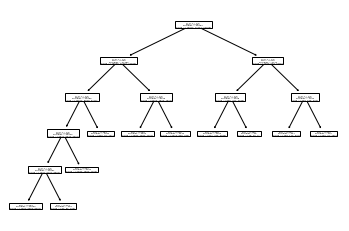

In [801]:
# !pip3 install matplotlib
# import matplotlib.pyplot as plt
tree.plot_tree(clf)
plt.show()

In [388]:
import numpy as np
n_nodes = clf.tree_.node_count
children_left = clf.tree_.children_left
children_right = clf.tree_.children_right
feature = clf.tree_.feature
threshold = clf.tree_.threshold

classes = ['disagreement', 'neutral', 'agreement']

node_depth = np.zeros(shape=n_nodes, dtype=np.int64)
is_leaves = np.zeros(shape=n_nodes, dtype=bool)
stack = [(0, 0)]  # start with the root node id (0) and its depth (0)
while len(stack) > 0:
    # `pop` ensures each node is only visited once
    node_id, depth = stack.pop()
    node_depth[node_id] = depth

    # If the left and right child of a node is not the same we have a split
    # node
    is_split_node = children_left[node_id] != children_right[node_id]
    # If a split node, append left and right children and depth to `stack`
    # so we can loop through them
    if is_split_node:
        stack.append((children_left[node_id], depth + 1))
        stack.append((children_right[node_id], depth + 1))
    else:
        is_leaves[node_id] = True

print(
    "The binary tree structure has {n} nodes and has "
    "the following tree structure:\n".format(n=n_nodes)
)

# print all leave nodes
for i in range(n_nodes):
    if is_leaves[i]:
        print(
            "{space}node={node} is a leaf node with class {cl} and ratio {values}.".format(
                space=node_depth[i] * "\t", node=i, cl=classes[np.argmax(clf.tree_.value[i])], 
                                                values=max(clf.tree_.value[i][0])/min(clf.tree_.value[i][0])
            )
        )
    # print all the split nodes with their depth, feature, threshold, left and right children
    else:
        print(
            "{space}node={node} is a split node: "
            "go to node {left} if X[:, {feature}] <= {threshold} "
            "else to node {right}.".format(
                space=node_depth[i] * "\t",
                node=i,
                left=children_left[i],
                feature=feature[i],
                threshold=threshold[i],
                right=children_right[i],
            )
        )
# X0 is group, X1 is approval, X2 is follow_up, X3 is otherness, X4 is negation, X5 is question 
# node can be split or leaf 
# if approval (X1): agreement (2.5 times more likely), else check otherness (X3)
# if otherness: disagreement (3 times more likely), else check question(X5)
# if question: disagreement (twice as likely), else check negation(X4)
# if negation: disagreement (2.5 times as likely), else agreement
# group and follow up not really used here

The binary tree structure has 19 nodes and has the following tree structure:

node=0 is a split node: go to node 1 if X[:, 1] <= 0.5 else to node 2.
	node=1 is a split node: go to node 3 if X[:, 3] <= 0.5 else to node 4.
	node=2 is a split node: go to node 11 if X[:, 5] <= 0.5 else to node 12.
		node=3 is a split node: go to node 5 if X[:, 4] <= 0.5 else to node 6.
		node=4 is a split node: go to node 13 if X[:, 5] <= 0.5 else to node 14.
			node=5 is a split node: go to node 7 if X[:, 5] <= 0.5 else to node 8.
			node=6 is a leaf node with class disagreement and ratio 8.24742268041237.
				node=7 is a split node: go to node 9 if X[:, 2] <= 0.5 else to node 10.
				node=8 is a leaf node with class disagreement and ratio 2.168299198575245.
					node=9 is a leaf node with class agreement and ratio 1.2315663012464333.
					node=10 is a leaf node with class agreement and ratio 8.18918918918919.
		node=11 is a split node: go to node 15 if X[:, 4] <= 0.5 else to node 16.
		node=12 is a split

In [386]:
clf.feature_names_in_
clf.classes_

array([0, 1, 2])

In [389]:
# FEATURES ARE ZERO INDEXED! 
clf.feature_importances_ # group, approval, follow up, otherness, negation, question
# gini importance, ie average decrease in impurity: approval, otherness, question, negation, follow up, group

array([0.        , 0.3878938 , 0.04517246, 0.26487375, 0.14157618,
       0.16048381])

In [978]:
doc = nlp('crime')
print([(token.lemma_, token.pos_) for token in doc])

[('crime', 'NOUN')]


In [ ]:
candidates = {}
!pip3 uninstall spacy
!pip3 install 'spacy[apple]'

from nltk.stem import LancasterStemmer
from nltk.stem import WordNetLemmatizer
import spacy

# nlp = spacy.load("en_core_web_sm")
# stem = LancasterStemmer()
# lem = WordNetLemmatizer()
# excluded = ['CARDINAL', 'DATE', 'ORDINAL', 'WORK_OF_ART', 'PERCENT', 'QUANTITY', 'MONEY']
# comm = []
# e_ps = []
# e_cs = []

# for i, s in df['body_child'].iteritems():
#     print(i, df['label'].loc[i])
#     p = df['body_parent'].iloc[i]
#     c = df['body_child'].iloc[i]
#     print('PARENT',p)
#     print('CHILD',c)
#     doc_p =  nlp(p)
#     doc_c = nlp(c)
#     words_p = [w.lemma_ for w in doc_p if w.is_stop != True]
#     words_c = [w.lemma_ for w in doc_c if w.is_stop != True]
#     doc_parent = set([t.lemma_ for t in doc_p if t.pos_ in ['NOUN', 'PROPN']])
#     doc_child = set([t.lemma_ for t in doc_c if t.pos_ in['NOUN', 'PROPN']])
#     common = doc_parent.intersection(doc_child)
# #     e_p = set([(e.text, e.label_) for e in doc_p.ents if e.label_ not in excluded])
#     e_p = set([e.text for e in doc_p.ents if e.label_ not in excluded])
#     e_c = set([e.text for e in doc_c.ents if e.label_ not in excluded])
    
#     for t in doc_parent:
#         for t1 in words_c:
#             l = len(stem.stem(t1))
#             if (t1 == t[:len(t1)]) or (stem.stem(t1) == t[:l]) and l > 3:
#                 common.add(t)
#     for t in doc_child:
#         for t2 in words_p:
#             l = len(stem.stem(t2))
#             if (t2 == t[:len(t2)]) or (stem.stem(t2) == t[:l]) and l > 3:
#                 common.add(t)
#     for c in common.union(e_c, e_p):
#         if c in candidates:
#             candidates[c]+=1
#         else:
#             candidates[c]=1
#     comm.append(common-e_p.intersection(e_c))
#     e_ps.append(e_p)
#     e_cs.append(e_c)
#     print(common-e_p.intersection(e_c), e_p.union(e_c))

In [92]:
# pkl_df['common'] = comm
# pkl_df['child_ents'] = e_cs
# pkl_df['parent_ents'] = e_ps

In [1060]:
print(sorted({(k, v) for k, v in candidates.items()}, key =lambda x: x[1], reverse=True))

[('EU', 6730), ('UK', 6394), ('Trump', 3034), ('Brexit', 3017), ('Biden', 2104), ('people', 1563), ('US', 1440), ('Republicans', 1283), ('British', 1272), ('Democrats', 1175), ('trump', 890), ('Republican', 874), ('deal', 842), ('American', 820), ('America', 779), ('vote', 701), ('Europe', 634), ('Boris', 618), ('Britain', 610), ('Ireland', 595), ('China', 586), ('GOP', 583), ('Americans', 573), ('Bernie', 560), ('republican', 558), ('republicans', 551), ('democrats', 551), ('year', 531), ('Democrat', 511), ('Dems', 477), ('government', 463), ('country', 458), ('brexit', 446), ('climate', 445), ('BLM', 440), ('Johnson', 432), ('USA', 408), ('voter', 407), ('democrat', 390), ('European', 388), ('Scotland', 383), ('NI', 379), ('Senate', 369), ('change', 366), ('time', 364), ('state', 360), ('Tories', 355), ('election', 348), ('U.K.', 345), ('Irish', 343), ('English', 343), ('Germany', 332), ('France', 325), ('party', 308), ('thing', 302), ('Russia', 286), ('Joe', 285), ('Canada', 283), (

In [1094]:
from nltk.corpus import wordnet as wn

s = wn.synsets('cop', pos=wn.NOUN)
for syn in s:
    print(syn.definition(), syn.hypernyms(), syn.hyponyms(),)
    for l in syn.lemmas():
        print(l.antonyms())

uncomplimentary terms for a policeman [Synset('policeman.n.01')] []
[]
[]
[]
[]
[]


In [1096]:
s = wn.synsets('gun', pos=wn.NOUN)
for syn in s:
    print(syn.definition(), syn.hypernyms(), syn.hyponyms())
    for l in syn.lemmas():
            print(l.antonyms())

a weapon that discharges a missile at high velocity (especially from a metal tube or barrel) [Synset('weapon.n.01')] [Synset('air_gun.n.01'), Synset('antiaircraft.n.01'), Synset('breechloader.n.01'), Synset('cannon.n.02'), Synset('cannon.n.04'), Synset('firearm.n.01'), Synset('gas_gun.n.01'), Synset('minute_gun.n.01'), Synset('quaker_gun.n.01'), Synset('set_gun.n.01'), Synset('whaling_gun.n.01')]
[]
large but transportable armament [Synset('armament.n.01')] [Synset('cannon.n.01'), Synset('field_artillery.n.01'), Synset('four-pounder.n.01')]
[]
[]
[]
[]
a person who shoots a gun (as regards their ability) [Synset('shot.n.05')] []
[]
[]
a professional killer who uses a gun [Synset('murderer.n.01')] []
[]
[]
[]
[]
[]
[]
[]
[]
[]
[]
a hand-operated pump that resembles a revolver; forces grease into parts of a machine [Synset('pump.n.01')] []
[]
[]
a pedal that controls the throttle valve [Synset('pedal.n.02')] []
[]
[]
[]
[]
[]
[]
the discharge of a firearm as signal or as a salute in mili

In [957]:
# pagerank
edge_list = [('A', 'B'), ('B', 'A'), ('C', 'A'), ('D', 'A'), ('E', 'F'), ('A', 'E')]

class Node():
    def __init__(self, name):
        self.pagerank = 1
        self.name = name
        self.children = []
        self.parents = []
    def update_pagerank(self, d):
        score = (1-d) + d * (sum([(n.pagerank/len(n.children)) for n in self.parents]))
        self.pagerank = score
        
class Graph():
    def __init__(self, edge_list):
        self.nodes = {}
        self.add_edges(edge_list)
    def add_edges(self, edge_list):
        for e in edge_list:
            parent = Node(e[0])
            child = Node(e[1])
            if parent.name in self.nodes: 
                parent = self.nodes[parent.name]
                self.nodes[parent.name].children.append(child)
            else:
                parent.children = [child]
                self.nodes[parent.name] = parent
            if child.name in self.nodes: 
                child = self.nodes[child.name]
                self.nodes[child.name].parents.append(parent)
            else:
                child.parents = [parent]
                self.nodes[child.name] = child
    def normalize_pagerank(self):
        pagerank_sum = sum(node.pagerank for node in self.nodes)
        for node in self.nodes:
            node.pagerank /= pagerank_sum
    def print_dep(self):
        for n in self.nodes:
            print(self.nodes[n].name, [i.name for i in self.nodes[n].children], [i.name for i in self.nodes[n].parents])



In [959]:
# G = Graph(edge_list)
# G.print_dep()

In [966]:
d = 0.85
iterations = 100

for i in range(len(df)):
    print(i)
    p = df['body_parent'].iloc[i]
    c = df['body_child'].iloc[i]
    print('PARENT',p)
    print('CHILD',c)
    w_parent = list(set([re.sub(r'[^\w\s]', '', i.lower()) for i in word_tokenize(p) if i.lower() not in stopwords.words('english')]))
    clean = [re.sub(r'[^\w\s]', '', i.lower()) for i in word_tokenize(c)]
    w_child = list(set([re.sub(r'[^\w\s]', '', i.lower()) for i in word_tokenize(c) if i.lower() not in stopwords.words('english')]))
    edge_list = []

    for w1 in w_parent:
        for w2 in w_child:
            if w1 in glove_dict and w2 in glove_dict:
                v = glove_dict[w1]
                w = glove_dict[w2]
                cos = 1 - spatial.distance.cosine(v, w)
                if cos > 0.3:
                    edge_list.append((w1, w2))
    G = Graph(edge_list)

    for i in range(iterations):
        for node in G.nodes:
            G.nodes[node].update_pagerank(d)
    l = {}
    for node in G.nodes:
        l[node] = G.nodes[node].pagerank
    print(sorted({(k, v) for k, v in l.items()}, key =lambda x: x[1], reverse=True)[:5])

0
PARENT So now that they have elected Biden how can we have faith in our election process especially since they didn't listen to the evidence of fraud and chose to ignore and discredit any mention of it.
CHILD They haven't, it is a contested election. The media is lying to you, because they ignore the other set.
0.25358940872749525 elected ignore
0.708669750970024 elected election
0.2710542528473443 elected media
0.16404305204300362 elected lying
0.47103389178971944 elected contested
0.06613734644715019 elected nt
0.36555174536321233 elected set
1 ignore ignore
0.36676573738044027 ignore election
0.3762868119431695 ignore media
0.24462416244742058 ignore lying
0.16378314074118705 ignore contested
-0.04702628501374617 ignore nt
0.33185411790985975 ignore set
0.3988782941240492 evidence ignore
0.3801766716396322 evidence election
0.4323364627602493 evidence media
0.4129633573263519 evidence lying
0.2045577728377148 evidence contested
0.034888169634503696 evidence nt
0.41969955874852016 

-0.016709058435677493 well ooh
0.39160852224422493 well lying
0.198383320582314 well nt
0.6830521485616101 well easy
0.6189957267246373 well mean
0.039887309439446295 reason ooh
0.31733060970243376 reason lying
0.10496299714345037 reason nt
0.6311045849080278 reason easy
0.7623320367717857 reason mean
0.0033812130757144843 said ooh
0.3046036347738845 said lying
0.16972261935416744 said nt
0.40956269356817265 said easy
0.4919277494345402 said mean
0.15343051457210988 lets ooh
0.1265561028904325 lets lying
0.1325699107962608 lets nt
0.5545867765991127 lets easy
0.3732461425117506 lets mean
-0.13168078892307356 politics ooh
0.27077278728044873 politics lying
0.054669203923081056 politics nt
0.38966258576762614 politics easy
0.4647985071241334 politics mean
-0.016687834031416937 must ooh
0.32030910493240006 must lying
0.15084767762722628 must nt
0.5776883734332688 must easy
0.6994366500031114 must mean
0.022846929973412533 would ooh
0.3085799080964582 would lying
0.2649526868608849 would n

[('deal', 1.1754642857142859), ('wait', 0.8460892857142859), ('s', 0.6335892857142859), ('personally', 0.6017142857142859), ('chaos', 0.5379642857142858)]
16
PARENT Should have used one of those muslamic ray guns, they create no go areas.
CHILD This is a little overplayed now mate, especially when he doesn't ray guns...
1 guns guns
0.19143751343834614 guns mate
0.3040676111666968 guns especially
0.01462515530384323 guns overplayed
0.2508536616835485 guns ray
0.15179624391464563 guns nt
0.323491181604707 guns little
0.34837345119377516 go guns
0.3285397798767862 go mate
0.5947962081332385 go especially
-0.11938561250645185 go overplayed
0.3060242061484435 go ray
0.1677765406578069 go nt
0.6788066872570363 go little
0.2567094884685943 create guns
0.08402026551631381 create mate
0.5813315364757708 create especially
-0.10752282460020357 create overplayed
0.24023376305377753 create ray
0.237865654694701 create nt
0.581776949608778 create little
0.5035051126591689 used guns
0.269361321960142

0.42198751724955896 house military
0.5339658248180887 house behind
0.02451221091814737 house erik
0.2981178349453335 house dangerous
0.5049250795524344 house said
0.5279640334599238 house governor
-0.017631981832110677 house mercenaries
0.5540321232627594 house press
0.4464681418730845 house police
0.38457810498628686 house s
0.30541753718054143 house please
0.40614453380881976 house constitutional
0.07523656536604051 house ss
0.20248197261316692 house drill
0.37932804519761587 house prince
0.26802115496444845 house lied
0.2831672909922247 house battling
0.4865795461132574 house people
0.35898331588054 house troops
0.2351347653163559 house perfectly
0.32226611538619 house trump
0.4196656800815548 house send
0.5199004077722208 house wall
0.3376047666489306 house hit
0.5164119960225777 house least
0.3735499899457496 house barr
-0.16914603298688302 house 7500
0.3100675050916939 house cities
-0.07340290202723776 house fucking
0.28967668931810997 house protecting
0.4510317026399242 house an

0.5839176989311774 alone hard
0.031113601395416968 alone faceless
0.37001307239995274 alone european
0.6844831716663659 alone one
0.5339682954856347 alone problems
0.2301714119555932 alone blaming
0.5211965240836413 alone easy
0.20214458458394546 alone fixing
0.3688751603665028 alone s
0.48287780235442024 angry hard
0.18401251886552528 angry faceless
0.25524436699278663 angry european
0.4329379499039163 angry one
0.3190609171735985 angry problems
0.4724989155252527 angry blaming
0.3015807928953894 angry easy
0.12265417879522456 angry fixing
0.23938272674370276 angry s
0.35807141443696433 consecutive hard
-0.09829735226357261 consecutive faceless
0.3578586371491277 consecutive european
0.5053732914106145 consecutive one
0.253320691210549 consecutive problems
0.09795458952221836 consecutive blaming
0.33759380163522335 consecutive easy
0.13359733684992314 consecutive fixing
0.2998966131563827 consecutive s
0.15943956577222673 gullible hard
0.4915388496674724 gullible faceless
-0.053025897

0.004720574550755252 westminster corbyn
0.06783053843341413 westminster racist
0.18107473801594431 westminster rather
0.32726520704817563 westminster office
0.22366116213815412 westminster born
-0.03894871562073465 westminster liar
-0.1758344958711764 stick corbyn
0.1789617201600121 stick racist
0.5560046292188864 stick rather
0.20996832913399266 stick office
0.08837429815157638 stick born
0.1404069783689823 stick liar
-0.03159880617708444 leader corbyn
0.2647562545280173 leader racist
0.3827360746774787 leader rather
0.4782031823977546 leader office
0.3935816600512586 leader born
0.12753240489885342 leader liar
1 corbyn corbyn
-0.06889655506226844 corbyn racist
-0.2288999309825781 corbyn rather
-0.13975434764437722 corbyn office
-0.12857148839668953 corbyn born
-0.04031169696142278 corbyn liar
0.018695648490385408 hoc corbyn
0.16121300976778952 hoc racist
0.2117379196793301 hoc rather
0.21096136018957012 hoc office
-0.18623862557960957 hoc born
0.06335122883965627 hoc liar
-0.24825798

0.0003404746506188161 someone leavers
0.5267391608294261 someone already
0.5016586872543312 someone used
0.7876616289746404 someone anything
0.5255604195895658 someone difficult
0.022284786357088415 someone unaffected
0.5293013677458638 someone simple
0.16131669147389904 someone importing
0.3447894226404159 someone surprisingly
0.1766175071349827 someone import
0.5112344329184734 someone many
0.3388810705361073 someone voted
0.7154870414416972 someone imagine
0.28352535713326343 someone complex
0.6597626049109137 someone say
0.665792754931764 someone might
0.7935149839876608 someone know
0.16779126527908605 someone nt
0.507998377534352 someone point
0.45994755389410136 someone cause
0.7912912369577243 someone something
0.6406082318395793 someone ever
0.5126640546655711 someone course
0.5475788980092194 someone example
0.14540473703850987 someone imports
0.47858564525049996 someone fine
0.32701021711141987 someone issues
0.6676348749604134 someone rather
0.8803194313905386 someone anyon

0.7956967406785738 come think
0.6436610111633133 come also
0.5023161016847663 come fix
0.35022664998825714 come assumption
0.4156921882591573 come climate
0.5246618591599072 come crisis
0.03859955093111078 come herring
0.7571133242644685 come happen
0.239524679889058 come austerity
0.4602483807678519 come meaningful
0.6303814119790708 come live
0.5007676143899155 come red
0.6996462598966481 come future
0.7149525667916232 come full
0.5807958026560915 come lives
0.17607228396762176 come reinvest
0.5369503686774285 come expand
0.3756144063196907 come prosperity
0.4909479520857756 cut think
0.559864412427116 cut also
0.4953545806599341 cut fix
0.21025460419093356 cut assumption
0.26675389660046034 cut climate
0.44405113356872383 cut crisis
0.18583151339437443 cut herring
0.4024101428488057 cut happen
0.40862738614588534 cut austerity
0.26280501555554414 cut meaningful
0.3922119840129634 cut live
0.535545557383792 cut red
0.4663369334506571 cut future
0.6002196656518237 cut full
0.372689346

0.07412009802399111 cake demanding
0.13310554071981506 cake ck
0.12467658857217634 cake none
0.1501812494840833 cake took
0.10503879651231984 cake eu
0.027127294860716966 cake brits
0.5261872464411468 cake table
0.2600385982141189 cake even
0.13960417888643717 cake benefits
0.24389940969796986 cake never
0.20797166175190984 cake fact
0.17034027688063325 cake nt
0.062039442986564386 cake uk
0.19388725057460388 cake old
0.21099810585648537 cake fly
0.13785309334680618 cake f
0.3291066979442786 cake like
0.08565250400268987 cake told
0.09590661307210224 cake rational
0.2450394812829505 cake mean
-0.07158442052459613 cake responsibilities
0.2769930915852601 cake 5
0.19934628550794553 cake year
0.24287556322198867 cake could
-0.04682341821108804 cake remotely
0.11007065938017946 cake negotiating
0.49939807517232193 country demanding
-0.11087680797399369 country ck
0.500423992449515 country none
0.5804959348469282 country took
0.5385520872792146 country eu
0.10643511411073392 country brits
0

-0.0521362451088212 hooray sudden
0.10528317524091846 hooray wingers
0.14073911798635041 hooray betrayal
0.020564666631668782 hooray right
-0.03405624467432533 hooray consequences
-0.21717757284209416 hooray royal
-0.002045290107303366 hooray predictable
-0.11013388535311619 hooray navy
-0.1995929621361483 hooray believed
0.0370165638416442 hooray best
0.5406368064396763 consequences sudden
0.09410676898404469 consequences wingers
0.44818085418908704 consequences betrayal
0.38666927484167835 consequences right
1 consequences consequences
0.07634420020339028 consequences royal
0.45848725212772834 consequences predictable
0.1091415890192402 consequences navy
0.3644150501688457 consequences believed
0.25526688088265637 consequences best
0.31263641087805805 also sudden
0.06386568805557236 also wingers
0.1454212171491155 also betrayal
0.5390974143003538 also right
0.2898935244076397 also consequences
0.4521085863592711 also royal
0.14103336060765959 also predictable
0.3850784956362475 also 

0.2800566199340724 advocate attributed
-0.026039084508994392 advocate outlier
0.08206497665540491 advocate symptom
0.3509417296579642 advocate current
0.08171545663566593 advocate buddy
0.3461836473858808 advocate claim
0.4155778144621489 advocate change
0.2803413937163146 advocate climate
0.42064471900041434 advocate believe
0.40425731362697204 years attributed
-0.12040549644141807 years outlier
0.10662758323681754 years symptom
0.6629868525644009 years current
0.2101481484243386 years buddy
0.48191158640984055 years claim
0.6012133732928872 years change
0.35580634339793216 years climate
0.5771166756099397 years believe
0.31509372578864614 warming attributed
0.06517101499177136 warming outlier
0.25158694226892786 warming symptom
0.42755494878349665 warming current
-0.09217807967163161 warming buddy
0.23404579058728048 warming claim
0.5898816346292438 warming change
0.7991012576805309 warming climate
0.40539391449547313 warming believe
0.30224493280790976 climate attributed
0.048484466

0.7433754629624902 well things
0.44257005100731295 well scheme
0.34316546910571755 well fake
0.6762345447960192 well followed
0.4381097752478067 well strike
0.7098053855324564 well really
0.5680995049249334 well bigger
0.4452722572445067 well pose
0.5390033848797975 well news
0.1046297949363002 well plato
0.3796720353699683 fake things
0.41857427866094166 fake scheme
1 fake fake
0.264312251393804 fake followed
0.19949955256560314 fake strike
0.322785394062449 fake really
0.3024372844337312 fake bigger
0.3174783579694127 fake pose
0.2810898968165013 fake news
-0.07984212567106441 fake plato
0.8022092248738145 like things
0.34344763388495614 like scheme
0.42383027095437753 like fake
0.5335432186793047 like followed
0.39563190021401984 like strike
0.7473649057815455 like really
0.6106516048659382 like bigger
0.45997134283064434 like pose
0.43833810441947674 like news
0.09115219190234203 like plato
0.20710441573048866 doubled things
0.173785612183879 doubled scheme
0.07890772861138917 doub

-0.07164965566525727 hard dm
0.4081883175664923 hard share
0.4051064246468219 hard journey
0.5291780820125991 hard prefer
0.14392334816961605 worth dm
0.5909114544153603 worth share
0.3333973734879443 worth journey
0.27360179743202306 worth prefer
0.0024036366381048335 years dm
0.48886405844996816 years share
0.45120333290184145 years journey
0.33443358284954927 years prefer
-0.054735087622819645 three dm
0.5182535133765985 three share
0.37421381826720745 three journey
0.2684968340477969 three prefer
-0.020071505136531886 ago dm
0.5386475297682443 ago share
0.4248605422713334 ago journey
0.31559629721845117 ago prefer
0.26282405536184505 s dm
0.5086249823783547 s share
0.24833811059078026 s journey
0.18961469452570756 s prefer
[('share', 0.5325000000000001), ('journey', 0.405), ('prefer', 0.2775), ('three', 0.15000000000000002), ('s', 0.15000000000000002)]
87
PARENT Weren't they supposed to cave? Didn't the UK hold all the cards? Also, nice work admitting No Deal is a UK bluff, which i

0.46472303613894117 nt 100
-0.013661238222604677 nt extinct
0.1677765406578069 nt go
0.08111491423600814 nt century
0.1856037992509174 nt single
0.21465559008929969 nt help
0.1352311942574892 nt literally
0.12691525601632836 nt plants
0.055048325042537094 nt ways
0.03841812471933859 nt gloom
0.3764190686671711 nt 5
0.3397333459741262 nt less
0.33930872538473755 nt us
0.1868020366747205 nt move
0.27377741436052117 nt last
0.009689699600295087 nt 6c
-0.10897494505778926 nt ignorant
-0.02368763341135094 nt northwards
0.23461045884979748 inspire years
0.39341297857298363 inspire anything
0.4033893177887997 inspire wo
0.30480427776394947 inspire prevent
0.3121079032570794 inspire actually
0.35522519044836565 inspire best
0.343865365133029 inspire show
0.29899818122159616 inspire doom
0.37776123249237026 inspire seeing
0.11507451555911918 inspire due
0.2194507165717251 inspire media
0.009954596362124812 inspire 0
-0.03214926507662885 inspire morsel
-0.0021714966989534457 inspire nt
0.1470232

0.1636031877062174 rape right
0.1645949831324448 rape mad
0.18986610690571382 rape really
0.07574381782131379 rape sum
0.14492106751548417 rape pictures
0.2541135285889896 rape situation
0.2055608929119066 rape bad
0.023107382018114908 mutants right
0.31134534081772625 mutants mad
0.0493345686063692 mutants really
-0.041163263100081116 mutants sum
0.15655064286567 mutants pictures
0.010952189302497528 mutants situation
0.044737436818611864 mutants bad
0.5335045127492849 case right
0.30868404815810324 case mad
0.519346807211717 case really
0.3416042321144225 case sum
0.3188267399976906 case pictures
0.580420651241746 case situation
0.46229147492286726 case bad
0.27238728410026747 bail right
0.0006610453598219213 bail mad
0.10825813808330653 bail really
0.38035655384719846 bail sum
0.10511296472127307 bail pictures
0.1856998104080363 bail situation
0.18270089442229587 bail bad
0.6467905967120066 like right
0.4583252275648041 like mad
0.7473649057815455 like really
0.22230625387035818 lik

0.04184300154907539 emitter devalue
0.06530290989220622 emitter large
0.0645218013011416 emitter change
0.6218946204366291 emitter polluter
[('saying', 0.39255934718100904), ('large', 0.35613077575243746), ('change', 0.3470236328952946), ('threat', 0.34398791860958033), ('security', 0.3045236328952946)]
109
PARENT Take a BIG BOX of crayons with you to prove that white is a color as well.... Nothing wrong with learning about new/different cultures....especially when it comes to trying new foods.....
CHILD Can't argue with that - Crayons determine color. Especially if the crayon color says, off white.
0.6335493541856456 well says
0.5019000055909423 well argue
-0.028612846959867877 well crayon
0.5328895507234707 well white
0.6113092251255203 well ca
0.845032683657145 well especially
-0.032607722263990224 well crayons
0.4836031854893206 well color
0.198383320582314 well nt
0.5186147636186338 well determine
0.2963178987440318 foods says
0.1983439112091845 foods argue
-0.012709842416978034 f

-0.14944590014014092 eu clowns
0.39434254313148465 eu second
0.46487314341466623 eu clear
0.27557825025069893 eu show
0.45710654805056516 eu keep
0.08491431182720344 eu pills
0.5347745996831379 eu deal
0.16331792996897798 eu patience
0.31366444183237974 eu never
0.4054110064843903 eu taking
0.1303111393833405 eu likes
-0.2810935155127843 eu lobotomy
0.27644915206482024 eu tell
-0.09650098963962317 eu bleating
0.02644822705492822 eu dont
0.259568769421882 eu thought
0.27700344960235657 eu mind
0.21724114846477416 eu nobody
0.31248964386321587 eu difference
-0.26529778370756496 eu sheeps
0.37742504878389305 eu able
0.39703194437706835 eu get
-0.013050450695252236 based clowns
0.47570017422682653 based second
0.46666284197533603 based clear
0.5275803544298667 based show
0.42352549813201845 based keep
0.0985989099233231 based pills
0.5738984556408069 based deal
0.12505338371096353 based patience
0.390098432204693 based never
0.479737986840739 based taking
0.2734735052176871 based likes
-0.

0.34585091557042313 college 2
0.41058385729832936 college like
0.39554991437489184 college star
0.43094534154383224 college nfl
0.29494846030339916 college coast
0.22181438358237027 college backup
0.4829132924195171 college coaches
0.20553265845945767 college contracts
0.23367881728169249 college decent
0.40511505606661324 college paid
0.4528416292647317 college seasons
0.44641077935142404 college turned
0.5571230227315208 college started
0.4447507038926951 college get
-0.05321824263103969 college kneeled
0.44292335815889605 express reason
0.3702090259939269 express already
0.2584033117033291 express clubs
0.3883992966308637 express trying
0.027137956519977857 express knee
-0.1453434451253579 express benched
0.3947471582099489 express time
0.38080603003836344 express s
0.3030717195027982 express obviously
-0.007602944778363874 express bullshit
0.4026457590797914 express taking
-0.04352527572546272 express starter
0.07295533511856667 express nt
0.25095599979330174 express super
-0.09234

0.3041737653981619 reason usa
0.6781145221119219 reason happened
0.5003847427903519 reason federal
0.38321220835838443 reason services
0.5072348493199936 reason anger
0.27967395794862715 reason manufacturing
0.3924604816022357 reason replace
0.4315033098383734 reason economy
0.32757736661286485 reason s
0.4877466124770713 reason several
0.36530503527615554 reason eu
0.7083500674520098 reason give
0.5035092575714726 reason media
0.5096462237158412 reason repeat
0.5058471015063544 reason politicians
0.5268020143749227 reason responsible
0.4595469416679274 reason decades
0.6001443046918695 reason changes
0.4535820467497462 reason including
0.6191414834027541 reason people
0.30967352842899254 reason uk
0.24353890816034696 reason trump
0.370184151162376 reason 3
0.3905755805441 reason 1
0.5542770353256462 reason told
0.5258290787518798 reason focused
0.645529126240391 reason blame
0.542479892757587 reason government
0.38953362260307434 reason 5
0.7168885987590381 reason way
0.26360790153251

KeyboardInterrupt: 

In [931]:
# G.print_dep()

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer
# from nltk.stem import PorterStemmer
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
# stemmer = PorterStemmer()
lemm = WordNetLemmatizer()
count_vect = CountVectorizer()
X_lemm = []

for i, s in df['body_combined'].iteritems():
    print(i)
    lemm_s = ' '.join([lemm.lemmatize(t) for t in word_tokenize(s)])
    X_lemm.append(lemm_s)
X_train_counts = count_vect.fit_transform(X_lemm)
feature_names = count_vect.get_feature_names_out()
X_train_counts.shape

In [838]:
tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)
X_train_tfidf.shape

(42894, 44625)

In [841]:
child_lemm = []
for i, s in df['body_child'].iteritems():
    print(i)
    lemm_s = ' '.join([lemm.lemmatize(t) for t in word_tokenize(s)])
    child_lemm.append(lemm_s)
    
child_transform = tfidf_transformer.transform(count_vect.transform(child_lemm))
keywords_c = []
for i, r in enumerate(child_transform):
    print(df['label'].loc[i])
    print(df['body_child'].loc[i])

    row = child_transform[i].toarray()
    top_idx = np.argpartition(row, -3, axis=1)[0][-3:]
#     print(feature_names[top_idx])
    keywds = [feature_names[i] for i in top_idx]
    keywords_c.append(keywds)
    print([feature_names[i] for i in top_idx])

0
They haven't, it is a contested election. The media is lying to you, because they ignore the other set.
['lying', 'contested', 'ignore']
2
She was not truthful when she swore her oath of office. She does not serve her constituents. She does not serve the State of Michigan. She does not serve the United States of America.
['swore', 'she', 'serve']
0
I'm not happy about it but I'm not going out and rioting. I will move on with my daily life lol
['happy', 'daily', 'rioting']
0
Shouldn't they only fire use their weapon unless absolutely necessary? You are wanting the police to shoot people so they can't commit future crimes?
['shoot', 'weapon', 'commit']
0
Nah women are about equal rights now a days so treat them as such. If you want to fight a man better be ready to get your ass handed to ya!!
['treat', 'ya', 'handed']
0
Not sure but there are several studies of this drug dating back over 10 years that show this drug has broad based efficacy against a variety of viruses including the co

['prick', 'wary', 'laziest']
0
As stupid as their opinion is, they should be allowed to voice them. At the same time, we should equally be allowed to call them ignorant assholes
['asshole', 'allowed', 'equally']
0
Lol "give me 50$ to call you a bigot you faciat racist White devil!"
['devil', 'bigot', 'faciat']
2
Yes thank you, unbelievable how many times I've seen this excuse already.
['thank', 'excuse', 'unbelievable']
2
I always shake my head at the "you will never get perfection from any group" crowd. Do they really think BLM would even exist if the bad ones actually faced consequences?
['faced', 'shake', 'perfection']
1
Where you say 'cold, wet and grey' - are you still talking about the women?
['cold', 'wet', 'grey']
0
You know what is wildly fiscally irresponsible? Destroying the planet. There is nothing far left about wanting to save humanity.
['irresponsible', 'wildly', 'fiscally']
0
>It takes a lot of work to get people to be ready to throw their livelihoods in the trash. You'

['innovation', 'powerhouse', 'academically']
2
ya there was a senator that encouraged rioting if chauvin didn't get convicted of 1st degree murder... which isn't even on the table smh
['smh', 'encouraged', 'chauvin']
1
How many Trump supporters do you think support him because "he's not Biden"?
['biden', 'support', 'supporter']
2
Exactly! Let's not bitch and moan about it every day for 4+ years. Let's be better and hope for the best. Hopefully Joe surprises us and I pray he survives all four years!
['let', 'moan', 'survives']
0
I believe your average american citizen wants what is best for the country in their eyes. Now that being said, the extremists of both sides while they are wrong, one tends to like this country more than the other and the other wants to destroy our way of life.
['country', 'tends', 'extremist']
0
Ha ha ha you actually think they care about anything other than their pockets and power?
['power', 'ha', 'pocket']
2
>CNN poll: Sanders adds to momentum with lead in New

['governing', 'benefit', 'impossible']
2
I say something like, "If you gave me a gift and I trashed it, you'd be upset. The Earth is a gift from God and we should take care of it." I honestly don't understand how anyone could think we don't need to take care of this planet.
['care', 'trashed', 'gift']
1
Well it was 99% Theresa May's deal wasn't it? Except they actually gave the EU another thing they wanted (one island economy). At least the backstop was trying to stop that.
['theresa', '99', 'wa']
0
Dude. That's pretty standard, and it means absolutely nothing. Those miles and miles in wyoming you see contain almost no votes. Land area is not accounted for and cows don't get a vote
['wyoming', 'mile', 'accounted']
2
While I agree, the EU can't be seen to be the ones to halt negotiations. They don't want to give the UK any out or a way to blame the disruption on the EU. Equally if the UK runs the clock out it'll be seen negatively amount EU states and prove the UK has been wasting EU ti

['enacted', 'settling', 'descent']
0
If you belive in rights, the constitution, and limiting government power in the face of preserving individual liberties, this video and many, many, many other videos and testimonials should make your blood boil.
['testimonial', 'video', 'many']
2
Good cops don't stand around watching bad cops. They're just other bad cops.
['watching', 'bad', 'cop']
1
The kid I believe is Tamir Rice. He was playing in a park with a toy gun (didn't look anything like a real gun) and was shot to death by police. Someone had called the cops on him. The officers didn't even get out of their car or stop driving, and just shot him. I'm not too sure about the other two though.
['tamir', 'gun', 'shot']
2
Every time someone says 'all lives matter', it's another little black kid being told not only that they don't deserve justice, but that they're wrong for even asking for it. It's fucked up. I honestly don't know how to talk to these all lives matter people. They just do not 

['cartoonishly', 'presidency', 'evil']
0
It is about solutions, not to make destructive people feel ok about themselves
['ok', 'solution', 'destructive']
1
This is the best Brexit: - Leavers think we've left. - Remainers keep freedom of movement. - Farage can't speak at EU parlerment. We're now stuck a vassal state until Tories can get a deal together. Compatible deals take 7+ years.
['vassal', 'compatible', 'parlerment']
1
It means less money going to U.K. Universities. It means less Global Influence in the long term. Education was one of our 'Export Industries'. It means fewer jobs in Education.
['universities', 'mean', 'education']
0
Registering to vote is a mechanism for catching attempts at voting "identity fraud". Is it the only way to do so, no. Does it work, yes. Is it paranoia to suspect people would attempt to make fraudulent votes...? Take a look at the news. The USA suspects that Russia attempted to just "influence" legitimate voters. If the US voting system made it possibl

['matter', 'black', 'lives']
2
I heard this when this first started but didn't hit me until I heard it again from you. I literally teared up.
['hit', 'teared', 'heard']
2
That seems very understandable to me. Anything else would mean that you'd actively choose to be evil, rather than the victim of oppression. A ,,compromise" might be to ,,go white" for the cause of becoming the greatest ally of all times and change the system for good etc. But it still feels like a ,,I'll save myself, but I'll throw you guys a ladder down!" scenario, which still seems selfish.
['understandable', 'seems', 'ladder']
0
You're not immune from a cop kneeling on your neck either!
['neck', 'immune', 'kneeling']
0
They don't have different rules. The Monopoly rule book is the same for all four players. You land on a property, you pay rent to the owner. You land in jail, you pay to get out. But that doesn't give the fourth player a level playing field when they start playing later than the others, and the other

['empathy', 'pity', 'scrap']
2
A lot of mountains are committing to 100% renewable energy. Some are already there.
['renewable', 'committing', 'mountain']
0
3 years of trump... Cutting "Obama-era disease security programs"? Proposing a 2021 budget that cuts the CDC budget in the midst of a global outbreak? Telling people it's fine to go to work while sick? Claiming a flu vaccine can treat the coronavirus? Claiming a vaccine will be ready in months when his top advisers (experts) say a year at best?
['budget', 'vaccine', 'claiming']
2
Wish it was, then we wouldn't have to listen to farage bleating on about it
['listen', 'farage', 'bleating']
1
I think wife was telling you she wouldn't accept super soft
['super', 'soft', 'wife']
1
Its the Stilton cheese deal with Japan - get on with the program. Apparently its a lot better deal than they would have had within the EU (without any specifics about the deal) as heard on last question time...
['cheese', 'deal', 'stilton']
0
> If in doubt, jus

['warranted', 'enslavers', 'near']
1
I read quotes on social media from people who were *so* pessimistic about it that they thought we wouldn't be alive in ten years, as in none of us. Climate change is serious, but saying that it will cause all of humanity to go extinct in 10 years is pushing it.
['ten', 'pessimistic', 'extinct']
1
There is always a part of personal belief and facts. It is a fact that the world is getting warmer. It is a fact the greenhouse effect do exist. But as a skeptical we question, are models really accurate? Is the 97% ratio real? All the correlation to correct effects make sense? Etc, etc... That kind of questioning (not just that but many other questions) makes me a bit skeptical. I would say I am more tipping in to believing it completely than being a denial. Also,that is not the point I was trying to make.
['effect', 'fact', 'skeptical']
2
A couple more days and he can go into the recycling bin in my mind of people I will never care about again. Looking fo

['sir', 'goodness', 'great']
1
The breaking news I'm seeing is that Barr's investigation into Obama has ended with complete exoneration for Obama.
['barr', 'obama', 'exoneration']
0
Hell no, women in the military deserve the same treatment as the rest of us.
['military', 'treatment', 'deserve']
0
CNN is propaganda...? I suggest you read up on what propaganda actually means/is.
['suggest', 'means', 'propaganda']
0
More mail-in's equal shorter lines on Jan 5 when it will be blisteringly cold. Mail-in's are the reason Biden won this election. Edit: But also early in-person voting starts Dec 14 so do that if you want..you can do mail-in right now though.
['shorter', 'blisteringly', 'mail']
2
I never thought I would see one coming but yes credit where it is due.
['coming', 'due', 'credit']
2
80% are services, and that was never on the table so... not much else to speak about than the agricultural sector which is going... poorly.
['sector', 'poorly', 'agricultural']
0
He is an extremist. He 

['states', 'chief', 'commander']
0
> Total lack of leadership from the anti-brexit side, unfortunately. These is no anti-Brexit side anymore.
['brexit', 'anti', 'side']
1
That's how it normally works, same tariffs for everyone (that you don't have a trade deal with). But in this case the tariffs are punishment for US government help to Boeing, they got a ruling from the WTO that allows the EU to have these extra tariffs for a while in retaliation.
['retaliation', 'boeing', 'tariff']
0
How will the new trade agreement be enforced? A new, dedicated UK-EU justice office? Doing the same work as the ECJ but separate? But as stated above, I don't think they won't even get to this point in the negotiations.
['enforced', 'new', 'dedicated']
2
It's only ever outrage, betrayal, disgust, or pride. The average reader thinks they have one emotion--anger.
['reader', 'betrayal', 'disgust']
0
> Rather the same for remainers, why waste time with people who want you to be worse off. How do you get from 

['continuing', 'worded', 'formulating']
1
I can only imagine that it would be bad if UK has already deposited nuclear waste stuff there in secret. Though, I have no idea if that is even possible or not, certainly possible inside England I would imagine, but perhaps not that easy in Northern Ireland.
['possible', 'deposited', 'imagine']
0
I really don't think they believe that anymore. I just think they don't want their money being spent on it. And they really don't care if tens of thousands die.
['do', 'ten', 'really']
0
Poles were complained about as 'stealing' trades jobs - sparks, chippy etc. Romanians were complained about as coming here and claiming benefits and stealing things. Together you had the magic EU immigrant stealing your job AND not working.
['chippy', 'complained', 'stealing']
0
Not really, priorities matter when competing for survival. You are not as nice when everyone has a motive to stab you for food.
['competing', 'motive', 'stab']
2
A touch one-sided (the rw media

['restrictive', 'regrowing', 'union']
1
Maybe, maybe not. The Multnomah (Portland) DA is a nazifa supporter so his inclination is to cheer the attackers. In Seattle the DA is another nazifa supporter and charged a driver with (afaik) attempted murder for shooting a rioter trying to car jack him.
['multnomah', 'da', 'nazifa']
2
> is how I will be referring to him from this day forth. diaper don works well too.
['don', 'forth', 'diaper']
1
You forgot to mention Bernie -- who continues to have a much more cohesive response to this whole thing. Bernie has also done SO MUCH more than simply tweet out the obvious opposite position to the "let people die to save the economy" messaging spreading around today.
['messaging', 'cohesive', 'bernie']
2
My prediction is Warnock takes it and Ossoff loses. But it's so close.
['prediction', 'ossoff', 'warnock']
2
Yep. They elected Trump on the premise that he was a successful businessman based on what they saw on reality TV. When instead, all evidence w

['past', 'learn', 'motherfucking']
2
Yikes. The numbers are gonna be ugly by Christmas. Good on you for doing the right thing.
['christmas', 'ugly', 'yikes']
0
THIS. Trump isn't an idiot. He sees that GW Bush had a 90% approval rating after going to war. (left with a 25% approval rating.) That Americans will die because of this is almost irrelevant.
['gw', 'approval', 'rating']
2
His nickname at university was diaper don, BC he would go to parties, get drunk AF, start crying and eventually pass out on the bed of whoever's house it was, and end up pissing himself. And that was told by his roomie. Lolol
['nickname', 'lolol', 'roomie']
0
People will continue to die under Biden if he gets elected. The gop didn't invent death, my guy.
['continue', 'die', 'invent']
2
Also land once the only places not underwater are sugarloaf mountain and Britton hill. Maybe it might also wake a lot of them up to how real climate change is.
['underwater', 'britton', 'sugarloaf']
2
Impossible to do in the tim

['primarily', '30th', 'my']
2
Then rounding up all the lying pricks that got us in this mess and Nuremberg'ing them. Preferably their fate, once found guilty, decided on live TV with sms voting with the proceeds going to the people most affected by Tory austerity.
['proceeds', 'rounding', 'nuremberg']
0
Yeah, I'm not suggesting that it's a catch-all. I'm just saying that it would greatly reduce the warming that's currently occurring.
['suggesting', 'greatly', 'occurring']
1
Newsflash: the UK's biggest trading parter is the EU. With whom they have put up massive trade barriers. But I guess, "yay, Brexit ftw"
['newsflash', 'ftw', 'parter']
0
I think you'll find that historically apart from 1066, it's the UK that's been attacking France
['attacking', '1066', 'historically']
2
More like at least four, from July through October, and there have been noteworthy fires lately from May into January. :-(
['lately', 'july', 'noteworthy']
0
> These masturbatory fantasies about a bolshy, buccaneerin

['wringing', 'unapologetic', 'too']
2
Collapse of party and loss of corporate backing. He's gotta make sure his donations are still coming in. I believe it's literally all he cares about.
['corporate', 'donation', 'backing']
1
Because the UK seems intent on lowering human rights. Why else would they leave the EHCR for?
['intent', 'lowering', 'ehcr']
0
People need to understand that the protesters and the opportunistic rioters and looters are NOT the same people. The rioters and looters are just criminals *taking advantage* of the protests, they don't give a damn about the cause, their interests have nothing to do with the protests, nor do they have anything to do with the actual protesters. They are not protesting, they are rioting and looting. That's not the same! And they are not the same people!
['protester', 'rioter', 'looter']
1
Easy to blame over population rather then the rampant abuse and exploitation of the environment for short term profit. Blaming the victims has always been

['shitload', 'boris', 'gloomsters']
0
It is breathtaking how little these people know about international trade.
['little', 'international', 'breathtaking']
0
> The biggest question is the amount of civil disorder after reality kicks in. Hopefully it is avoided, because it has only negative effect. There is still a major risk that red wall voters who were lured to vote "get brexit done" are going to suffer so much. Honestly though, they seem to get away with blaming everything on immigrants, refugees etc every time, so why would this time be different.
['avoided', 'disorder', 'lured']
0
Not quite yet. I think a seamless transition is getting less likely, but we could still have a very thin deal, preliminarily ratified by the Commission. That can happen in weeks. But any mixed part of the agreement will likely have a gap at the beginning of next year.
['likely', 'seamless', 'preliminarily']
0
The vast majority of those that voted leave are fine with a no-deal, they do not care how, when

['fukushima', 'tsunami', 'cause']
2
> Public opinion has no bearing on whether or not climate change is real. True enough. The reason that climate change is real is because CO2 is a greenhouse gas that is increasing in the atmosphere because of the combustion of fossil fuels. That aside, in a democracy, public opinion has a bearing on policy. So this is a useful sign.
['public', 'opinion', 'bearing']
0
Read your Bible. The Antichrist comes from within the Christian Congregation. They are just men who subvert what the Bible says about Christ and God and draw the unlearned after them creating new denominations and taking their money. Matthew chap 24. First warning sign of the last days that Jesus gave. False teachers. Matthew 7:21. They're not politicians.
['unlearned', 'matthew', 'bible']
2
Conveniently staged with the media to be present. Honestly this is not too different than Jusso Smollet staging his own hate crime
['staging', 'smollet', 'jusso']
1
>grammatically incorrect Yeah, eve

['striking', 'graphic', 'artistic']
1
If they throw bricks pull a gun and shoot bullets. That's called self defense, same as Kyle Rittenhouse.
['brick', 'kyle', 'rittenhouse']
0
What bullshit. China and Russia fell all over themselves congratulating Biden, and we spent four years with liberals lying about Russia owning Trump. Trump put America's interests FIRST, and that's precisely why the left hates him so much.
['owning', 'congratulating', 'russia']
0
Why would he note something he doesn't give 1 fuck about?
['fuck', 'he', 'note']
2
I'm probably more capable than most when it comes to surviving the apocalypse. But I'm hopeful that perhaps we can avoid complete catastrophe.
['hopeful', 'apocalypse', 'surviving']
2
Right but this iceberg breaking off has zero to do with climate change. Also it's winter in Antarctica
['winter', 'antarctica', 'iceberg']
0
It could have been a credible threat, had enough MPs supported it. However, that doesn't make it an efficient one, as it requires the

['let', 'do', 'tweeter']
0
The thing is, centrist Democrats will vote for the Democratic candidate no matter who it is, the more liberal younger base will not. It makes more sense to pick the guy that will add young people to the vote to help boost the number of voters.
['will', 'boost', 'centrist']
1
Does that mean net 3 senators to get to 50/50, with Kamala as the tie-breaker?
['kamala', 'breaker', '50']
2
Yeah, that level of naivete is a bit much for a presidential contender.
['presidential', 'contender', 'naivete']
0
No, democrats spend the entire war protesting at home, then when the war is won, go completely quiet until another war happens
['protesting', 'quiet', 'war']
2
And yet they try to claim that they inherited the debt from Obama! I swear these fuckers have balls for all the wrong reasons!
['swear', 'fucker', 'inherited']
0
Number one fuck off and two where do you get off. What magical world do you live in that you can talk down to us about our political philosophies. And 

['coal', 'consumption', 'electric']
1
We had one transition, yes. But what about second transition ?
['yes', 'second', 'transition']
0
Hostile power lol. Gas links to Russia and Chinese investment deals abound but the EU can't handle the UK extending a grace period due to backwards customs? Get a grip.
['grace', 'grip', 'abound']
2
Fair enough, but insofar as "playbook" means "same public relations strategy" then I'd say it's not too different. The strategy and tactics that are being used on COVID-19 are remarkably similar -- Trump has even suggested that both are "Chinese" and possibly "hoaxes" by China and/or the media and/or Democrats to destroy America/his re-election chances.
['remarkably', 'strategy', 'insofar']
1
We'll just have to wait and see. My money is on President Trump over NPR. He has emergency authority to approve the vaccine for mass distribution whenever he chooses. NPR has no idea just how sharp this President really is.
['sharp', 'npr', 'president']
2
I still cannot

['started', 'wto', '1995']
2
Raid village -> kill most of the men -> take the wounded and boys as slaves -> rape the women Literally the story of humanity for eternity up until the last 2000 years.
['raid', 'eternity', 'wounded']
1
Pittsburgh is a lot better. Still a lefty Mayor, not as crazy though. Good thing is the counties around Pitt are pretty red, notsomuch in Philly.
['pittsburgh', 'pitt', 'notsomuch']
2
More than likely. It is probably staged for a propaganda article in the upcoming Election Special of "Be Worthless" magazine.
['upcoming', 'magazine', 'staged']
1
As long as Brian Regan doesn't open his mouth then I am happy. Regan seems politically neutral. Saw him live in 2017 and his political jokes were hilarious and nonpartisan.
['brian', 'nonpartisan', 'regan']
1
It's a move for the dems to add more seats to the senate, which they want to do when they get one of their presidents so they can fill the seats with leftists.
['leftist', 'fill', 'seat']
2
The fact that people s

['corporation', 'corrupt', 'systemic']
0
Completely Brexit related when they overturn the part of the Brexit deal designed to avoid a hard border in Ireland.
['brexit', 'designed', 'overturn']
0
>No matter what they agree, most goods *will* go up in price in the UK. Correct me if I'm wrong but won't most **services** go down in price?, as UK deregulates it will be flooded with foreign services providers that don't have geological restrictions?
['service', 'price', 'deregulates']
1
Streams and air flows will be thrown into turmoil, which may cause some specific regions to become colder, even if the total average temperature of the planet rises.
['colder', 'turmoil', 'streams']
1
thing is that membership in the ECHR might also be dropped. so, until we know the actual british position on the matter...
['membership', 'dropped', 'echr']
0
That will not work. No one in the EU finds that fair, that's the problem. LPF is something that should be the first thing both should want not a concessio

['vehicle', 'felony', 'felons']
2
In order to get Biden elected, we need to invest in the states that are crucial this November. As someone who voted for Bernie and will vote for Biden, I'm happy that Biden will form task forces with Bernie in the six issues that they agree on. In regards to the Never Biden crowd, their issue with Biden is that Biden will only offer 70% than 100% change.
['issue', 'bernie', 'biden']
1
I have a feeling trump staff is going to tell him that "the election was overturned, you won! But, they are renovating the white house and he will need to move to mara-lago in the meantime. And they will set up a fake oval office and fake press conferences for him.
['renovating', 'fake', 'mara']
0
They couldn't be the jury, defense team AND suspects in their own impeachment trial, or have a trial without evidence or witnesses, but that didn't stop them.
['witness', 'trial', 'jury']
1
Some people still have principles - very hard for a politician to truly understand..
['po

['telephone', 'evidence', '1976']
2
Don't forget the ratings! Nothing spreads your content around the web more than reporting on Trump
['reporting', 'rating', 'web']
2
I agree 100% everyone is literally working to get Trump out. We really should ban together with the left and take our country back. If every elected official was taken out of office and campaigns could only receive money from individuals, imagine how much better the country would be.
['ban', 'country', 'receive']
0
Wait who raised these lunatics Grandpa? What generation kept making concessions to the fringe political edges over the past 30 years? Sure wasn't me, I'm 35.
['lunatic', 'fringe', 'grandpa']
2
6% corporate tax hike on the way. Unemployment is going through the roof when those US-based companies automate and ship jobs overseas and to Mexico.
['roof', 'hike', 'automate']
0
It isn't being considered for change because the name is used as an insult. It's supposed to an insult to minorities because actual white Ang

['subject', 'tough', 'adult']
1
Sadly debates do not count, I truly wish though! But thank you for the comment
['truly', 'count', 'sadly']
0
More like a lack of insects. Which is a real problem and it's getting worse D:
['worse', 'lack', 'insect']
1
They are asking a rules based organisation to just trust the UK to do the right thing.
['asking', 'trust', 'organisation']
2
they butchered a journalist working for an american newspaper in their own embassy and got away with it, that pretty much tells the things they can get away with. Had they killed prince andrew we'll proably be at war against them by now
['away', 'butchered', 'proably']
2
Absolutely unbelievable! The Express is the only newspaper that is able to lower the IQ of the yellow press.
['iq', 'unbelievable', 'yellow']
2
Absolutely - the vast majority of these kinds of posts are just some idiot thinking they'll sound tough on the internet. But a very slim number of them aren't. All of these stories we hear about foiled attempt

['lowell', 'building', 'mill']
0
I think most democrats and liberals would absolutely admit the virus spreads in these riots. Maybe a small vocal minority would deny it. And that minority is pretty damn stupid. Just like i suspect the small vocal minority of conservatives that believes masks impinge on their civil rights, or that the virus is hoax is a very small amount of conservative. But quite frankly since the virus started there have been riots and rallys from both sides so....its kinda a mute point.
['small', 'minority', 'virus']
1
OMG! This just infuriates me. Where is the justice? Where is the CNN coverage? Keese Love and every other person who attacked this guy should be charged with murder.
['omg', 'infuriates', 'keese']
1
Well I work for a local grocery store chain and they still require employees to wear mask But we have removed all signage asking customers to wear them Most places around here are doing the same thing Like I no longer have to wear one to get a haircut but t

['ball', 'unanimous', 'dissenter']
2
As much as it'll hurt the friends I left behind, I can't help but agree.
['friend', 'behind', 'hurt']
0
UK is the one asking for customs border between UK and EU. Due to GFA it can not be land border. So it is between NI and rest of the UK. This is nothing but mechanical result of UK actions. There is no other place for the customs border unless ROI leaves EU and joins UK. ROI is a sovereign EU member and not willing to change that to role of UK colony.
['roi', 'border', 'uk']
0
No one has suggested that is the case. You should educate yourself on climate science whose basic facts have been known for over a century.
['whose', 'educate', 'suggested']
1
Unfortunately Brexit isn't about what the EU wants. And with the stunning denial of reality the UK government is showing No Deal is very possible.
['showing', 'stunning', 'denial']
2
Could even hold two referendums. If Leave wins the first round, then a month later there can be a vote on the terms and 

['booted', 'forged', 'ballot']
2
Me too. I like her as a pick over Harris, but Harris has been getting all of the hype recently.
['recently', 'hype', 'harris']
2
This was basically the exact narrative on Fox last night. They were like- looks like it might only be 80k, only slightly more than a bad flu season, and all this shut down was for nothing. First of all 80k Americans dying is nothing to sneeze at, and second of all the numbers going down isn't magic or miscalculation, it's a direct response to the shut down itself. You can't bring the numbers down with effective measures and then be like- numbers look good guess we didn't need to take action at all.
['number', 'down', '80k']
2
Anecdote: someone I know in a pretty high position of power at a school called them "war heroes". This is a public school in the northeast. Clearly we are failing at basic history education.
['northeast', 'anecdote', 'school']
0
Your post or comment has been removed for violating: - Rule 2 (Remember the p

['covering', 'manufactured', 'protest']
2
Agreed. But is this really the endow political Brexit? The future relationship has to be negotiated, ratified and implemented. Well, actually we'll likely see a lot of British infighting first about what the UK actually wants. After all, that's not really clear, is it? And for British domestic politics that will include heated additional debates about extensions (plural) of the Transition Phase. A Phase that's actually really a negotiation phase as we don't know what we want to transition to. And then we still have to agree on an Implimanetation Phase (plus probably multiple extensions of that as well.
['actually', 'transition', 'phase']
0
How about googling terms services first? Services are intangible goods (financial services, consulting services) not labour. Congratulations you just made fool of yourself
['googling', 'service', 'intangible']
0
That's not how bilateral agreements work. You don't just get to break it by saying "obviously".
['

['stretch', 'systemically', 'imagination']
0
People are not the issue. Passport control is not in the cards. It's all about stuff, which is why a customs union is being discussed.
['card', 'passport', 'discussed']
0
What you need are some conservatives to put that right! They will not only take the 6k they will make sure you can't get in to a University. University is for rich peoples kids not you trash.
['trash', '6k', 'university']
2
Turns out people prefere getting screwed insyeadyof co-operating EU. What a sad state the UK had managed to get itself in.
['turns', 'prefere', 'insyeadyof']
1
Third country residents can apply for "golden visas". Iirc, that's property worth at least EUR500,000 or investments of at least EUR1m. And insurance and a police check.
['least', 'eur1m', 'eur500']
2
Exactly it takes only seconds to make up complete nonsense and hour to do research refute a bs claim. For what? For them to not understand basic facts. I find it's like arguing with a toddler. No mat

['paralyze', 'marginally', 'tfo']
1
Well, Turkey is not in and moving quickly away from the possibility of joining...
['possibility', 'joining', 'turkey']
0
My employer is also bribing me every month to go to work. I know I'm a bad person, but the bribe is just too high not to go to work. /s for people without sense of sarcasm
['sarcasm', 'bribe', 'bribing']
2
Between this race, Mike Espy in Mississippi, Doug Jones in Alabama, Cal Cunningham in NC, and probably more competitive elections elsewhere, I hope that the Democrats realize that we need to competing EVERYWHERE. Democracy, equality, and justice are not just qualities which are cherished in big cities. We just need to properly argue our case in all 50 states
['cunningham', 'espy', 'cherished']
2
It is, but nobody is keeping him from saying anything, just they are adding more info.
['keeping', 'adding', 'info']
2
Yep! Came to say this. This is political payback for Burr's lack of loyalty to our authoritarian leader.
['loyalty', 'p

['threatening', 'unicorn', 'delivers']
2
> So... if I'm parsing this correctly, it's better that the UK's economy implode into a fiery heap than risk defeat of the Tory Party in the next General Election? Of course. A politician stating it makes it an undisputable fact.
['fiery', 'undisputable', 'parsing']
2
Well I'm Irish, so I'm with you on that sentiment. I posted the article with my own little add on to the RTE news title, "the blame game begins". The reason I did this is to suggest that really, the negotiations are dead, and Hunt now is desperately scrambling to spin this soon to be obvious fact to a domestic audience.
['hunt', 'rte', 'scrambling']
1
if they reject the deal then we drop out with no deal. you are aware of how the art50 is written.
['deal', 'reject', 'art50']
1
Allow me to internet you a virtual border during which you can leverage AI and neural networks to transform your cloud based solution in an agile customer focused manner. The end result will help compensate y

['table', 'tricky', 'construct']
1
Climate change deniers that have come out of the woodwork because Trump denies it is what happened People follow those who lead them unfortunately, so when the president says climate change isn't real and profiting off of fossil fuels and oil is more important, it must be true, right? Even with Obama, active policies were in place for environment protection in some aspect or another. I feel like this issue is such a new issue honestly
['issue', 'profiting', 'woodwork']
1
Walk directly into major mistakes that you wouldn't have made had you learned history. Oh, doing that already I see.
['directly', 'walk', 'learned']
1
Sturgeon has to "hint" in order to avoid complacency among her troops, and to try to secure the necessary acts before the brexit game is over. In reality, there is little chance a new referendum would be granted if literally nothing had changed since the last one.
['hint', 'complacency', 'sturgeon']
0
There is no single smart course. Th

['recent', 'june', 'development']
2
I mean, that's the thing. It would be SO EASY for any other President to gain a huge wave of support from this: give regular updates on progress, show that you've got the smartest voices at the table and that policies will follow the best scientific information available, and be a uniter and give Americans something to feel good about. Trump is thoroughly incapable of doing literally any of this.
['thoroughly', 'smartest', 'uniter']
2
And they should hold him there as New York county and state prosecutors will want him handed over. Fulton Co, Georgia prosecutors also may need to speak with him.
['fulton', 'him', 'prosecutor']
0
If America is for "real" Americans then fucking all of us need to leave. Natives were here first.
['america', 'natives', 'americans']
2
My mom's side of the family is anti-Trump, but my aunt's side is pro-Trump. We were at Christmas with them and my aunt's sister literally said "Immigrants are smelly. You wouldn't want your ki

['maga', 'warnock', 'betraying']
0
Hahahahahahahahhahahahahahahahhahahahahahahahahaha. Yikes. Did you forget 79 million is eight million more than 72 million?
['72', '79', 'million']
2
Same. I debate over at r/politics and they don't take me seriously. Even when I present them with facts
['seriously', 'debate', 'present']
0
There is no reason to not feel optimistic, but we do have some work in front of us. Humans are very smart and capable though. We will figure this out.
['optimistic', 'capable', 'humans']
1
I heard in California that the prisoners couldn't be employed as firefighters because of Covfefe-19.
['prisoner', 'firefighter', 'covfefe']
1
Mass immigration is wrong, and a key part of globalist driven consumption and pollution which is ultimately the reason for climate change. We should be investing capital in poor countries to aid development, not stealing all their surplus labour, young people and doctors.
['investing', 'surplus', 'globalist']
2
Absolutely, I'm hopeful for th

['chemist', 'conserved', 'bouncer']
1
This is an article describing what is a minority view among climate scientists. Dramatic collapse is certainly possible, but a mainstream view is that rapid action now can still limit the damage.
['rapid', 'describing', 'view']
0
The UK will have withdrawn from the EU by February. That is "Brexit will be done" in other words. In less than 100 hours. Are you ready?
['ready', 'february', 'withdrawn']
2
I hate that you're getting downvoted for calling out the fact that this isn't a racial issue or an issue with the police, but is an issue with the fact that a man with a knife did in fact charge at officers after being told a ton of times to drop his weapon and get on the ground.
['knife', 'fact', 'issue']
2
Honestly we really should just stop having statues in public places. There are few if any people that havent done at least something shitty so let's move all statues to museums and add context to them. Washington was a slave owner which is horrendo

['anarchy', 'pesky', 'white']
2
that, and the fact that these kids very likely have no idea what they're supporting
['likely', 'kid', 'supporting']
1
Do their own tactics against them ... put a lien on their house
['their', 'tactic', 'lien']
2
You think she's screaming now, just wait until Trump is re-elected!
['wait', 'elected', 'screaming']
1
I think this is the source of my question. Most of the calls of RINO lately are related to lack of support for 2020 electoral challelenges. Barr, Meadows, Sasse (yes there are several others) for instance - all seem to be aligned to the 2020/2016 platform but are tagged with RINO as they are not willing to express support for or even actively oppose the latest round of challenges to election results.
['2020', 'challelenges', 'rino']
1
There's too many of them leaving. They are crowding out everything here in AZ. It's gross. And I have little doubt they will vote any differently than before.
['az', 'crowding', 'gross']
0
The lifelong Democrat, an

['designed', 'carlin', 'programs']
0
No one is saying he deserved it. Just that getting shot is a totally predictable outcome of doing the incredibly stupid thing he did. I'd love to hear theories about what the cops should have done instead.
['incredibly', 'predictable', 'deserved']
0
I lived in a moderate city without issue on mid-20k income. I felt like I had so much money. And then after grad school, I felt like a prince making a true entry level wage.
['grad', '20k', 'felt']
0
This is a protest slogan, not democratic branding. We have no right to change it.
['protest', 'slogan', 'branding']
0
That doesn't say "no person shall give out food or drink." It says, "no person shall solicit votes in any manner.......not limited to, food and water" Bruh! You spent the time to write it out but you never took the time to read and understand it. It means that political hacks can't try to buy your vote with gifts. It doesn't restrict you bringing your own water or water given out. Either you 

['vision', 'insist', 'stubborn']
2
I'm starting to agree with you. Democracy seems to be fading away in Britain.
['democracy', 'starting', 'fading']
2
Unless he/she refers to an undemocratic revolution (read: eventually violent uprising), which of course is yet to be seen... My understanding too is that remainers walked the path they can to the very end, which was the referendum result.
['walked', 'refers', 'uprising']
0
Nope. Even in no deal we don't need a visa to enter the EU. That's already been established. Just like the USA doesn't need a visa to enter the EU.
['established', 'visa', 'enter']
1
Like from the EU? Or where else has the capacity, and on which ships over which ports could it get to the UK?
['port', 'capacity', 'which']
0
If you're going to claim you've personally had a one-to-one conversation with Boris Johnson then you're going to have to provide some sort of evidence.
['provide', 'conversation', 'going']
0
It's different this time because we've got a total moron in

['claiming', 'till', 'theatre']
0
He wasn't armed and was shot in the back 7 times. You saw the video. Tackle him and put him in cuffs. Bring out you baton and hit the knees.
['tackle', 'cuff', 'baton']
2
as goes the US, so goes the world. I think Obama really wants to do something, but he's hamstrung by domestic politics.
['domestic', 'go', 'hamstrung']
2
To the English, the people of Northern Ireland are Irish. To the Welsh, the people of Northern Ireland are Irish. To the Scots, the people of Northern Ireland are Irish. Only the Unionists of Northern Ireland consider themselves British. The rest of the UK could give two fucks about them.
['irish', 'ireland', 'northern']
1
Will he try and blame lorry queues on covid? That's not gonna work...
['gon', 'lorry', 'queue']
1
Can we just separate the farming and fishing parts of the UK from the EU. With NI, Scotland, Wales, London and some other major cities still in the EU. We will of course have to remove the HoC from London (or any other

['respond', 'harassment', 'speech']
2
That extra $600 only benefits poor people who make less than $10 an hour. They're the only people that is actually benefits. Anybody making over 25 $30,000 It's a pay cut for still for them.
['25', '600', 'benefit']
2
Cuz this is how we ended up with a tight election instead of a landslide. People believe in his kind of bullshit and happily taking it from behind with no question ask. I know Biden is going to win. But having the race that is this tight really makes me almost given up on the idea of American exceptionalism. Cuz the only exceptionalism I see is exceptionally naive.
['cuz', 'exceptionalism', 'tight']
0
I would not say it has been a bust because, if nothing else, the Democratic base is very motivated after this sham Impeachment trial
['motivated', 'bust', 'sham']
2
> He's a miserable failure of a man, who is unable to grasp even the simplest of concepts. I honestly think that if he *wanted* to, he probably *could* understand these conce

['assault', 'they', 'triple']
2
They're even changing grading processes to help minorities.. because I guess minorities can't be successful and get good grades? The racism of low expectations is real.
['grade', 'grading', 'minority']
0
Or peole who voted for biden have moved on with their lives while Trump cultists can't
['moved', 'cultist', 'peole']
0
I heard somewhere recently that Lincoln had signed the execution orders for several Lakota Tribe Indians. Downvoted for answering your question? Seriously
['indians', 'tribe', 'lakota']
0
Correct me if I'm wrong but I think a protest to raise awareness for social injustice is a little bit more justified than a motorcycle rally.
['justified', 'injustice', 'motorcycle']
1
Well, the problem is there is no guarantee they all stay there
['stay', 'there', 'guarantee']
0
What does the BLM movement and the resulting civil unrest have to do with politics? Hmmm. Must be another Harvard grad.
['unrest', 'grad', 'harvard']
2
I agree. An individual c

['hope', 'behind', 'riot']
2
I'm sure Mo Brooks has expertise in some things. But a presidential historian he is not.
['mo', 'brooks', 'historian']
0
So no the caravans are not real? Just like Antifa is just an idea? And the BLM riots are mostly peaceful?
['peaceful', 'antifa', 'caravan']
2
Also from Denmark. Totally agree! Only reason for the phase-out in 2050, is that there wasn't any oil company bidding for the contracts - They are not interested in continuing the Oil extract in the Danish part of the North Sea! It's not economically feasible anymore. And then our Climate minister, tries to wrap it in as "Showing the way to a fosil free future". Our press is eating it RAW. Greta sees it, and calls it!
['danish', 'fosil', 'oil']
2
They had 11 polling places for the general election and only 5 for the run off in the Atlanta suburbs which are heavily Democratic. Georgia's Republicans always try to prevent the people from voting.
['heavily', 'suburb', 'atlanta']
1
It will be good to hav

['supporter', 'nomination', 'staunch']
0
I don't want to be that person, but I don't think we can rely. On anything other than *in person voting.* There are too many ways to not count the votes mailed in: The signature is not a literally identical copy of the one we have on file? Fraud. It never got to you *oops*. Can't vote without a ballot. The ballot doesn't reach the ofice by 8am 11/3. Sorry, it doesn't count. You didn't perfectly record all the stuff you needed on the outside of the ballot. Fraud. Ballots get "lost" and aren't counted.
['fraud', 'count', 'ballot']
2
Very insightful. Thank you. We need, what, 2/3 of the states to ratify? That could be tough.
['tough', 'ratify', 'insightful']
1
Every argument for and against Scottish independence are identical to those for Brexit. There is only one difference, the Scots would actually gain sovereignty if they left the UK. It would still be a clusterfuck of epic proportions, but they'll have their sweet sovereignty at the end.
['iden

['50', 'art', 'invoked']
1
Crash out of the EU and revive the commonwealth. That means free movement between the UK and Australia. What is your opinion on that? :)
['crash', 'commonwealth', 'revive']
1
Don't worry mate, I'm preserving them for posterity over at /r/The_Breltdown
['preserving', 'posterity', 'the_breltdown']
0
It makes me nauseous to think that a profoundly stupid sociopath could end our country, but here we are. That and a lot of money worshipping Republicans convinced that Trump is the Golden Goose they've been praying for. Of course let's not forget the huge gaggle of people who believe they were forgotten and left behind. By the libs. If it weren't for the libs they would be retired and living the life somewhere in Florida.
['nauseous', 'libs', 'gaggle']
2
That's scary in and of itself as well. So little training for such an important/influential job
['scary', 'training', 'influential']
2
I feel that more and more people only think as far as their toes
['far', 'toe', 

['admit', 'suggest', 'crave']
2
It's not even our own profit. We're doing it to enrich a small cabal of billionaires.
['billionaire', 'enrich', 'cabal']
0
The spike that started on 17 June?? 3 weeks before 4th of July? Are you reading the same chart I am?
['4th', 'spike', 'chart']
1
I just share the news. I try to use credible sources. We could use the democrats standard. Which is Well if it rings true.
['credible', 'ring', 'use']
1
Promise? If what you say is true, you really are not a truly educated participant.
['promise', 'educated', 'participant']
0
Wait... We should deal with the cops that unjustly murdered civilians? I can't get on board with that logic
['murdered', 'civilian', 'unjustly']
1
16 here, i think the hippies of ur generation raised the insane leftist ones of this generation that's my theory
['ur', 'hippy', 'generation']
2
um, that has near 100% chance of going badly very quickly.
['quickly', 'um', 'badly']
2
That's very true. Unfortunately, the amount of "sane" peopl

['pressure', 'immune', 'mp']
0
Only problem is that they have put themselves in to this position. Brexit is a Tory policy. They sold it an amazing opportunity. Even their own data probably shows they were talking out their ass
['data', 'amazing', 'sold']
1
To be fair, no one mentions how lack of action would or even could be paid for. Scientists and economics are clear that the financially worst outcome is to do too little too late. It absolutely is in our best interest to throw money at this problem to solve it before we lose control.
['too', 'financially', 'scientists']
2
It's sad that millions of lives are at stake because of political posturing... Who votes for what, in the end the people should be the benefactors. But no, it MUST be about who thinks what of whom. The UK, ladies and gentlemen.
['gentleman', 'posturing', 'benefactor']
2
Yes it's all a question of scale. If you really believe in "take back control" then each town, or even each family, or why not each person should be

['timeline', 'separately', 'loefler']
2
Yeah, I remember when we had an adult in the Oval Office. Those were good times.
['office', 'adult', 'oval']
1
Is this the same website that made up that bit of satire about Trump canceling a visit to Denmark, because they wouldn't sell Greenland?
['greenland', 'canceling', 'denmark']
2
I have read much on CO2 capture being economically feasible, do you have any sources handy I can read up on?
['feasible', 'handy', 'read']
2
Yes. That's about right I think. Buying from any country outside of the EU (if you're in the EU) is a ball ache and should be avoided unless it's super cheap (because its made by Asian slaves) or cannot be sourced within the EU (pretty rare).
['eu', 'sourced', 'ache']
0
Yes, but no. Because a lot of innocent people will be caught up in the mess.
['mess', 'innocent', 'caught']
1
> Labour want to win general elections for the next 20 years. Gotta wonder: given their invisibility recently, will they even win the next one?
['next

['were', 'tbf', '17m']
1
The Irish border solution from the Withdrawal Agreement has been agreed -- there will be customs and regulatory checks between Great Britain and Northern Ireland instead. Other than that, it'd be No Deal. Nothing "managed" or "trade deal" about it.
['managed', 'deal', 'regulatory']
0
while I am a huge proponent of smaller family size, the issue is not the number of children that we have. the issue is with the amount of resources that we consume. one "rich" child could easily consume more resources than a pack of kids living sustainably in the jungle.
['child', 'resource', 'consume']
0
Enjoy your germs. And if you wash it in the machine, the carbon footprint is larger than the production of another plastic bag
['plastic', 'wash', 'germ']
2
Same. I can pay my bills, but I know there are those who are struggling. But, I will promise to help stimulate the local economy with my purchases.
['purchase', 'struggling', 'stimulate']
1
I don't know. It's too early to have

['perspective', 'balanced', 'accusatory']
2
The sooner the better is right who knows what he'll fix next for his master in that time.
['fix', 'sooner', 'master']
0
Germany doesn't usually accept American immigration. Unless you have skills. I think you are going to yeet yourself into rejection.
['skill', 'rejection', 'yeet']
0
did you throw the same smug remarks at the 10's of thousands of BLM protesters?
['protester', 'remark', 'smug']
2
I was raised in a strong catholic, military household. Voting Republican was the only option for my first time voting in 2000. It was the first and last election I voted Republican.
['republican', 'catholic', 'voting']
0
This is really stupid. But a real response to this is that they are normalizing it and that's dangerous. Their 100 false claims will obfuscate the true claims in response to trump and his cronies' behavior.
['obfuscate', 'claim', 'response']
2
They love him so much in part because we call them things like "uneducated" and "unwashed". 

['recent', 'referring', 'squirrel']
0
Your dream of a liberal America in 2020 isn't going to happen, mark my words.
['2020', 'mark', 'dream']
2
Same. I'd like to hear the mental gymnastics one must do to arrive at the conclusion tho.... Or.... Maybe i dont, idk.
['tho', 'arrive', 'gymnastics']
2
And sir, this is the true meaning of tyranny. I fear that the 2nd Amendment people are right...just not the way they have envisioned.
['sir', 'tyranny', 'envisioned']
1
After this run of primaries I don't expect to see many more for months.
['run', 'expect', 'primary']
2
It does feel weird sometimes when they say "The President ". I have to remind myself they aren't talking about that orange goon.
['orange', 'remind', 'goon']
0
How does he cancel what is not under his purview? It's down to the states. The only ones listening to him would be some red states. If they don't hold elections but the others do then he could lose electoral votes. Plus they'd lose senators and representatives... that wo

['pass', 'revert', 'ultimatum']
0
Given that chlorinated chicken poses zero health concerns, I don't think anyone should be worrying about their health.
['chlorinated', 'pose', 'health']
2
Yup. Or to drive through France, hire a car in Crete...
['yup', 'hire', 'crete']
1
This is basically EU warning both EU as well as UK based businesses.
['basically', 'warning', 'eu']
1
Last October, it was rumoured that PM Johnson had given the ERG a promise that the WA would never be allowed to come in force...
['october', 'rumoured', 'erg']
2
>Dead British Citizens unfortunately would be my guess. They needed another 25-30 years for the war mongers on either sides influence to wane. Lets hope not. I do agree with you it takes a few generations to breed the the hate out and properly heal. Although from my understanding the majority of the people in NI have no desire to see a return to violence either so lets hope this doesn't happen.
['hope', 'either', 'wane']
2
Look at the rhetoric, i fear Johnson 

['intends', 'divorced', 'uk']
2
I was thinking the same thing. It's better to focus on his policies than his orangeness.
['focus', 'his', 'orangeness']
0
Can't be a hypocrite if you don't know what the word actually means lol.
['lol', 'hypocrite', 'word']
2
Arizona you have little to worry about. As long as Biden keeps his 5 point lead in Maricopa County, he wins the state.
['county', 'arizona', 'maricopa']
2
I don't think I've ever seen him have a normal heart to heart with anyone. I wonder what it's like growing up as one of his children, especially Barron
['growing', 'barron', 'heart']
1
You'd need to start with Kagan and her refusal to excuse herself on the ACA rulings before ever pursuing a republican nomination though.
['aca', 'pursuing', 'kagan']
1
If she does she loses her base. I'm in her area and the Democratic party is not exactly popular here. There's a reason she won. There's already rumblings on the left that she's gotten too close to leadership.
['her', 'she', 'rumbling'

['lost', 'turned', 'trump']
1
I was seeing more quickly updated stuff on New York Times but I still don't trust it. Do you know if that one is accurate?
['york', 'updated', 'times']
2
Dangerous to ignore her I think. She's leader of the fear everything movement.
['fear', 'ignore', 'dangerous']
0
You're confusing legal with illegal immigration. Nearly 22% of illegal aliens pay taxes, and contribute to society. No one should get a free pass here, including birth immigration.
['alien', 'illegal', 'immigration']
2
It's quite sad really, knowing someone is deluded and fails to understand they are voting to make their life harder.
['knowing', 'fails', 'deluded']
0
No, we need to get Brexit done! It's the will of the people.
['need', 'brexit', 'done']
0
I'll reshape your point a little bit, if you don't mind. A somewhat decent government would have identified potential problems and stated what they were before the Brexit vote happened. (The Scottish independence referendum is a good example w

['ppe', 'reorganisation', 'abysmal']
1
Methane absorbs in the SWIR. There are various SWIR payloads being used for this, from satellite and aircraft.
['absorbs', 'payload', 'swir']
0
I don't think we have to worry about O2 levels dropping. We are at 20% right now and if we burned enough carbon to drop it by 1%, we would essentially have 1% or 10,000 ppm CO2 in the atmosphere. We would have much bigger problems if CO2 got that high!
['o2', 'we', 'co2']
2
And what a typical example of a British politician looks like, as seen by the rest of the world. She and her views represent the modern U.K. for those outside the country.
['modern', 'typical', 'represent']
1
Women want to date educated people even if they themselves are not educated?
['date', 'women', 'educated']
2
Please can we assemble the British fleet near Saudi and then open fire on Iran ? The BBC can feed us some American and Israeli propaganda Eg - we must retaliate for a naked Iranian soldier crossing the border. So we're bombi

['refuse', 'portrait', 'unveil']
2
Houston is right wing idiocy in city planning. The Gulf is ready to party with all that sweet sweet heat meth! You made a good move, even if you ended up in Baltimore.
['baltimore', 'meth', 'sweet']
2
Who doesn't like kids sitting on their lap in the pool and stroking the hair on their legs until "it" stands up? He's a modern day Santa Clause, nothing creepy about him.
['lap', 'santa', 'stroking']
0
Trump is the first president in years that has been for the people not the establishment
['first', 'president', 'establishment']
2
The cops broke into his apartment unlawfully. He was protecting himself and his girl friend. Isn't that the point of the 2nd amendment?
['protecting', 'apartment', 'unlawfully']
0
Ok that is not true. We have to go off of whats true, and BLM is a totally fine organization and movement. Nothing wrong with it
['organization', 'whats', 'true']
1
It wasn't fun, but it honestly wasn't that bad. I'm not immunocompromised and I'm youn

['dream', 'teacher', 'albertans']
0
Think of profitability as expected return while risk is variance. Profitability goes up with more policies being sold, while risk as you point out also goes up. The net result is a more profitable insurance company that's also more likely to collapse.
['variance', 'risk', 'profitability']
1
Tories have failed to deliver their promised alternative trade deals, so calamity is now baked in.
['deliver', 'baked', 'calamity']
1
My husband and I are still so undecided... it's such an incredibly hard decision. And worse since I'm 29 everyone is harassing me saying it's now or never... ,(
['29', 'harassing', 'undecided']
0
No man, he is smart. Cunning. He knows how to manipulate dumb people to get support and payments.
['payment', 'manipulate', 'cunning']
2
Yup, and he wants gun control levels to be identical to the US (because it's working so well over there). What people forget is ultra-right is not just the whole racism thing - it's also massively anti-sta

['agreement', 'open', 'sky']
0
I can't see the EU approving the TCA if U.K. breaches the NI protocol.
['protocol', 'tca', 'approving']
1
The truth is that they just don't know whats going to happen. its far too complex.
['truth', 'complex', 'whats']
1
When did Rupert Murdoch gain significant influence in the UK media landscape?
['murdoch', 'landscape', 'rupert']
1
umh... we could not give a fuck about influencing uk opinion. Just have your Brexit already. It will be fun.
['fun', 'umh', 'influencing']
2
They'll have to. The EU may deny them visas. In fact something like this just happened. In short the French did some dodgy shit in Cambodia kind of similar to Union Carbide and the Bhopal disaster. So the Cambodians took the French government to court the French said it had to happen in France. France denied all of the Cambodians and their lawyers visas.
['visa', 'french', 'cambodians']
2
>January 1st: website overloads, no Kent Acces Passes issued the first two weeks I'm sure that the t

['rise', 'labor', 'imported']
0
I thought 'you lot' enjoyed pissing in the wind? Why else did you vote for Brexit?
['wind', 'pissing', 'enjoyed']
0
There are no subsidies to coal in India. Indian is importing over 100 million tons of coal per year at prices much higher than that of Green Fuels.
['importing', 'fuels', 'coal']
0
Guess you weren't paying attention the past four years to Trump's 30,000 lies told. Even he didn't have proof to turn his lies into facts!
['four', 'proof', 'lie']
0
Don't think never. California didn't flip to blue all that long ago. Socialist/Communist policies have a way of snapping people out of their fairyland daze.
['snapping', 'daze', 'fairyland']
1
Casting electoral votes that are fraudulent is illegal, until Biden is president this can still change all the wrong votes from Dominion. Also Dominion is used in 28 states.
['fraudulent', 'casting', 'dominion']
2
Not sure on the numbers but I agree on the need. We need to be switching from coal to renewables (

['influence', 'counting', 'curb']
0
This is reddit not the new york fucking times. Get a grip
['reddit', 'york', 'grip']
1
Most international hauliers are run by business savvy people. Sorta have to be since their margins are so thin. Some french, belgian, etc haulage company can take a route to Poland quicker and with less hassle than a truck to the UK, they're not going to take the UK contract unless it's for a significantly increase price. That is very basic and simple case of market workings.
['belgian', 'haulage', 'savvy']
2
It's incredulous that people think it will all be over in October. With no deal it never ends! Nov 1st is the beginning of at lest twenty years of negotiations to try and get close to what we have now.
['nov', 'lest', 'incredulous']
2
Once saw a trump sticker on a car here, I wonder if they're still using it.
['car', 'saw', 'sticker']
0
What are these "facts" you suggest but don't elaborate or even state what they are? The paper you speak of is required to...y

['inconvenient', 'support', 'sander']
0
But they don't. Instead they have their radicals write policy and then they disguise it with things like "School Choice" or "No Child Left Behind".
['write', 'radical', 'disguise']
2
That's true but she would have been relentlessly attacked and assaulted by the GOP who would have probably controlled both houses and the same shit or worse would be about to happen in 2020.
['would', 'assaulted', 'relentlessly']
1
I agree, but I'm not sure how it's relevant to this thread.
['agree', 'thread', 'relevant']
0
I don't think it's possible to dress as stupid as these people. A literal clown would look like a more serious person.
['clown', 'dress', 'literal']
2
This is the part I just don't get. Why the republicans are enabling this guy. They really do want a Gilead. OK, I've answered my own question.
['answered', 'enabling', 'gilead']
2
My grandfather lives there. He voted Republican all his life, then Obama in 08 and 12, then Trump and planning to vote f

['dead', 'buddy', 'she']
0
If you knew how bad it is in Philly you'd recognize this is equal to a peaceful protest.
['peaceful', 'recognize', 'philly']
0
This is America and it should be innocent until proven guilty. We have a problem in this country of just believing these dumb accusations and ruining peoples lives only later to find out they were false. If she was really assaulted then she should have gone to the police and followed the normal path of justice. Not this "give me attention" bullshit.
['she', 'ruining', 'assaulted']
2
I agree. The White House is constantly dealing with leaks. It doesn't keep secrets well
['dealing', 'secret', 'leak']
2
Because they like to lie. Because we will always be the last to know. Besides our tax money we have no value and are expendable.
['because', 'besides', 'expendable']
2
The guy also sexually assaulted multiple women by coaxing intoxicated women into his car offering them a ride home. but those crimes were just swept under the rug, and now 

['commenters', 'bette', 'shot']
0
You realize that this article is about Graham disagreeing with Biden bringing the troops home from Afghanistan. Something that Trump wanted to do even sooner. War mongering Graham still sucks big time.
['afghanistan', 'disagreeing', 'graham']
0
> American cats and dogs consume about 19 percent as many calories as people do in the US Do you have a source for this? It sounds quite unlikely. Assuming that weight is a proxy for calorie requirements this would mean there is 1 human-sized dog or cat for every 5 people in the US, or one 30-40lb dog or cat per person. Neither of these sounds likely based on my observations.
['calorie', 'dog', 'cat']
0
Why? They're trespassing the minute he says to leave. They need to go unless they have a warrant. The minute they failed to comply they were trespassing. Nothing they have to say is worth ignoring the law.
['they', 'minute', 'trespassing']
0
Lol the joke is on you I don't live in GB but rather in mainland Europe.

['agreement', 'serious', 'attempt']
0
I have a feeling it is more to save face and keep the good role rather than anything. Plusif the EU did actually get a great deal (Don't believe in one though) it would be a shame. But we can't be the one closing the door to the UK, we have to show them we are willing to talk until the last minute so that we cannot be blamed in any way shape or form for their fall and the complete collapse of the UK that could follow.
['the', 'plusif', 'we']
0
Hey, I call out brexiteers when they do it, just like I call you out now: *troll harder*
['troll', 'harder', 'call']
0
The problem is, labelling it as sarcasm detracts from the joke.
['sarcasm', 'labelling', 'detracts']
0
It makes no sense, why cant they ship the stuff up from Dublin, where theres a number of mand s's. Unless they mean, not available anywhere outside of the uk
['ship', 'dublin', 'mand']
2
Exactly, but it gives them the "excuse" of look at us we're trying to find "alternative" solutions! Fuck 

['privileged', 'raking', 'tanking']
0
Fortunately, the fact that they (as well as the majority of protestors) are taking precautions such as wearing masks helps significantly.
['protestors', 'precaution', 'fortunately']
2
When India issued the rule to shoot tiger poachers on site if necessary, it sure as shit helped. So, I am with you. Ban it and make the consequences severe.
['issued', 'tiger', 'poacher']
2
The HoC has a rule that they arn't allowed to call each other liars. Probably because it would become a continuous chant.
['ar', 'chant', 'continuous']
1
They will copy and paste the alternative deal from the Tand C of a pizza delivery company.
['pizza', 'tand', 'paste']
0
Give up? We haven't started so there is nothing to give up
['started', 'up', 'give']
2
I thought the point of the canary in a coal mine was when it stops singing, get out
['mine', 'singing', 'canary']
1
I guess the less populated coastal areas are a little safer from it then? /s
['coastal', 'populated', 'safer']


['press', 'question', 'pmq']
2
Armoured cable also exists if this does end up being a problem.
['exists', 'cable', 'armoured']
2
Yeah I'm slightly surprised to see people on the right demonizing the cops. I'm no fan of authoritarianism, but it's literally the cops, and the national guard keeping that city from descending into pure chaos. (not to say they've done the best job) If the cops aren't marching on the street, it's only a matter of time before the antifa lunatics come to burn your house down.
['demonizing', 'descending', 'cop']
1
I run a 300 vehicle fleet for a city in Texas. We will never use them again. Even if they apologize, not good enough. Only reason they would do that $$$$. Disappointed
['300', 'apologize', 'fleet']
2
Agreed but you think that would blow over very well? They'd think Trump was trying to appeal to the same National guard members who had to watch the Capitol because he "incited" his supporters to violence
['guard', 'capitol', 'incited']
1
Is it a service o

['anti', 'asian', 'imitating']
0
That's another prediction the alarmists made that isn't coming true. More and bigger hurricanes all the time. We are in a lull of those too. You are not just a believer, you are a fanatic. Read what you just said. Sounds like a Muslim gloating over the joy he will have when he gets to see the infidels burn in hell.
['fanatic', 'infidel', 'lull']
0
Weather is affected by climate . . . It's a hard thing to communicate to laymen.
['affected', 'layman', 'communicate']
1
If we had only until 2025 to completely cut our emissions to zero, would this mean that we have until 2023 or 2022 now?
['2025', 'until', '2023']
0
*Fair*? Please don't tell us you voted for Brexit because you hoped the hostile countries we now compete with would be *fair*?
['hostile', 'hoped', 'fair']
0
If that's the case, then perhaps the EU should stop making absurdly unreasonable demands, like the right to control British coastal waters, or state aid policy. If those somehow get into the

['prison', 'throwing', 'trumpies']
2
You dont need to imagine it , just watch the video
['imagine', 'watch', 'video']
2
100% this. I work in digital marketing as well and this article is insanely misleading. Two different audiences = two different CPMs.
['two', 'different', 'cpms']
1
I just wish she actually did something about it rather than just talking about it.
['talking', 'wish', 'about']
1
I do my best to simply try and get them to ever admit Trump did ANYTHING wrong. It doesn't happen but it is fun to see the insane mental gymnastics they do to keep convincing themselves he isn't doing or saying the things that he is definitely doing, often times on video.
['convincing', 'gymnastics', 'doing']
0
Personally I wouldn't want to be forcibly put on birth control but I'm sure you know more about that than I do, what with the nuance and all
['birth', 'nuance', 'forcibly']
2
So the democrstic strategy absolutly has to involve less words, i still think our platform should unabashedly be 

['125', 'per', 'eur']
0
Not for Germany to affect. It's all about them GA runoffs yo
['ga', 'yo', 'runoff']
0
Well technically it is precisely cars and airlines that would give you freedom from that mutual tyranny.
['airline', 'tyranny', 'mutual']
1
It seems they genuinely thought they could get away with slapping a sticker on assembled foreign parts and call it a British product.
['sticker', 'assembled', 'slapping']
2
>I think Japan may reasses their decision to sign a trade deal either the UK come the 1st January. I doubt. Once this is ratified by both parliaments, it is legally binding and Japan has the upper hand again. This is not something you want to let go.
['upper', 'reasses', 'japan']
1
It seems like the news lately has been all Bernie and Pete, and it's been quiet on the Warren front. Not sure why the progressive pendulum started swinging so heavily toward Bernie. I'd love either of them. Makes me wonder if something is up, or the news just manipulates us when we're not payi

['seems', 'definitely', 'sadly']
0
Well no I'm not, it may be reasonable to think that the amount of questions on this subject is due to a lack of info. I'm just asking for an explanation.
['subject', 'info', 'explanation']
2
Yes. Trump didn't have a record to be held accountable for in 2016, so opinions took turns (for some voters) much more easily. Now everyone should be very sure of what he brings to the office.
['held', 'accountable', 'brings']
2
Now you can admit to grabbing women by the cooch, admit to Russian bounty, collude with Russia, kill 180k fellow Americans and still have a chance at winning the election. Crazy times.
['collude', 'cooch', 'admit']
2
Yep. He wants something. It's just a question of whether or not he'll get it.
['he', 'yep', 'whether']
2
I'd expect Arizona as an easier pick up, especially with Mark Kelly polling so well
['polling', 'arizona', 'kelly']
2
You're not wrong. But most vegans are also very concerned about climate change, since it affects us all, 

['storm', 'casualities', 'saying']
0
Haha people said the 31st March was 100% certain. I also laughed at them then. As for the whole 'If you don't like the country, leave' tripe - I can't possibly think where you got the idea to write that from :/
['haha', 'tripe', 'laughed']
0
'You could fear monger that that remaining in the EU will equally change the NHS' are you really that stupid
['remaining', 'equally', 'monger']
1
The CO2 concentration drops during the Northern hemisphere's summer because it has vastly more land, thus vastly more trees budding, growing and absorbing CO2 than the Southern hemisphere does in its summer.
['summer', 'vastly', 'hemisphere']
1
There are already calculations (made by scientists and/or insurance companies) which state that the costs of the clima catastrophy per capita are way higher than the costs of all the investments we are talking about. Doesn't effect the company value of today though.
['cost', 'catastrophy', 'clima']
1
The US will consider this to

['trader', 'slanted', 'worn']
2
My favorite used to be when I'd be there and they'd go, "Got a source for that?" And I'd go: "Yeah" and give them a few citations from media that EVEN THEY approve of and they would just downvote me countless times.
['downvote', 'countless', 'citation']
0
No A.erica is pretty cool. Its the people who want to make this a Str8 White Christian nation who are 'bad and evil'. (Or more aptly, ignorant and obtuse)
['aptly', 'str8', 'erica']
0
Literally no one gives a shit what Chris Mathews thinks about anything.
['literally', 'mathews', 'chris']
2
Let's hope that's true. We don't need to revert back to how this country was under Obama. I guess the biggest fear is the job losses and the destroying relationships with built with other countries under Trump.
['country', 'under', 'revert']
2
Speedy is actually a beloved character in Latin america, and fun fact is that most Hispanics don't like mexicans.
['beloved', 'latin', 'speedy']
0
For the most part... we don't

['elementary', 'american', 'history']
1
I think you're thinking of Gina Carano. Gina Carrera is a porn actress
['actress', 'carrera', 'gina']
1
This sentence was so confusing to read because at first i thought it read fuck them as in fuck minors and i was really confused.
['confusing', 'fuck', 'read']
0
That or if it was the fact that the Proud Boys always clearly identity themselves while at any sort of function... and that doesn't explain them telling the proud boys to hide themselves so they don't get arrested for violating the curfew.
['curfew', 'themselves', 'proud']
2
I agree. But man, civil rights leader is a scary fucking job to have. Assassination target and/or target of the government. Much higher than average risk of death and high probability of prison time. Finding a leader that is both crazy enough to take the job and reasonable enough to be good at the job has to be a very rare thing.
['leader', 'job', 'target']
1
There's a video on r/publicfreakout that shows the whole 

['exactly', 'fight', 'honest']
1
They have an autonomic system to keep their body breathing. They certainly would be dead if it required any brain power.
['required', 'breathing', 'autonomic']
0
But I thought it was all made up? I thought poor conservatives were anti masks because they don't need to be told what to wear in public, this is America. Some conservatives are some of the biggest morons in existence. Nothing is real until it affects you. You reap what you sow. Neglect to believe the medical community and you will face the consequences.
['thought', 'neglect', 'conservative']
1
Biggest thing I saw was the "Antartica is actually gaining ice", which is pure bullshit since A) Antartica just got over 20 degrees C for the first time ever, and B) a glacier the size of Alaska just broke off, which really tipped me off to "yeah this a bullshit book"
['tipped', 'bullshit', 'antartica']
0
I will argue that they have not only tried, but succeeded in changing definitions of words, gestures

['shift', '10', 'subtract']
2
It is amazing that the brexiteer Tories had 40 years to plan for what they wanted and then when they got it they didn't have plan.
['amazing', 'plan', 'brexiteer']
2
I think this is one of the most important messages on this sub. unless you understand what the EU is and what ELSE it achieves, other than just a high standard of life, it's best if you stay out. there's very little place for nationalism, separatism and superiority complexes in this world.
['superiority', 'separatism', 'achieves']
1
+ security and strategic importance. Blockades don't work if you make more food than you consume
['consume', 'strategic', 'blockades']
2
This has been worrying me, too. If UK finds a way to call off Brexit, well, they're now on everyone's last nerve - and more needy than ever (because now their own banking infrastructure has eroded, the pound is worth less, they are not thought of as a reliable and friendly partner).
['nerve', 'needy', 'eroded']
0
But that's appeal

['leaver', '41', '39']
0
Lol. Future seafloor. I've joked a few times that if I wait a bit I'll have beachfront property, but you've jumped past me there. Somehow I don't feel like laughing now that I think about it. I've waited five years to build this place and lived 15 years in this local community. I would hate to leave it.
['beachfront', 've', 'seafloor']
1
barely. that supreme court intervention to select a president was so long ago, and 9/11 has overwhelmed it in our national memory.
['intervention', 'select', 'overwhelmed']
1
So why would remainers get comfortable after we leave? Surly the sky is going to cave in?
['sky', 'cave', 'surly']
1
I don't believe 538 ever had her there. Texas was never even a toss up if memory serves.
['serf', 'toss', '538']
0
No they're not. I can only assume that you don't ever hear from trumpers.
['hear', 'assume', 'trumpers']
0
We believe things in science, even falsifiable hypothesis with evidence supporting them. It doesn't grant us knowledge ju

['manage', 'wot', 'ineptitude']
0
> UK will get the same as any other third country, Not likely. It will get less, because its close geographic proximity makes it more of a universal and direct competitor than say Canada or Japan. There is also the reality the EU will not want to reward leaving the union.
['competitor', 'proximity', 'geographic']
0
It's not that it's washed that is the problem. It's not even what it's washed with that's a problem. The problem is it *needs* to be washed just to try to be safe for human consumption which is the problem. If you want to eat shit-encrusted chickens, no one is stopping you from raising your own, or asking a farmer to neglect the fuck out of one or two for you. Your position is denying people who don't want to eat this shit the ability to not eat this shit.
['problem', 'eat', 'washed']
2
I still can't get over how easily the British left in general, but in particular the "lexit" crew, let the Tories away with blaming the EU for Thatcherite po

['heartedly', 'thots', 'equal']
1
yeah but have you seen the attack stats that a gay fire breathing rabbit gets? Those stats are lit!
['rabbit', 'lit', 'stats']
2
It's scary how it's being used to shut down legitimate criticism of China.
['scary', 'legitimate', 'criticism']
0
Us outsiders? Maybe you and your friends but there are billions of outsiders to the US, do they all think like you?
['billion', 'us', 'outsider']
2
If you can't make enough with two jobs to pay rent, car, healthcare and child care, why would you ever go to work?
['car', 'healthcare', 'rent']
1
But they need to loot so they can donate more to the leadership who in turn buy themselves more houses.... Its a really good Ponzi scream. After all it would be racist if the looters where not donating 100% of their loot to BLM.
['looter', 'ponzi', 'loot']
2
Not gonna lie the video is pretty gripping They did a great job with the edit I didn't realize how many people shot at Kyle
['did', 'kyle', 'gripping']
2
I call it now "

In [784]:
# parent_transform = tfidf_transformer.transform(count_vect.transform(df['body_parent']))
# keywords_p = []
# for i, r in enumerate(parent_transform):
#     print(df['label'].loc[i])
#     print(df['body_parent'].loc[i])

#     row = parent_transform[i].toarray()
#     top_idx = np.argpartition(row, -3, axis=1)[0][-3:]
# #     print(feature_names[top_idx])
#     keywds = [feature_names[i] for i in top_idx]
#     keywords_p.append(keywds)
#     print([feature_names[i] for i in top_idx])

In [783]:
# d = "Not been funny but if your average Joe is either financially or logistically restricted in buying fresh fruit, veg and meat and the line is well the plebs have pasta and Tesco home brand sauce so their good then you can say there are food shortages. Plus, levels of UK obesity and malnutrition will go up as people give priority to budgeting and putting food on the table over nutrition."
# # not funny BUT IF average Joe restricted buying AND line is THEN you say food shortages. Plus levels go up AS people give priority
# doc = nlp(d)
comps = ['obj', 'attr', 'acomp']

for i, s in df['body_child'].iteritems():
    print('IDX', i)
    print(df['label'].loc[i])
    p = df['body_parent'].loc[i]
    print('PARENT', p )
    print(keywords_p[i])
    print('CHILD', s)
    print(keywords_c[i])
    w_child = set([re.sub(r'[^\w\s]', '', i.lower()) for i in s.split() if i not in stopwords.words('english')])
    w_parent = set([re.sub(r'[^\w\s]', '', i.lower()) for i in p.split() if i not in stopwords.words('english')])
    print(w_child.intersection(w_parent))
    doc = nlp(s)
    
# for chunk in doc.noun_chunks:
#     print(chunk.text, chunk.root.text, chunk.root.dep_,
#             chunk.root.head.text)
    svos = []
    for token in doc:
        if token.pos_ in ['VERB', 'AUX']:
#             print(token, token.head,[(i, i.dep_) for i in token.children])
            svo = []
            # get subj and obj
            for c in token.children:
                if c.dep_ == 'nsubj':
                    svo.append(('subj', c.text))
                    svo.append(('verb', token.text))
                if c.dep_ == 'neg':
                    svo.append(('neg', 'not'))
                if any([i in c.dep_ for i in comps]) :
                    if svo == [] or not any([i[0] == 'verb' for i in svo]):
                        svo.append(('verb', token.text))
                    svo.append(('obj', c.text))
            if svo == {} and token.pos_ != 'AUX':
                svo.append(('verb', token.text))
            if svo!= []:
                svos.append(svo)
    # print(svos)
    summary = []
    for j in svos:
        summ = []
        for i in j:
#             if i[0] == 'neg' or i[1] not in stopwords.words('english'):
            summ.append(i[1])
        summary.append(summ)
    print(summary)

IDX 0
0
PARENT So now that they have elected Biden how can we have faith in our election process especially since they didn't listen to the evidence of fraud and chose to ignore and discredit any mention of it.
['faith', 'chose', 'discredit']
CHILD They haven't, it is a contested election. The media is lying to you, because they ignore the other set.
['lying', 'ignore', 'contested']
{'ignore', 'election'}
[['They', 'have', 'not'], ['it', 'is', 'election'], ['media', 'lying'], ['they', 'ignore', 'set']]
IDX 1
2
PARENT Tlaib, your family is Hamas. Funded by Iran a state sponsor of terrorism. Hamas is a terrorist organization 3000 rockets shot at innocent civilians. All you do is speak negatively about the US. You are solely in power for evil ways and means. I think your a really shitty politician that is anti-American.
['sponsor', 'tlaib', 'hamas']
CHILD She was not truthful when she swore her oath of office. She does not serve her constituents. She does not serve the State of Michigan. 

[['parties', 'switched', 'stances'], ['not', 'be', 'Republicans']]
IDX 22
2
PARENT So why is their terrorism a "protest" but our peaceful demonstrations that get tear gassed and shot at are "riots"????
['terrorism', 'demonstrations', 'gassed']
CHILD As with most protests, the bullshit starts with a handful of right wing agitators.
['starts', 'handful', 'agitators']
set()
[['bullshit', 'starts']]
IDX 23
0
PARENT Good, there was nothing but peaceful protesters outside of the white house
['outside', 'protesters', 'peaceful']
CHILD Barr lied. The police lied. The police said it was perfectly fine to attack the foreign press because they were in a highly dangerous area. They were behind a wall. AG Barr has 7,500 mercenaries protecting him and Trump right now. They answer to only Barr. At least some of that is Erik Prince's people. This is your SS. Barr is now battling the military to send troops into cities. They have NO Constitutional authority to do this without the Governor. This is not 

[['person', 'used', 'example'], ['They', 'say', 'not'], ['this', 'is', 'difficulty'], ['anyone', 'have'], ['Brexit', 'is'], ['imports', 'be', 'unaffected'], ['point', 'is'], ['importing', 'box'], ['is', 'difficult'], ['importing', 'anything'], ['cause', 'issues'], ['leavers', 'know', 'all'], ['are', 'fine'], ['They', 'voted']]
IDX 45
1
PARENT I love how they want to join the interstate compact to thwart the electoral college, yet Gov. Northram wants to be elected by virtually the same system of a majority of congressional districts. Democratic hypocrisy at its finest.
['thwart', 'northram', 'compact']
CHILD I'm guessing Virginia is ground zero for the civil war. The article is spot on.
['spot', 'guessing', 'virginia']
set()
[['I', 'guessing'], ['Virginia', 'is', 'ground'], ['article', 'is', 'spot']]
IDX 46
0
PARENT Tbh, his whole handling of this is the reason why I will vote for him next election. I vote independent last election. He's really surprised me in his leadership.
['handling

[['EU', 'grant', 'extension']]
IDX 65
0
PARENT Express: We want Brexit! Express: Hooray, we got Brexit! Also Express: What is going on with all these predictable consequences of Brexit?
['hooray', 'brexit', 'express']
CHILD Predictable consequences? If right wingers to believed this was a sudden betrayal, best to.send in the Royal Navy..
['wingers', 'predictable', 'betrayal']
{'predictable', 'consequences'}
[['wingers', 'believed'], ['this', 'was', 'betrayal']]
IDX 66
0
PARENT Because people voted to leave. Democracy must be respected. Independent Britain. Oct 31st
['31st', 'respected', 'oct']
CHILD This is such a intellectually deficient and lazy view. You're obviously pro-democracy but you couldn't even be bothered to understand why it's a good system or why you should support it. Your "love" of democracy is getting worrying close to that of a cult. Several decades ago my country democratically decided to forcibly take children from their families in order to culturally genocide them

{'languages'}
[['She', 'speak', 'Serbian'], ['who', 'went'], ['war', 'speak', 'it'], ['she', 'speak', 'not', 'languages'], ['is', 'lot'], ['that', 'speak', '1']]
IDX 89
2
PARENT I've said this many times, the Democrats expect the various "protected classes" they claim to represent to ONLY care about issues DIRECTLY related to their specific class. As if black people, LGBT, etc. aren't allowed to have opinions on taxes, 2A rights, border security, etc.
['lgbt', '2a', 'etc']
CHILD Right. For example, the Dems keep touting their support for gay marriage, but that's just one part of it. Gays can be married, sure, but if one or both of them can't put food on the table because they got laid off or closed their business by the predominantly Democract lockdowns, then they suffer the same problems straight married couples do.
['couples', 'democract', 'married']
set()
[['Dems', 'keep'], ['touting', 'support'], ['that', "'s", 'part'], ['one', 'put', 'not', 'food'], ['closed', 'business'], ['they'

[['I', 'like', 'idea'], ['Be', 'change'], ['you', 'want'], ['see', 'ideas'], ['everyone', 'likes', 'ideas']]
IDX 114
0
PARENT Statistically in the U.S. around 30 people a day are murdered. Plenty of fodder for the left or right to cherry pick individual ones to highlight as examples of whatever. Ultimately we need to care about all of them. Not the ones that help us grind political axes.
['grind', 'axes', 'ones']
CHILD People like this guy are coming into r/republican and trying to minimize posts. You're post history is very revealing that you're anti-trump and Republican.
['minimize', 'revealing', 'republican']
{'people'}
[['People', 'coming'], ['minimize', 'posts'], ['You', 'post', 'history'], ['is', 'revealing'], ['you', "'re", 'anti', '-', 'trump']]
IDX 115
0
PARENT it should go back like this. the good Friday agreement should be cancelled
['should', 'friday', 'cancelled']
CHILD Your a c#nt and should throw yourself off the Hearst cliff.
['cliff', 'hearst', 'nt']
set()
[['throw', '

KeyboardInterrupt: 

In [970]:
1 - spatial.distance.cosine(glove_dict['weapon'], glove_dict['gun'])

0.6641406364006353

In [971]:
1 - spatial.distance.cosine(glove_dict['police'], glove_dict['enforcement'])

0.652157756221607

In [973]:
1 - spatial.distance.cosine(glove_dict['shoot'], glove_dict['fire'])

0.524040836575891

In [ ]:
# BUILD A SENTENCE/WORD GRAPH of all parents + children (within message, within pair + between pairs?)


In [60]:
# count_vect.stop_words_
from sklearn.feature_extraction.text import CountVectorizer, TfidfTransformer

for n in (100, 1000, 2000, 3000, 4000, 5000, 10000, 20000, 30000):
    vocabulary = list(set(top_0[:n] + top_1[:n] + top_2[:n]))
    count_vect = CountVectorizer(vocabulary=vocabulary)

    X_train_counts = count_vect.fit_transform(df['body_combined'])
    feature_names = count_vect.get_feature_names_out()
    print(X_train_counts.shape)

    from sklearn.model_selection import train_test_split
    from sklearn.naive_bayes import MultinomialNB

    X_train, X_test, y_train, y_test = train_test_split(X_train_counts, df['label'], test_size=0.25, random_state=143)
    # X_train, X_test, y_train, y_test = train_test_split(X_train_counts, df['subreddit'], test_size=0.25, random_state=143)
    clf = MultinomialNB()
    clf.fit(X_train, y_train)
    y_pred_cnb = clf.predict(X_test)
    print(np.mean(y_pred_cnb == y_test))

(42894, 107)
0.4507646400596792
(42894, 1152)
0.4781797836628124
(42894, 2346)
0.47221186124580383
(42894, 3559)
0.46866840731070497
(42894, 4847)
0.46577769488996645
(42894, 6206)
0.46437896307348003
(42894, 13468)
0.4651249533756061
(42894, 31727)
0.4707198806415517
(42894, 43829)
0.4723983588213353


In [56]:
y_pred_cnb

array([1, 1, 2, ..., 0, 0, 0])

In [7]:
print(len(df[df['label']==0])/len(df))
print(len(df[df['label']==1])/len(df))
print(len(df[df['label']==2])/len(df))

0.39571968107427613
0.2601995617102625
0.3440807572154614


In [427]:
print(len(df[df['subreddit']== 'climate'])/len(df))
print(len(df[df['subreddit']== 'Brexit'])/len(df))
print(len(df[df['subreddit']== 'democrats'])/len(df))
print(len(df[df['subreddit']== 'BlackLivesMatter'])/len(df))
print(len(df[df['subreddit']== 'Republican'])/len(df))

0.13458758800764675
0.3670676551499044
0.224367044341866
0.04497132466079172
0.2290063878397911


In [45]:
# top_0 = list(np.take(count_vect.get_feature_names_out(), clf.feature_log_prob_[0, :].argsort()[::-1]))
# top_1 = list(np.take(count_vect.get_feature_names_out(), clf.feature_log_prob_[1, :].argsort()[::-1]))
# top_2 = list(np.take(count_vect.get_feature_names_out(), clf.feature_log_prob_[2, :].argsort()[::-1]))

In [42]:
for i in range(3):
    print(clf.classes_[i])
    print(np.take(count_vect.get_feature_names_out(), clf.feature_log_prob_[i, :].argsort()[::-1])[:1000])

0
['the' 'to' 'and' 'of' 'is' 'it' 'that' 'in' 'you' 'for' 'not' 'they' 'be'
 'this' 'are' 'have' 'we' 'but' 'on' 'with' 'if' 'will' 'as' 'he' 'eu'
 'people' 'no' 'can' 'what' 'just' 'all' 'so' 'would' 'do' 'uk' 'or' 'was'
 'don' 'about' 'like' 'there' 'has' 'their' 'at' 'from' 'by' 'an' 'more'
 'your' 'who' 'think' 'how' 'get' 'out' 'because' 'trump' 'up' 'one' 're'
 'them' 'when' 'brexit' 'his' 'why' 'only' 'want' 'than' 'should' 'deal'
 'any' 'now' 'even' 'us' 'then' 'been' 'going' 'time' 'right' 'our'
 'being' 'know' 'make' 'some' 'other' 'vote' 'see' 'my' 'were' 'doesn'
 'need' 'good' 'way' 'which' 'really' 'much' 'still' 'she' 'say' 'him'
 'over' 'also' 'me' 'years' 'could' 'does' 'well' 'these']
1
['the' 'to' 'and' 'of' 'it' 'is' 'that' 'in' 'for' 'they' 'be' 'this'
 'you' 'are' 'not' 'have' 'on' 'but' 'we' 'if' 'will' 'with' 'as' 'eu'
 'what' 'can' 'he' 'uk' 'was' 'or' 'so' 'people' 'would' 'just' 'all'
 'there' 'no' 'do' 'about' 'from' 'like' 'at' 'their' 'more' 'by' 'has'
 'h

In [455]:
disagree_class_prob_sorted = clf.feature_log_prob_[0, :].argsort()[::-1]
neutral_class_prob_sorted = clf.feature_log_prob_[1, :].argsort()[::-1]
agree_class_prob_sorted = clf.feature_log_prob_[2, :].argsort()[::-1]

# argsort returns the indices of the highest values (ie, the word indices) and [::-1] reverses (higher to lower)
d = np.take(count_vect.get_feature_names(), disagree_class_prob_sorted[:1000])
a = np.take(count_vect.get_feature_names(), agree_class_prob_sorted[:1000])
# print(d)
# print(np.take(count_vect.get_feature_names(), neutral_class_prob_sorted[:50]))
# print(a)
# count_vect.get_feature_names().index('people')

/usr/local/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


In [456]:
# not the same words!!!
a_logs = sorted(clf.feature_log_prob_[2,:], reverse = True)[:1000]
# need to get the corresponding logs for disagreement class
ad_logs = np.take(clf.feature_log_prob_[0, :], agree_class_prob_sorted[:1000])
o_a = dict(zip(a, (np.exp(a_logs)/np.exp(ad_logs))))
sorted(o_a.items(), key = lambda x: x[1], reverse = True)[:20]

[('good point', 11.464635084669148),
 ('me too', 11.185009838701628),
 ('exactly this', 8.948007870961296),
 ('yeah that', 7.382106493543068),
 ('yeah it', 7.350149322575347),
 ('thank you', 6.366851754337843),
 ('agree it', 5.965338580640868),
 ('agree but', 5.4327190645122085),
 ('it always', 4.633789790319242),
 ('yes that', 3.7283366129005384),
 ('true but', 3.635128197578023),
 ('re right', 3.473239897281033),
 ('yes it', 3.421297127132255),
 ('thanks for', 3.2239146005669346),
 ('of my', 3.0758777056429443),
 ('that exactly', 3.0504572287368057),
 ('starting to', 2.8761453870947027),
 ('you for', 2.820567698455192),
 ('yes the', 2.758969093546396),
 ('are right', 2.667194653844235)]

In [457]:
d_logs = sorted(clf.feature_log_prob_[0,:], reverse = True)[:1000] # get top 100 logs for disagreement
da_logs = np.take(clf.feature_log_prob_[2, :], disagree_class_prob_sorted[:1000]) # get corresponding logs agreement
o_d = dict(zip(d, (np.exp(d_logs)/np.exp(da_logs)))) # dict with top 100 disagreement and corresponding odds
sorted(o_d.items(), key = lambda x: x[1], reverse = True)[:20] # top 20 odds

[('no we', 16.987021266854388),
 ('no the', 11.17567188608842),
 ('please don', 11.026662927607239),
 ('no they', 9.536573342795442),
 ('no it', 8.71702407114897),
 ('how is', 7.947144452329534),
 ('are you', 7.808069424413768),
 ('you might', 7.7484658410213045),
 ('you didn', 7.15243000709659),
 ('unless you', 6.896986078271709),
 ('or you', 6.854412090134233),
 ('not how', 6.258376256209515),
 ('you think', 6.168970881120807),
 ('do you', 5.891960784534478),
 ('not true', 5.6623404222848),
 ('don you', 5.476079224183325),
 ('did you', 5.115974241187148),
 ('you not', 5.108878576497559),
 ('would you', 4.86141727044846),
 ('so you', 4.834512875167136)]

In [81]:
df['subreddit'].unique()

array(['Republican', 'Brexit', 'climate', 'BlackLivesMatter', 'democrats'],
      dtype=object)

In [510]:
df.to_pickle('/Users/isabellelorge/Desktop/DEBAGREEMENT_data/labeled_data.pkl')

In [211]:
df = pd.read_pickle('/Users/isabellelorge/Desktop/DEBAGREEMENT_data/labeled_data.pkl')

In [397]:
from nltk.tokenize import word_tokenize
jaccard = []
for i, s in df['body_child'].iteritems():
    print(i)
    p = df['body_parent'].iloc[i]
    w_child = set([re.sub(r'[^\w\s]', '', i.lower()) for i in s.split() if i not in stopwords.words('english')])
    w_parent = set([re.sub(r'[^\w\s]', '', i.lower()) for i in p.split() if i not in stopwords.words('english')])
    j = len(w_child.intersection(w_parent))/(len(w_child) + len(w_parent))
    jaccard.append(j)
# df['jaccard'] = jaccard

In [251]:
print(df['jaccard'][df['label']==0].mean())
print(df['jaccard'][df['label']==1].mean()) # also very slightly less similar in neutral, most similar in disagreement 
# that makes sense, as if agree or neutral, likely to add something different/
# talk about something else, but disagreeing will reuse arguments
print(df['jaccard'][df['label']==2].mean())

0.05772582818048465

In [188]:
glove_file = '/Users/isabellelorge/Desktop/glove-wiki-gigaword-100'

def load_glove_model(file):
    glove_model = {}
    with open(file,'r') as f:
        for line in f:
            split_line = line.split()
            word = split_line[0]
            embedding = np.array(split_line[1:], dtype=np.float64)
            glove_model[word] = embedding
    return glove_model

glove_dict = load_glove_model(glove_file)

In [395]:
import numpy as np
from nltk.corpus import stopwords
# glove_child = []
glove_parent = []
for i, s in df['body_parent'].iteritems():
    print(i)
    words = [re.sub(r'[^\w\s]', '', i.lower()) for i in s.split() if i not in stopwords.words('english')]
    embeds = []
    for w in words:
        if w in glove_dict:
            g = glove_dict[w]
            embeds.append(g)
    embed = np.mean(embeds, axis = 0)
    glove_parent.append(embed)
    print(embed.shape)
# df['glove_child'] = glove_child
# df['glove_parent'] = glove_parent

In [396]:
from scipy import spatial

cos_glove = []
for i, s in df['glove_parent'].iteritems():
    print(i)
    child = df['glove_child'].loc[i]
    label = df['label'].loc[i]
    if (type(child) != np.float64) and (type(s) != np.float64):
        cos = 1 - spatial.distance.cosine(s, child)
        cos_glove.append(cos)
#         print(label, cos)
    else:
        print('ERROR')
        cos_glove.append(0.90)
# df['cos_glove'] = cos_glove

In [232]:
print(df['cos_glove'][df['label'] == 0].mean())
print(df['cos_glove'][df['label'] == 1].mean()) # very very slightly less 
print(df['cos_glove'][df['label'] == 2].mean())

0.8819303863236775

In [401]:
# !pip3 install -U sentence-transformers
from sentence_transformers import SentenceTransformer
from nltk.tokenize import sent_tokenize
model = SentenceTransformer('all-mpnet-base-v2')
embeds = []

#Our sentences we like to encode
for i, s in df['body_parent'].iteritems():
    print(i)
    sent = sent_tokenize(s)
    embeddings = model.encode(sent)
    embed = np.mean(embeddings, axis = 0)
#     print(embed.shape)
    embeds.append(embed)

In [398]:
# df['sbert_parent'] = embeds
# df['sbert_child'] = embeds

In [402]:
cos_sbert = []
for i, s in df['sbert_parent'].iteritems():
    print(i)
    child = df['sbert_child'].loc[i]
    label = df['label'].loc[i]
    if (type(child) != np.float64) and (type(s) != np.float64):
        cos = 1 - spatial.distance.cosine(s, child)
        cos_sbert.append(cos)
#         print(label, cos)
    else:
        print('ERROR')
        cos_sbert.append(0.90)
df['cos_sbert'] = cos_sbert

In [403]:
print(df['cos_sbert'][df['label'] == 0].mean())
print(df['cos_sbert'][df['label'] == 1].mean()) # slightly less again, same trend. But tenuous 
print(df['cos_sbert'][df['label'] == 2].mean())

0.447516921929787
0.41593478284714464
0.4224981313816848


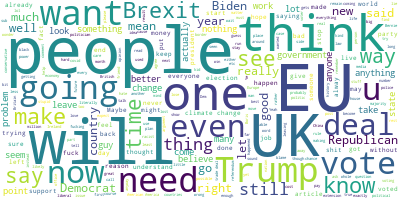

In [407]:
# !pip3 install wordcloud
from wordcloud import WordCloud
# Join the different processed titles together.
long_string = ','.join(list(df['body_parent'].values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

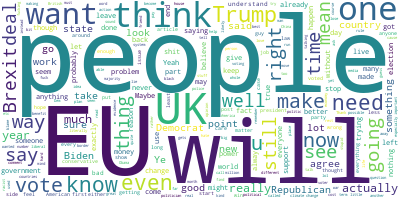

In [408]:
long_string = ','.join(list(df['body_child'].values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

In [506]:
from sklearn.cluster import KMeans
X = np.array(df['sbert_parent'].tolist())

kmeans = KMeans(n_clusters=5, random_state=0).fit(X)


In [654]:
# kmeans.labels_[:100]
c = kmeans.cluster_centers_

In [655]:
cos_centroid = []

for i, cent in enumerate(c):
    print(i)
    df_sub = df[df['kmeans_labels']== i]
    for s in df_sub['sbert_parent']:
        cos = 1 - spatial.distance.cosine(s, c[i])
        cos_centroid.append(cos)

0
1
2
3
4


In [663]:
df[['body_parent', 'cos_centroid_kmeans', 'kmeans_labels']]

,body_parent,cos_centroid_kmeans,kmeans_labels
0,So now that they have elected Biden how can we...,0.614428,2
1,"Tlaib, your family is Hamas. Funded by Iran a ...",0.566320,1
2,Most Republicans are happy with Biden as he wi...,0.532418,2
3,What is going to happen with this trend is tha...,0.600835,1
4,We gotta start normalizing defending ourselves...,0.533103,1
...,...,...,...
42889,"More fundamentally, Trump simply can't do the ...",0.553264,2
42890,I hope USA finds the vaccine first. That shoul...,0.432917,4
42891,Is there a postcard mailing project? I did tha...,0.539926,3
42892,Comical. We had a $1200 package until the GOP ...,0.539510,3


In [661]:
df['cos_centroid_kmeans'] = cos_centroid
# try and find the closest post to each centroid

for n in range(5):
    df_sub = df[df['kmeans_labels']== n]
    max_idx = df_sub['cos_centroid_kmeans'].idxmax()
    print(n)
    print(df_sub['body_parent'].loc[max_idx])

0
A climate shift was already believed to take place over decades for a while now. That's why the IPCC always extrapolates to 2100 and doesn't need to go further - because we're already talking about the short term. The shutdown has already been talked about, too - most in the community have concluded that it's unlikely and that it will simply slow down (the article mentions this). I guess we'll see how Hansen's paper is expanded upon later on, but this is far from a definitive projection.
1
I hope he tried to reason with them before disrespecting them like that...
2
Dianne Abbott does an absolutely fantastic job, despite all the shit she gets from all sides
3
If you want to find out who this is, send them an IP logger during school hours then pass their IP address onto the school IT team. They'll be able to single it down to a single device, then work with that to locate who it is.
4
Not only has Malta been independent since 1964, Its also in the EU and basically has the power to veto

In [509]:
df['kmeans_labels'] = kmeans.labels_

In [617]:
from sklearn.decomposition import PCA
pca = PCA(n_components=3)

df_pca = pd.DataFrame()
pca_result = pca.fit_transform(X)
df_pca['pca-one'] = pca_result[:,0]
df_pca['pca-two'] = pca_result[:,1] 
df_pca['pca-three'] = pca_result[:,2] 
df_pca['y'] = df['kmeans_labels']
# print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
# Explained variation per principal component: [0.09746116 0.07155445 0.06149531]
np.random.seed(42)
rndperm = np.random.permutation(df_pca.shape[0])

<AxesSubplot: xlabel='pca-one', ylabel='pca-two'>

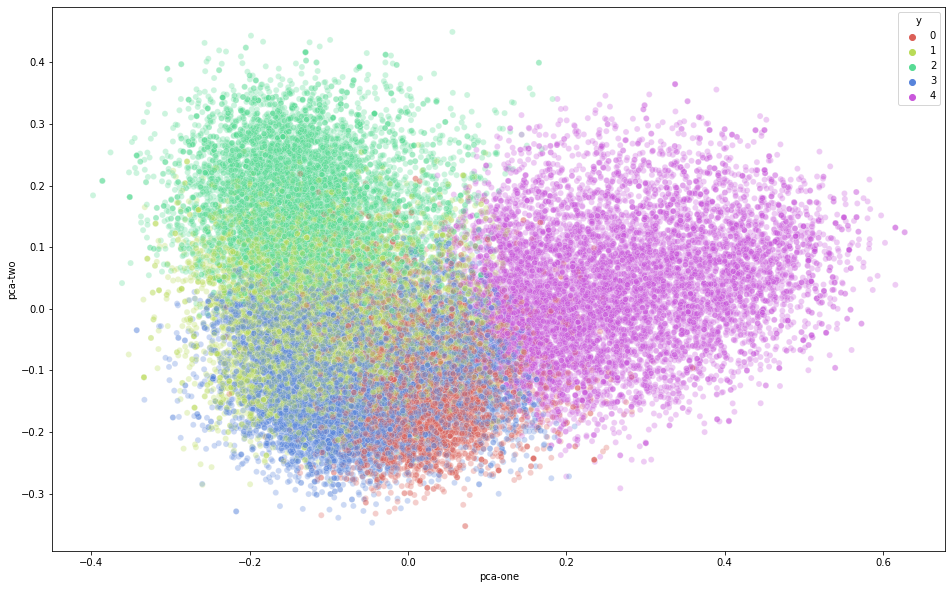

In [616]:
# !pip3 install seaborn
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

plt.figure(figsize=(16,10))
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="y",
    palette=sns.color_palette("hls", 5),
    data=df_pca.loc[rndperm,:],
    legend="full",
    alpha=0.3
)

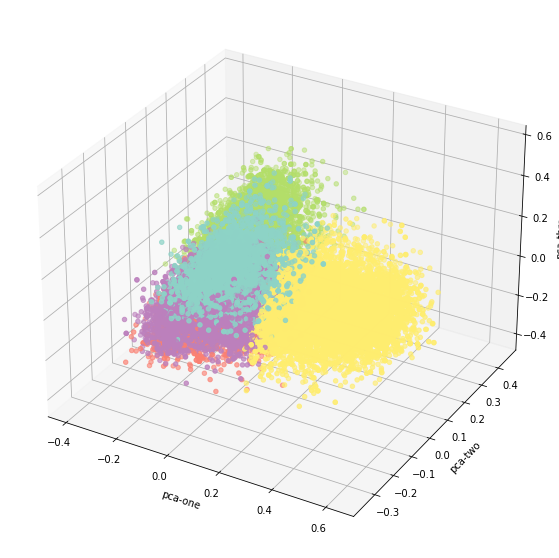

In [642]:
ax = plt.figure(figsize=(16,10)).add_subplot(projection='3d')
ax.scatter(
    xs=df_pca.loc[rndperm,:]["pca-one"], 
    ys=df_pca.loc[rndperm,:]["pca-two"], 
    zs=df_pca.loc[rndperm,:]["pca-three"], 
    c=df_pca.loc[rndperm,:]["y"], 
    cmap='Set3',
    
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
# plt.legend(loc="upper right")

plt.show()

In [643]:
# 0 is quite clearly climate
# 1 is maybe BlackLivesMatter? (black, white, police)?
# 2 is about election
# 3 Miscellaneous? topic words from all subs (us, eu, uk, right, deal)
# 4 is Brexit

for n in range(5):
    d = df['body_parent'][df['kmeans_labels']== n]
    print(n)
    print([i for i in pd.Series(' '.join(d).lower().split()).value_counts().index if i not in stopwords.words('english')][:50])

0
['climate', 'people', 'would', 'change', 'like', 'need', 'going', 'carbon', 'much', 'even', 'get', 'think', 'us', "i'm", 'one', 'make', 'still', '-', 'world', 'energy', 'global', 'way', 'also', 'years', 'could', 'fossil', 'really', 'many', 'good', 'co2', 'emissions', 'time', 'see', "that's", 'stop', 'new', "we're", 'take', 'want', 'already', 'change.', 'it.', 'know', "can't", 'go', 'fuel', 'every', 'use', 'actually', 'things']
1
['people', 'like', 'would', 'get', 'think', 'want', "i'm", 'black', 'one', 'even', 'white', 'right', 'trump', 'make', 'police', 'us', 'see', 'know', 'really', 'need', "that's", 'say', "they're", "can't", 'it.', 'going', 'many', 'way', 'someone', 'much', 'never', 'also', 'take', 'country', 'something', 'time', 'still', 'democrats', 'actually', 'every', 'anyone', 'thing', 'republicans', 'support', 'could', 'good', 'believe', 'left', 'government', 'trying']
2
['trump', 'biden', 'like', 'would', 'people', 'vote', 'get', 'think', "i'm", "he's", 'going', 'republica

In [646]:
for i, s in df['body_parent'][df['kmeans_labels'] == 3].iloc[10:20].iteritems():
    print(df['subreddit'].loc[i])
    print('SENT',s)

Brexit
SENT What a garbage cop put answer. Really? it has to be a "guarded" border? No, ANY border infrastructure would be bad and that is what he should have said!
Brexit
SENT Two generations' lifes stolen, so that Farage and Rees-Mogg can feel comfortable. So sad.
Brexit
SENT The WA lasts forever. The transition period ends 31 Dec 2020. Unless Boris the big fat liar extends it despite saying he won't.
climate
SENT Until it's realized how much has to be cut. Then the yellow vests come out.
Brexit
SENT Where is Gibraltar going to get 12,000 people to work in the hotels, resorts, and casinos???
Brexit
SENT Trying to negotiate with Barnier is a losing strategy. I agree with Varoufakis on this particular point. So I don't think this fact is a problem at all.
Brexit
SENT I try to give people benefit of the doubt, but unless you provide proof i'm going to have a very hard time believing you. Unless you went to Barnsley, in which case it's your own fault. That place has an international repu

In [647]:
for i, s in df['body_parent'][df['kmeans_labels'] == 1].iloc[:10].iteritems():
    print(df['subreddit'].loc[i])
    print('SENT',s)

Republican
SENT Tlaib, your family is Hamas. Funded by Iran a state sponsor of terrorism. Hamas is a terrorist organization 3000 rockets shot at innocent civilians. All you do is speak negatively about the US. You are solely in power for evil ways and means. I think your a really shitty politician that is anti-American.
Republican
SENT What is going to happen with this trend is that police will not risk getting charged and will not use their weapon unless it is absolutely necessary. This means a lot of thugs will be able to run away and escape police and keep committing crimes. This guy apparently wasn't a thug. Resisting arrest and being dumb enough to steal a taser and fire it at the police cost him his life. The moment police eases down on enforcement, thugs will feel empowered and crime will grow. The losers at the end will be us, the law abiding citizens.
Republican
SENT We gotta start normalizing defending ourselves against women. Screw all that "they're weaker" bs they need cons

In [535]:
len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 0) & (df['subreddit'] == 'climate')])/len(df[df['kmeans_labels']==0])

0.7603070175438597

In [553]:
len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 4) & (df['subreddit'] == 'Brexit')])/len(df[df['kmeans_labels']==4])

0.9901861594496155

In [605]:
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 2) & (df['subreddit'] == 'democrats')])/len(df[df['kmeans_labels']==2]))
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 2) & (df['subreddit'] == 'Republican')])/len(df[df['kmeans_labels']==2]))

0.5475177304964539
0.33144208037825057


In [608]:
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 1) & (df['subreddit'] == 'Republican')])/len(df[df['kmeans_labels']==1]))
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 1) & (df['subreddit'] == 'democrats')])/len(df[df['kmeans_labels']==1]))
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 1) & (df['subreddit'] == 'Brexit')])/len(df[df['kmeans_labels']==1]))
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 1) & (df['subreddit'] == 'BlackLivesMatter')])/len(df[df['kmeans_labels']==1]))
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 1) & (df['subreddit'] == 'climate')])/len(df[df['kmeans_labels']==1]))

0.43324622202022495
0.2406544710828315
0.14282467901374843
0.10919213725712987
0.07408249062606521


In [609]:
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 3) & (df['subreddit'] == 'Brexit')])/len(df[df['kmeans_labels']==3]))
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 3) & (df['subreddit'] == 'Republican')])/len(df[df['kmeans_labels']==3]))
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 3) & (df['subreddit'] == 'democrats')])/len(df[df['kmeans_labels']==3]))
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 3) & (df['subreddit'] == 'climate')])/len(df[df['kmeans_labels']==3]))
print(len(df[['body_parent', 'kmeans_labels', 'subreddit']][(df['kmeans_labels'] == 3) & (df['subreddit'] == 'BlackLivesMatter')])/len(df[df['kmeans_labels']==3]))

0.3321118956117616
0.2572169094646528
0.22718741621235142
0.10394137098936455
0.0795424077218697


In [552]:
# df['subreddit'][df['kmeans_labels'] ==4].mode()

0    Brexit
Name: subreddit, dtype: object